# <span style='color:SteelBlue'>P5 - Segmentez des clients d'un site e-commerce</span>

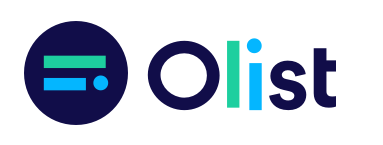

# <span class='bg-primary'>P5_03 - CLUSTERING - APPRENTISSAGE NON SUPERVISÉ</span>

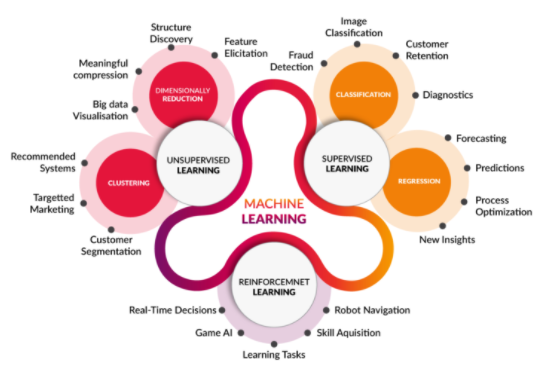

**Apprentissage non supervisé** :
- Consiste à inférer des connaissances sur les données :
    - [X] Sur la seule base des échantillons d'apprentissage,
    - [X] Pas de cible, recherche de structures naturelles dans les données.
    
**Différentes tâches sont associées à l'apprentissage non
supervisé** :
- **Clustering** (**segmentation**, **regroupement**) : construire des classes automatiquement en fonction des exemples disponibles. L'apprentissage non supervisé est très souvent synonyme de clustering.
- **Règles d'association** : analyser les relations entre les variables ou détecter des associations.
- **Réduction de dimensions**.

## <span style='background:Thistle'>Sommaire du notebook</span> 

In [1]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

## <span style='background:Thistle'>1. Introduction</span>

**Mission**
*****
Fournir aux équipes Marketing de l'entreprise Olist (site de e-commerce) une **segmentation des clients** utilisables dans leurs campagnes de communication.

**Objectifs**
*****
- **Comprendre** les différents **types d'utilisateurs** (comportements, données personnelles)
- **Fournir** une **description actionabl**e de la segmentation avec une logique sous-jacente pour une optimisation optimale
- **Proposer** un **contrat de maintenance** basé sur une analyse de la stabilité des segments au cours du temps.

**Sources**
*****
- [Jeu de données](https://www.kaggle.com/olistbr/brazilian-ecommerce/code)

In [2]:
# Chargement des librairies
import jyquickhelper
from datetime import datetime
# import datetime as dt
import numpy as np
import pandas as pd
import sys
import time
import pickle
from math import pi

# Librairies personnelles
import outils_data
import outils_visu
import outils_acp
import outils_segmentation

# Data visualisation
import matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import folium

# Pré processing
from sklearn.preprocessing import PowerTransformer, StandardScaler, \
    MinMaxScaler

# Réduction dimension
from sklearn.manifold import TSNE, Isomap
from sklearn.decomposition import PCA
from umap import UMAP
import umap.umap_ as umap

# Clustering
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, OPTICS
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn import mixture
import hdbscan
from kmodes.kprototypes import KPrototypes

# Clustering Visualisation
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# Clustering Metrics
from sklearn import metrics
from sklearn.metrics import davies_bouldin_score, silhouette_score

# Classification modélisation
from lightgbm import LGBMClassifier
import shap
from sklearn.model_selection import cross_val_score

# Warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
# Chargement à chaud des librairies personnelles
%load_ext autoreload
%autoreload 2
# Valide code pep8
%load_ext pycodestyle_magic
%pycodestyle_on
# %pycodestyle_off

# Versions
print('Version des librairies utilisées :')
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Matplotlib            : ' + mpl.__version__)
print('Seaborn               : ' + sns.__version__)
print('jyquickhelper         : ' + jyquickhelper.__version__)
print('Outils dataframe      : ' + outils_data.__version__)
print('Outils visualisation  : ' + outils_visu.__version__)
print('Outils acp            : ' + outils_acp.__version__)
print('Outils segmentation   : ' + outils_segmentation.__version__)

now = datetime.now().isoformat()
print('Lancé le           : ' + now)

Version des librairies utilisées :
Python                : 3.8.8 (default, Feb 24 2021, 15:54:32) [MSC v.1928 64 bit (AMD64)]
NumPy                 : 1.19.5
Pandas                : 1.2.2
Matplotlib            : 3.3.4
Seaborn               : 0.11.0
jyquickhelper         : 0.4.220
Outils dataframe      : 0.0.2
Outils visualisation  : 0.0.2
Outils acp            : 0.0.1
Outils segmentation   : 0.0.0
Lancé le           : 2021-05-21T07:59:41.949335


In [3]:
dico_pd_option = {
    'display.max_rows': 400,
    'display.max_column': 200,
    'display.width': 100,
    'display.precision': 5,
    'display.max_colwidth': 200
}
for cle, val in dico_pd_option.items():
    pd.set_option(cle, val)

## <span style='background:Thistle'>6. Clustering hiérarchique</span>

### <span style='background:PowderBlue; font-size:16px'>**6.1. CAH - Approche hiérarchique ascendante (ou agglomération)**</span>

**Note** :
***
- La classification ascendante hiérarchique est dite "ascendante" car elle part d'une situation où tous les individus sont seuls dans une classe, puis sont rassemblés en classes de plus en plus grandes. Le qualificatif hiérarchique vient du fait qu'elle produit une hiérarchie H, l'ensemble des classes à toutes les étapes de l'algorithme, qui vérifie les propriétés suivantes :
    - au sommet de la hiérarchie, lorsqu'on groupe de manière à obtenir une seule classe, tous les individus sont regroupés ;
    - en bas de la hiérarchie, tous les individus se trouvent seuls ;
    - si l’on considère deux classes du regroupement, alors soit elles n'ont pas d’individu en commun, soit l'une est incluse dans l’autre.
- La méthode suppose qu'on dispose d'une mesure de dissimilarité entre les individus; dans le cas de points situés dans un espace euclidien, on peut utiliser la distance comme mesure de dissimilarité. 

**Hyperparamètres** :
***
- **n_clusters** : int ou None, default=2, le nombre de clusters à trouver. Il doit être None si distance_threshold n'est pas None.
- **affinity** : str ou appelable, par défaut='euclidienne'. Métrique utilisée pour calculer le lien. Peut être "euclidienne", "l1", "l2", "manhattan", "cosinus" ou "précalculée". Si le lien est "ward", seul "euclidien" est accepté. Si "precomputed", une matrice de distance (au lieu d'une matrice de similarité) est nécessaire comme entrée pour la méthode d'ajustement.
- **linkage** : {'ward', 'complete', 'average', 'single'}, default='ward', lLe critère de liaison à utiliser. Le critère de liaison détermine la distance à utiliser entre les ensembles d'observations. L'algorithme fusionnera les paires de cluster qui minimisent ce critère.
    - 'ward' minimise la variance des clusters fusionnés.
    - 'average' utilise la moyenne des distances de chaque observation des deux ensembles.
    - Le lien 'complet' ou 'maximum' utilise les distances maximales entre toutes les observations des deux ensembles.
    - single' utilise le minimum des distances entre toutes les observations des deux ensembles.

**Dans la pratique** :
- Le clustering hiérarchique agglomératif ne peut être adapté que sur moins de 35000 clients, en raison de l'énorme besoin en mémoire des algorithmes.

**Les métriques utilisées** :
- **Coefficient de silhouette** : mesure la différence entre la distance quadratique moyenne intra-groupe et celle du groupe le plus proche (à maximiser).
- **Indice de Davies_Bouldin** : mesure le rapport maximal de la dispersion des paires de clusters par rapport à leur distance (à minimiser).
- **Score de Calinski_Harabasz** : le rapport entre la dispersion inter-clusters et la dispersion intra-clusters (à maximiser).

In [22]:
# Impossible de lancer CAH sur plus de 35000 clients à cause de problème
# de mémoire ==> on lance sur 20000 clients
data_reduit = X_scaled_log.sample(20000, random_state=seed).copy()
X_reduit = data_reduit.values
X_names = data_reduit.index

In [28]:
# Dataframe de sauvegarde des résultats des métriques CAH
df_metrics_cah = pd.DataFrame()

In [29]:
# Tuning hyperparametres n_clusters, linkage, affinity
# --------------------------------------------------------------------
# Métriques pour les données quantitatives standardisées transformées
# en logarithme
n_clusters = range(3, 10)
linkage = ['complete', 'average', 'single']
affinity = ['euclidean', 'manhattan', 'cosine']
param_grid_cah = [n_clusters, linkage, affinity]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_cah = \
    outils_segmentation.calcul_metrics_cah(X_reduit,
                                           df_metrics_cah,
                                           'CAH quant log', seed,
                                           param_grid_cah)
df_metrics_cah.style.hide_index()

Type_données,n_clusters,linkage,affinity,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
CAH quant log,3,complete,euclidean,0.632406,0.688934,146.647674,14.533449
CAH quant log,3,complete,manhattan,0.449060,1.086363,811.945837,13.870717
CAH quant log,3,complete,cosine,0.126352,2.352025,2452.968475,13.517780
CAH quant log,3,average,euclidean,0.572532,0.768739,180.002469,14.681915
CAH quant log,3,average,manhattan,0.615970,0.865050,211.171223,14.014516
CAH quant log,3,average,cosine,0.111083,2.356202,2551.414094,13.795460
CAH quant log,3,single,euclidean,0.746952,0.173287,30.511728,4.501590
CAH quant log,3,single,manhattan,0.746952,0.173287,30.511728,3.572127
CAH quant log,3,single,cosine,0.088306,0.761883,1.609962,5.476562
CAH quant log,4,complete,euclidean,0.407896,1.090798,498.972265,14.939634


In [30]:
# Métriques pour les données quantitatives standardisées transformées
# en logarithme
n_clusters = range(3, 10)
linkage = ['ward']
affinity = ['euclidean']
param_grid_cah_2 = [n_clusters, linkage, affinity]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_cah = \
    outils_segmentation.calcul_metrics_cah(X_reduit,
                                           df_metrics_cah,
                                           'CAH quant log', seed,
                                           param_grid_cah_2)
df_metrics_cah.style.hide_index()

Type_données,n_clusters,linkage,affinity,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
CAH quant log,3,complete,euclidean,0.632406,0.688934,146.647674,14.533449
CAH quant log,3,complete,manhattan,0.449060,1.086363,811.945837,13.870717
CAH quant log,3,complete,cosine,0.126352,2.352025,2452.968475,13.517780
CAH quant log,3,average,euclidean,0.572532,0.768739,180.002469,14.681915
CAH quant log,3,average,manhattan,0.615970,0.865050,211.171223,14.014516
CAH quant log,3,average,cosine,0.111083,2.356202,2551.414094,13.795460
CAH quant log,3,single,euclidean,0.746952,0.173287,30.511728,4.501590
CAH quant log,3,single,manhattan,0.746952,0.173287,30.511728,3.572127
CAH quant log,3,single,cosine,0.088306,0.761883,1.609962,5.476562
CAH quant log,4,complete,euclidean,0.407896,1.090798,498.972265,14.939634


In [38]:
# Coefficient de silhouette : le plus proche de 1 possible
df_metrics_cah.sort_values(by='coef_silh', ascending=False).head(4)

,Type_données,n_clusters,linkage,affinity,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
6,CAH quant log,3,single,euclidean,0.746952,0.173287,30.511728,4.501590
7,CAH quant log,3,single,manhattan,0.746952,0.173287,30.511728,3.572127
16,CAH quant log,4,single,manhattan,0.692116,0.193464,26.767468,3.580008
0,CAH quant log,3,complete,euclidean,0.632406,0.688934,146.647674,14.533449


In [41]:
# Indice de Davies-Bouldin : le plus proche de 0.
df_metrics_cah.sort_values(by='davies_bouldin').head(4)

,Type_données,n_clusters,linkage,affinity,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
6,CAH quant log,3,single,euclidean,0.746952,0.173287,30.511728,4.501590
7,CAH quant log,3,single,manhattan,0.746952,0.173287,30.511728,3.572127
16,CAH quant log,4,single,manhattan,0.692116,0.193464,26.767468,3.580008
25,CAH quant log,5,single,manhattan,0.599791,0.225973,22.820091,3.592953


In [43]:
# Score de Calinski-Harabsz : le plus grand possible
df_metrics_cah.sort_values(by='calinski_harabasz', ascending=False).head(4)

,Type_données,n_clusters,linkage,affinity,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
5,CAH quant log,3,average,cosine,0.111083,2.356202,2551.414094,13.795460
63,CAH quant log,3,ward,euclidean,0.100884,2.291615,2487.798427,15.037967
2,CAH quant log,3,complete,cosine,0.126352,2.352025,2452.968475,13.517780
14,CAH quant log,4,average,cosine,0.122422,2.360275,2234.608304,13.892287


**Bilan** :
- Silhouette : 3 clusters, single, euclidean.
- Davies-Bouldin : 3 clusters, single, euclidean.
- Calinski-Harabsz : 3 clusters, average, cosine.

**Visualisation de l'effet des clusters sur les scores**

In [31]:
# Constitution du dataframes de visualisation
df_cah = \
    df_metrics_cah[df_metrics_cah['Type_données'] == 'CAH quant log']

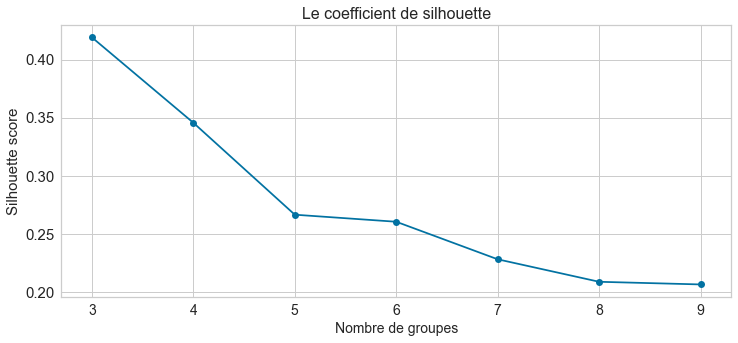

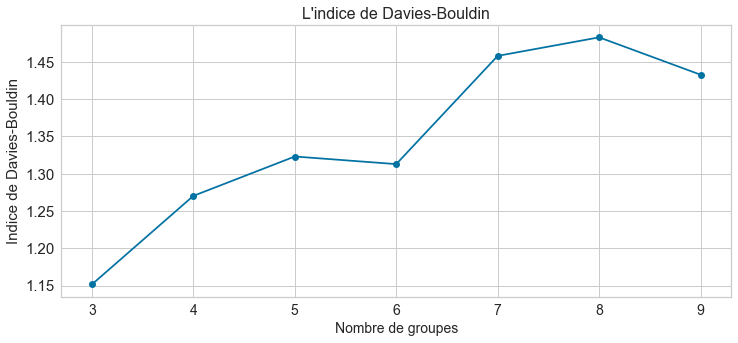

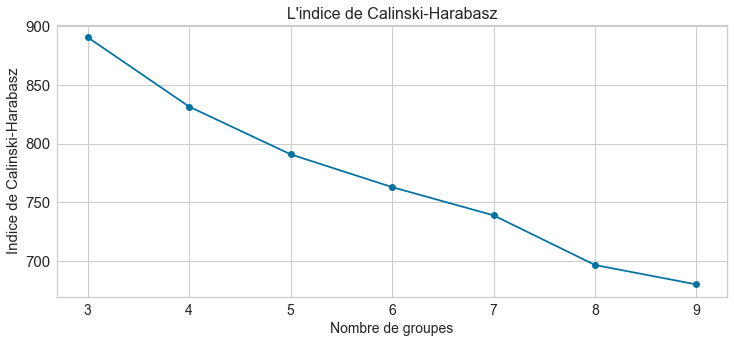

In [32]:
# Visualisation de l'effet des clusters sur les scores
outils_segmentation.affiche_effet_clusters_score(df_cah, 3, 10)

**Bilan** :
***
Les meilleurs hyperparamètres :
- n_clusters : 3.
- linkage : single.
- affinity : euclidean.

<span style='background:Moccasin; font-size:16px'>**6.1.1. CAH avec meilleurs paramètres**</span>

In [26]:
# Instanciation de cah avec les meilleurs paramètres
cah = AgglomerativeClustering(n_clusters=3,
                              linkage='single',
                              affinity='euclidean')
# Entraînement du modèle
cah.fit(X_scaled_log)
cah_labels = cah.labels_

**Nombre de clients par clusters**

Clusters,Nb_clients,%
0,91817,100.00000
1,1,0.00000
2,1,0.00000


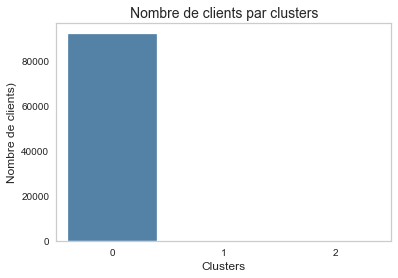

In [28]:
outils_segmentation.affiche_clients_par_clusters(cah_labels)

**Projection en 2D**

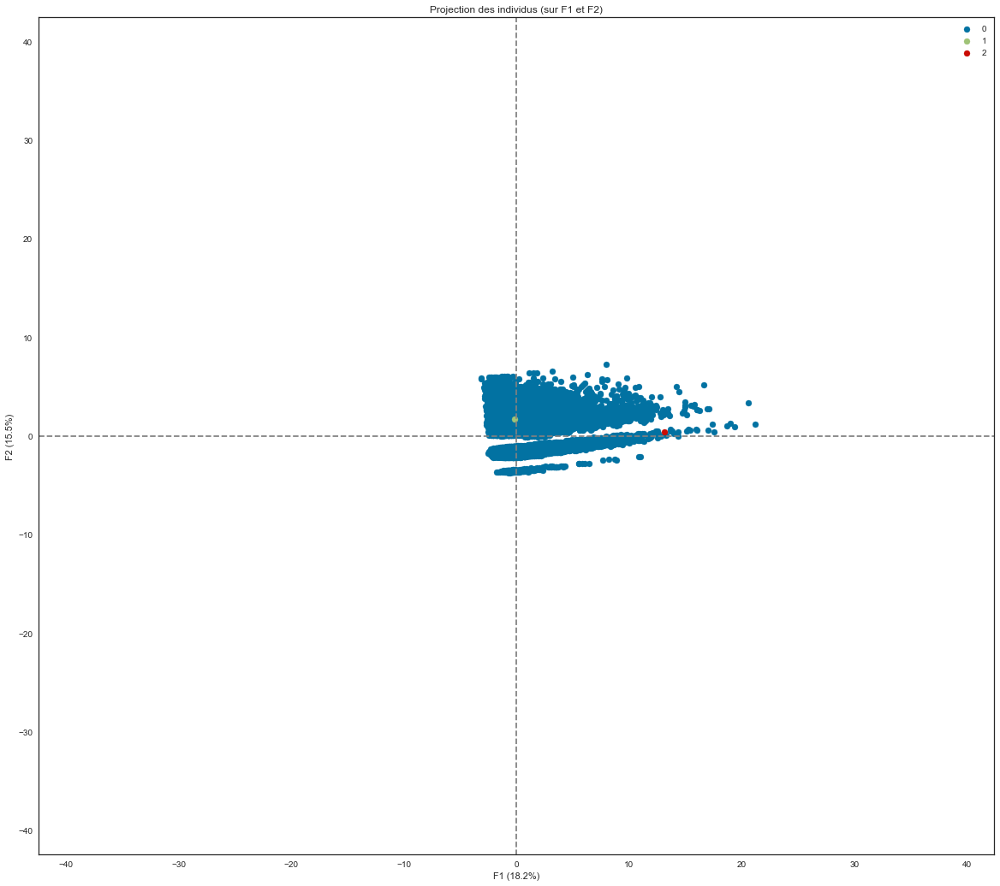

In [30]:
# Visualisation avec ACP
outils_acp.display_factorials_planes(X_projected_log_acp, n_comp_log,
                                     pca_log, [(0, 1)], alpha=1,
                                     illustrative_var=cah_labels)

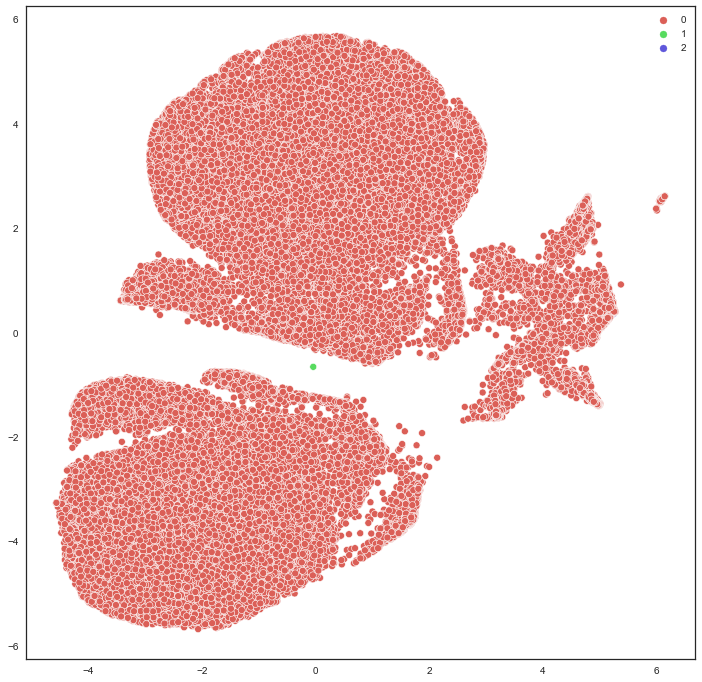

In [31]:
# Visualisation en 2D avec t-SNE
outils_segmentation.affiche_tsne_par_clusters(tsne_log, cah_labels, 3)

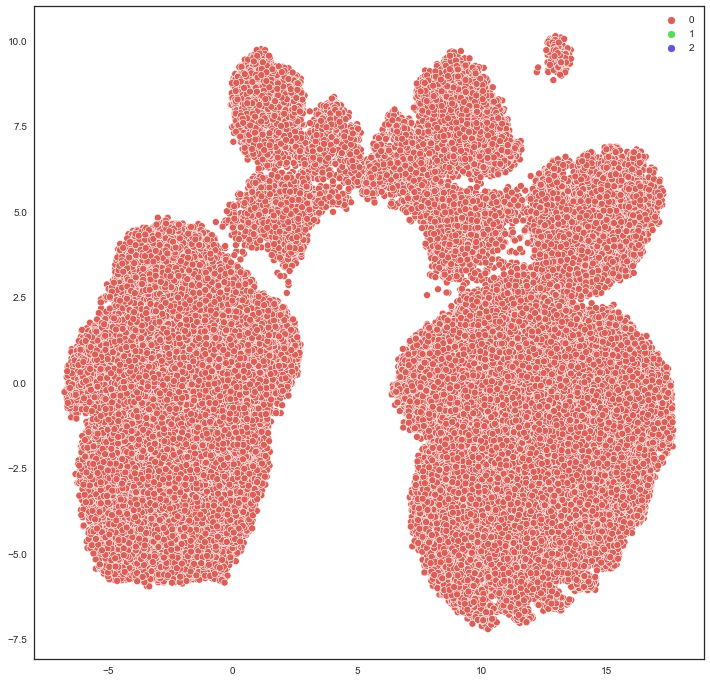

In [34]:
# Visualisation en 2D avec UMAP
outils_segmentation.affiche_umap_par_clusters(X_projected_umap_log,
                                              cah_labels, 3)

<span style='background:Moccasin; font-size:16px'>**6.1.2. CAH avec 4 clusters**</span>

In [40]:
# Instanciation de cah avec 4 clusters + meilleurs hyperparamètres
cah_4 = AgglomerativeClustering(n_clusters=4,
                                linkage='single',
                                affinity='manhattan')
# Entraînement du modèle
cah_4.fit(X_scaled_log)
cah_4_labels = cah_4.labels_

**Nombre de clients par clusters**

Clusters,Nb_clients,%
0,91816,100.00000
1,1,0.00000
2,1,0.00000
3,1,0.00000


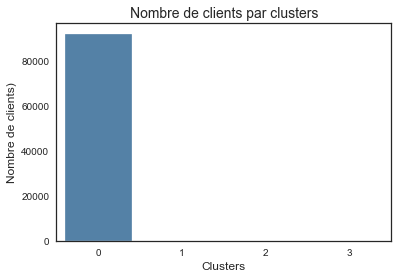

In [41]:
outils_segmentation.affiche_clients_par_clusters(cah_4_labels)

**Projection en 2D**

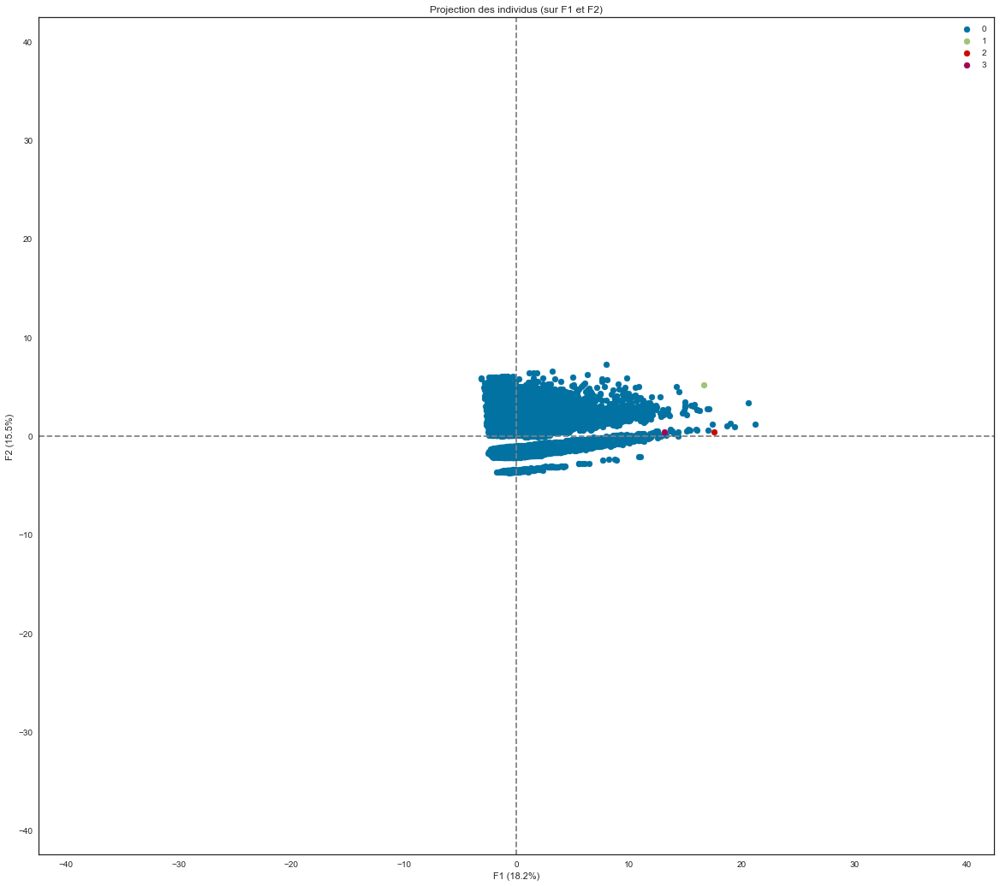

In [42]:
# Visualisation avec ACP
outils_acp.display_factorials_planes(X_projected_log_acp, n_comp_log,
                                     pca_log, [(0, 1)], alpha=1,
                                     illustrative_var=cah_4_labels)

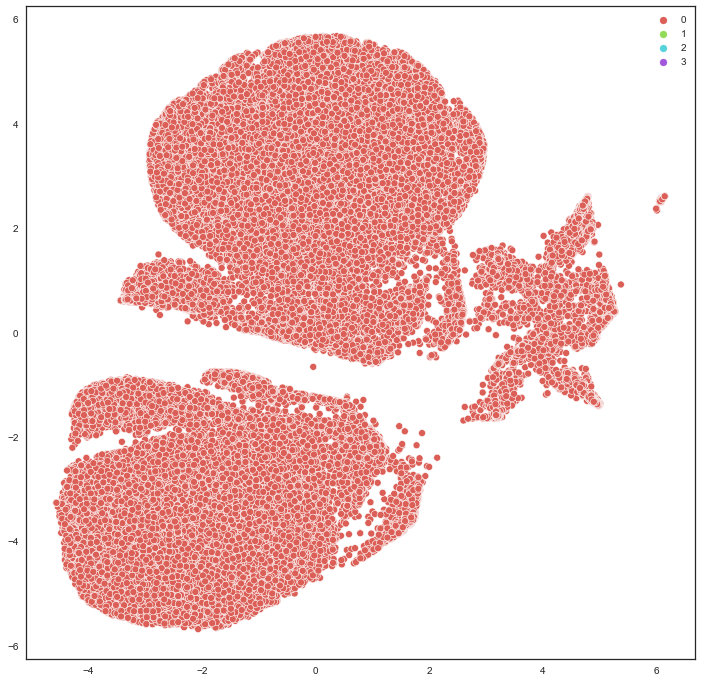

In [43]:
# Visualisation en 2D avec t-SNE
outils_segmentation.affiche_tsne_par_clusters(tsne_log, cah_4_labels, 4)

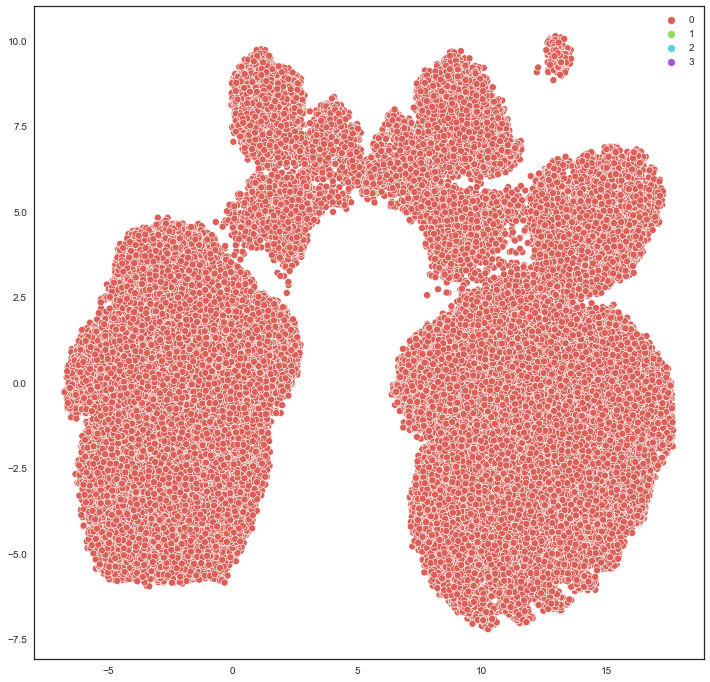

In [45]:
# Visualisation en 2D avec UMAP
outils_segmentation.affiche_umap_par_clusters(X_projected_umap_log,
                                              cah_4_labels, 4)

<span style='background:Moccasin; font-size:16px'>**6.1.3. CAH avec 5 clusters**</span>

In [46]:
# Instanciation de cah avec 5 clusters + meilleurs hyperparamètres
cah_5 = AgglomerativeClustering(n_clusters=5,
                                linkage='single',
                                affinity='manhattan')
# Entraînement du modèle
cah_5.fit(X_scaled_log)
cah_5_labels = cah_5.labels_

**Nombre de clients par clusters**

Clusters,Nb_clients,%
0,91815,100.00000
1,1,0.00000
2,1,0.00000
3,1,0.00000
4,1,0.00000


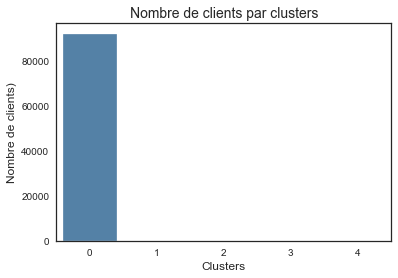

In [47]:
outils_segmentation.affiche_clients_par_clusters(cah_5_labels)

**Projection en 2D**

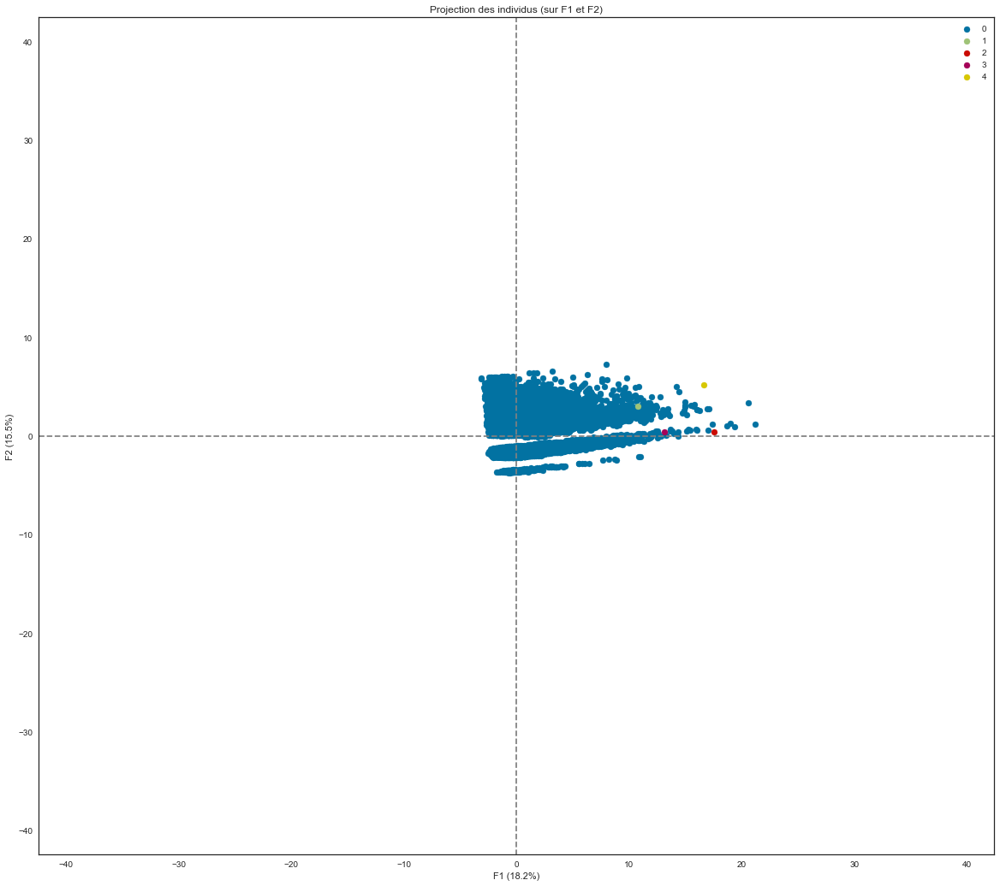

In [48]:
# Visualisation avec ACP
outils_acp.display_factorials_planes(X_projected_log_acp, n_comp_log,
                                     pca_log, [(0, 1)], alpha=1,
                                     illustrative_var=cah_5_labels)

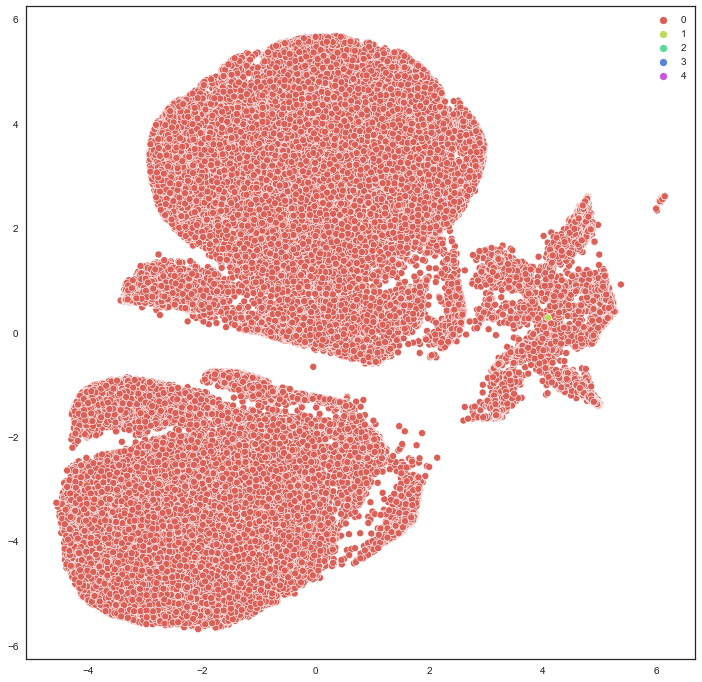

In [49]:
# Visualisation en 2D avec t-SNE
outils_segmentation.affiche_tsne_par_clusters(tsne_log, cah_5_labels, 5)

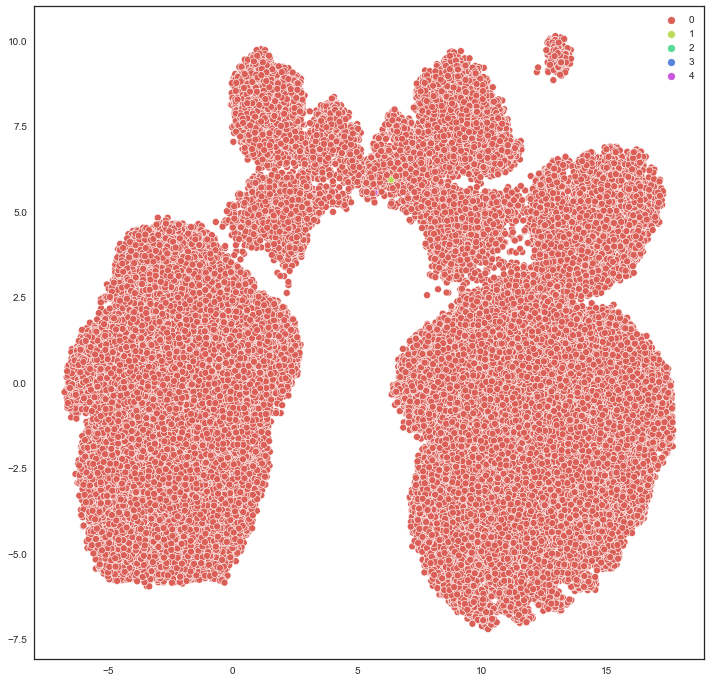

In [50]:
# Visualisation en 2D avec UMAP
outils_segmentation.affiche_umap_par_clusters(X_projected_umap_log,
                                              cah_5_labels, 5)

**Bilan** :
***
- CAH ne parvient pas à segmenter les clients et ne trouve qu'un seul cluster et un cluster de bruit. 
- Cela indique bien que le jeu de données est biaisé avec 96% de clients ayant effectué une seule commande.

### <span style='background:PowderBlue; font-size:16px'>**6.2. ACP + CAH**</span>

In [57]:
# Impossible de lancer CAH sur plus de 35000 clients à cause de problème
# de mémoire ==> on lance sur 20000 clients
df_acp = pd.DataFrame(X_projected_log_acp)
data_reduit_acp = df_acp.sample(20000, random_state=seed).copy()
X_reduit_acp = data_reduit_acp.values
X_names_acp = data_reduit_acp.index

In [58]:
# Dataframe de sauvegarde des résultats des métriques ACP + CAH
df_metrics_cah_acp = pd.DataFrame()

In [59]:
# Tuning hyperparametres n_clusters, linkage, affinity
# --------------------------------------------------------------------
# Métriques pour les données quantitatives standardisées transformées
# en logarithme
n_clusters = range(3, 10)
linkage = ['complete', 'average', 'single']
affinity = ['euclidean', 'manhattan', 'cosine']
param_grid_cah = [n_clusters, linkage, affinity]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_cah_acp = \
    outils_segmentation.calcul_metrics_cah(X_reduit_acp,
                                           df_metrics_cah_acp,
                                           'ACP+CAH quant log', seed,
                                           param_grid_cah)
df_metrics_cah_acp.style.hide_index()

Type_données,n_clusters,linkage,affinity,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
ACP+CAH quant log,3,complete,euclidean,0.44824,0.91021,1002.77374,13.91623
ACP+CAH quant log,3,complete,manhattan,0.25332,1.33587,1425.74559,14.45542
ACP+CAH quant log,3,complete,cosine,0.16781,2.20168,2653.11584,17.21245
ACP+CAH quant log,3,average,euclidean,0.44327,0.43244,127.56498,13.66289
ACP+CAH quant log,3,average,manhattan,0.40015,0.69321,133.21397,13.13895
ACP+CAH quant log,3,average,cosine,0.14100,2.11900,3115.38593,12.60072
ACP+CAH quant log,3,single,euclidean,0.44320,0.33246,19.64784,3.41816
ACP+CAH quant log,3,single,manhattan,0.73880,0.17507,30.46068,2.68338
ACP+CAH quant log,3,single,cosine,-0.22179,1.45132,2.63640,4.54573
ACP+CAH quant log,4,complete,euclidean,0.08140,1.93919,1206.69614,13.10741


In [60]:
# Métriques pour les données quantitatives standardisées transformées
# en logarithme
n_clusters = range(3, 10)
linkage = ['ward']
affinity = ['euclidean']
param_grid_cah_2 = [n_clusters, linkage, affinity]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_cah_acp = \
    outils_segmentation.calcul_metrics_cah(X_reduit_acp,
                                           df_metrics_cah_acp,
                                           'CAH quant log', seed,
                                           param_grid_cah_2)
df_metrics_cah_acp.style.hide_index()

Type_données,n_clusters,linkage,affinity,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
ACP+CAH quant log,3,complete,euclidean,0.44824,0.91021,1002.77374,13.91623
ACP+CAH quant log,3,complete,manhattan,0.25332,1.33587,1425.74559,14.45542
ACP+CAH quant log,3,complete,cosine,0.16781,2.20168,2653.11584,17.21245
ACP+CAH quant log,3,average,euclidean,0.44327,0.43244,127.56498,13.66289
ACP+CAH quant log,3,average,manhattan,0.40015,0.69321,133.21397,13.13895
ACP+CAH quant log,3,average,cosine,0.14100,2.11900,3115.38593,12.60072
ACP+CAH quant log,3,single,euclidean,0.44320,0.33246,19.64784,3.41816
ACP+CAH quant log,3,single,manhattan,0.73880,0.17507,30.46068,2.68338
ACP+CAH quant log,3,single,cosine,-0.22179,1.45132,2.63640,4.54573
ACP+CAH quant log,4,complete,euclidean,0.08140,1.93919,1206.69614,13.10741


In [61]:
# Coefficient de silhouette : le plus proche de 1 possible
df_metrics_cah_acp.sort_values(by='coef_silh', ascending=False).head(4)

,Type_données,n_clusters,linkage,affinity,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
7,ACP+CAH quant log,3,single,manhattan,0.73880,0.17507,30.46068,2.68338
16,ACP+CAH quant log,4,single,manhattan,0.69032,0.19395,26.62533,2.62325
25,ACP+CAH quant log,5,single,manhattan,0.58432,0.23038,22.49986,2.64969
43,ACP+CAH quant log,7,single,manhattan,0.58170,0.32460,22.12205,2.63235


In [62]:
# Indice de Davies-Bouldin : le plus proche de 0.
df_metrics_cah_acp.sort_values(by='davies_bouldin').head(4)

,Type_données,n_clusters,linkage,affinity,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
7,ACP+CAH quant log,3,single,manhattan,0.73880,0.17507,30.46068,2.68338
16,ACP+CAH quant log,4,single,manhattan,0.69032,0.19395,26.62533,2.62325
25,ACP+CAH quant log,5,single,manhattan,0.58432,0.23038,22.49986,2.64969
34,ACP+CAH quant log,6,single,manhattan,0.58160,0.23815,20.31478,2.65318


In [63]:
# Score de Calinski-Harabsz : le plus grand possible
df_metrics_cah_acp.sort_values(by='calinski_harabasz', ascending=False).head(4)

,Type_données,n_clusters,linkage,affinity,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
63,CAH quant log,3,ward,euclidean,0.14483,2.10299,3146.55946,13.61401
5,ACP+CAH quant log,3,average,cosine,0.14100,2.11900,3115.38593,12.60072
64,CAH quant log,4,ward,euclidean,0.15661,2.06800,2801.13781,13.35066
14,ACP+CAH quant log,4,average,cosine,0.15288,2.14939,2723.18496,12.22117


**Bilan** :
- Silhouette : 3 clusters, single, manhattan.
- Davies-Bouldin : 3 clusters, single, manhattan.
- Calinski-Harabsz : 3 clusters, ward, euclidean.

**Visualisation de l'effet des clusters sur les scores**

In [65]:
# Constitution du dataframes de visualisation
df_cah_acp = \
    df_metrics_cah_acp[df_metrics_cah_acp['Type_données']
                       == 'CAH quant log']

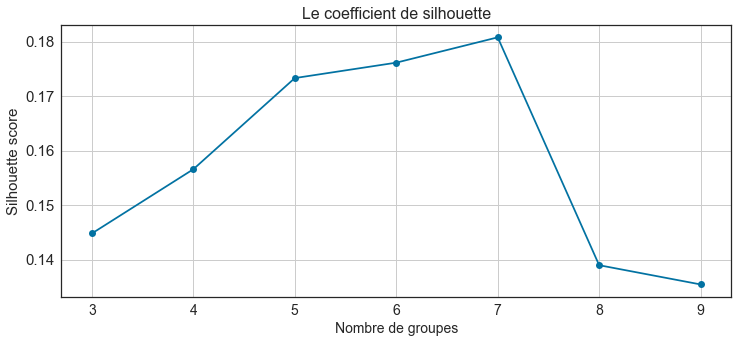

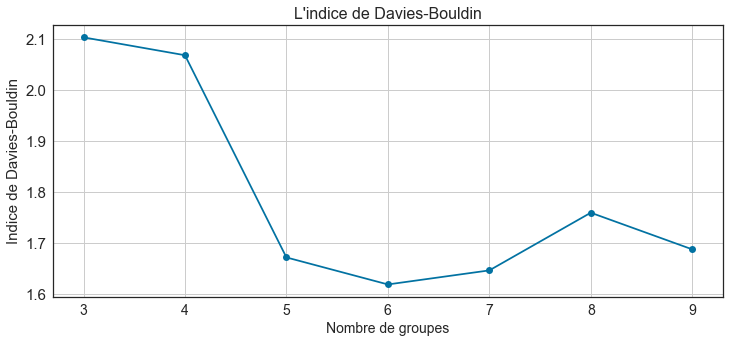

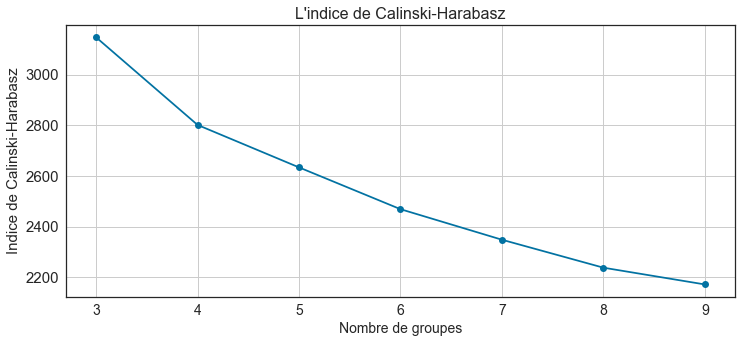

In [66]:
# Visualisation de l'effet des clusters sur les scores
outils_segmentation.affiche_effet_clusters_score(df_cah_acp, 3, 10)

**Bilan** :
***
Les meilleurs hyperparamètres :
- n_clusters : 3.
- linkage : single.
- affinity : manhattan.

<span style='background:Moccasin; font-size:16px'>**6.2.1. ACP + CAH avec meilleurs paramètres**</span>

In [67]:
# Instanciation de cah avec les meilleurs paramètres
cah_acp = AgglomerativeClustering(n_clusters=3,
                                  linkage='single',
                                  affinity='manhattan')
# Entraînement du modèle
cah_acp.fit(X_projected_log_acp)
cah_acp_labels = cah_acp.labels_

**Nombre de clients par clusters**

Clusters,Nb_clients,%
0,91817,100.00000
1,1,0.00000
2,1,0.00000


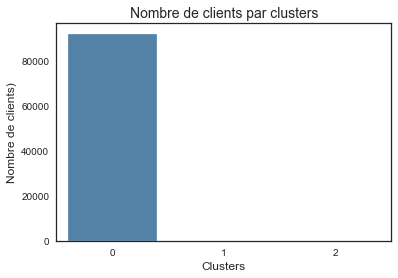

In [68]:
outils_segmentation.affiche_clients_par_clusters(cah_acp_labels)

**Bilan** :
***
- ACP + CAH ne parvient pas à segmenter les clients et ne trouve qu'un seul cluster et un cluster de bruit. 
- Cela indique bien que le jeu de données est biaisé avec 96% de clients ayant effectué une seule commande.

### <span style='background:PowderBlue; font-size:16px'>**6.3. Dendrogramme avec Scipy**</span>

In [52]:
# Impossible de lancer linkage sur plus de 35000 clients à cause de
# problème de mémoire ==> on lance sur 20000 clients
data_link_reduit = X_scaled_log.sample(20000, random_state=seed).copy()
X_link_reduit = data_link_reduit.values
X_link_names = data_link_reduit.index

In [53]:
# Clustering hiérarchique (critère de Ward)
Z = linkage(X_link_reduit, 'ward')

In [54]:
# Préparation dataframe d'interprétation
# Ajout de l'assignation du cluster au dataframe
data_dendo = data_clients.copy()
data_dendo = data_dendo.loc[X_link_names, :]
data_dendo['Cluster'] = fcluster(Z, 4, criterion='maxclust')
dendo_labels = data_dendo['Cluster']

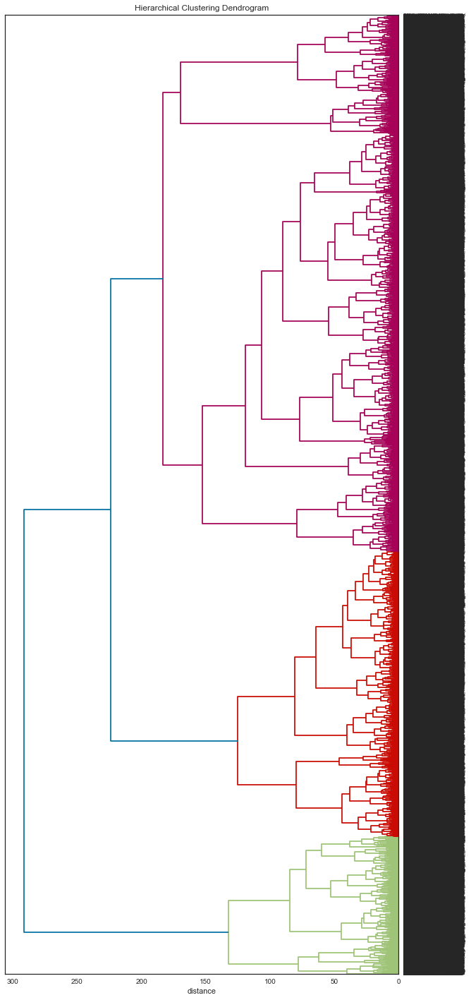

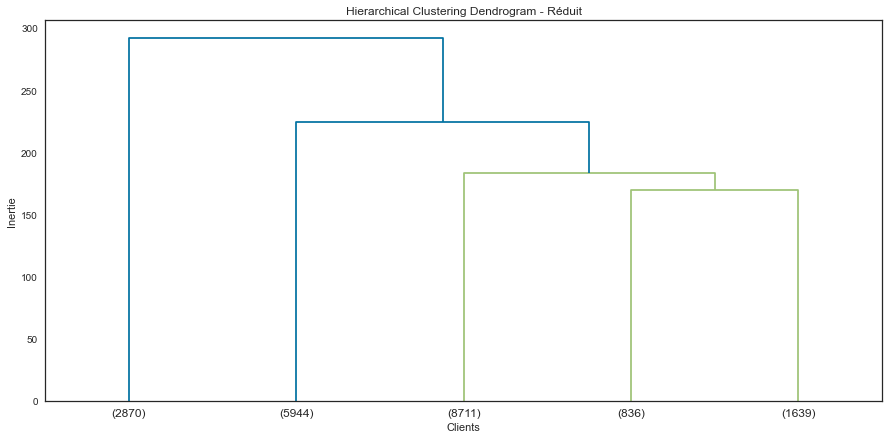

In [69]:
# Visualisation du dendrogramme
# Nombre de clusters maximal pour stop partitionnement
p = 5
# Affiche le dendogramme
outils_segmentation.plot_dendrogram(Z, p, X_link_names)

**Répartition du nombre de clients par cluster**

Clusters,Nb_clients,%
1,2870,14.35000
2,5944,29.72000
3,8711,43.56000
4,2475,12.38000


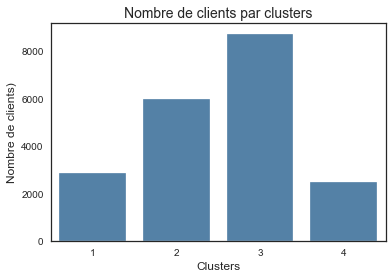

In [70]:
outils_segmentation.affiche_clients_par_clusters(dendo_labels)

**Projection en 2D**

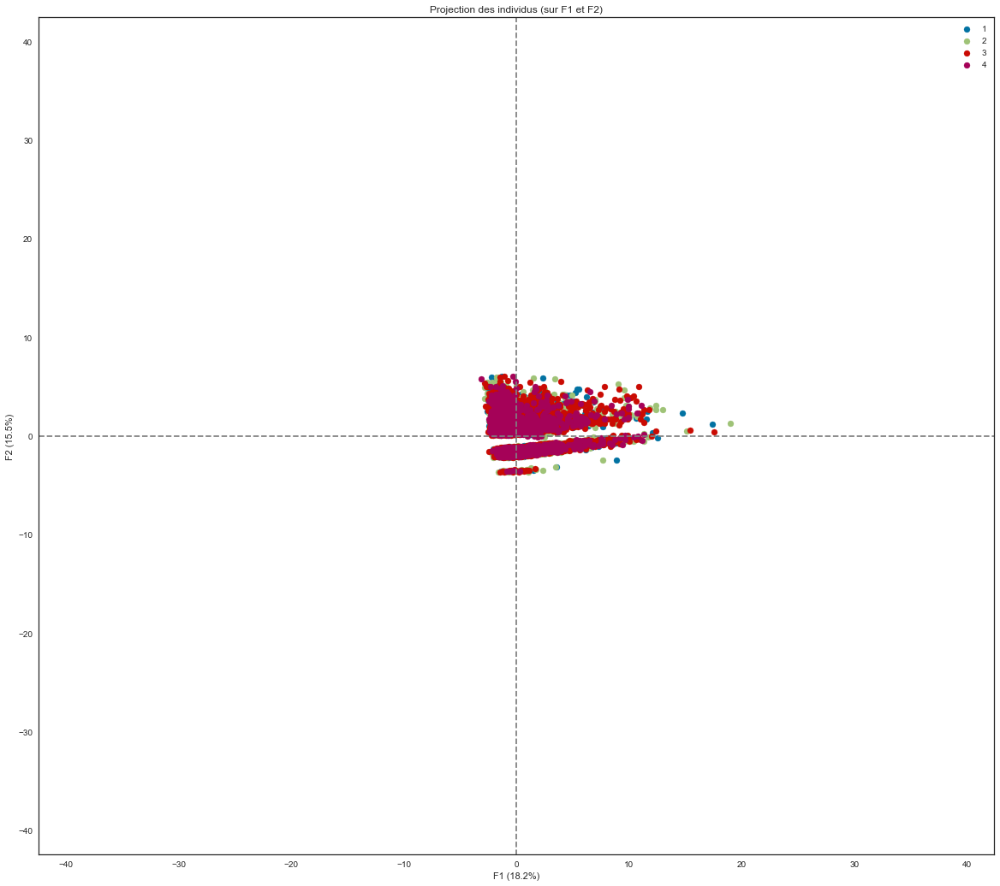

In [71]:
# Visualisation avec ACP
outils_acp.display_factorials_planes(X_projected_log_acp, n_comp_log,
                                     pca_log, [(0, 1)], alpha=1,
                                     illustrative_var=dendo_labels)

In [68]:
# Instanciation t-SNE sur dataframe réduit
tsne_red = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300,
                random_state=seed)
tsne_red_log = tsne.fit_transform(X_link_reduit)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 20000 samples in 0.405s...
[t-SNE] Computed neighbors for 20000 samples in 9.420s...
[t-SNE] Computed conditional probabilities for sample 1000 / 20000
[t-SNE] Computed conditional probabilities for sample 2000 / 20000
[t-SNE] Computed conditional probabilities for sample 3000 / 20000
[t-SNE] Computed conditional probabilities for sample 4000 / 20000
[t-SNE] Computed conditional probabilities for sample 5000 / 20000
[t-SNE] Computed conditional probabilities for sample 6000 / 20000
[t-SNE] Computed conditional probabilities for sample 7000 / 20000
[t-SNE] Computed conditional probabilities for sample 8000 / 20000
[t-SNE] Computed conditional probabilities for sample 9000 / 20000
[t-SNE] Computed conditional probabilities for sample 10000 / 20000
[t-SNE] Computed conditional probabilities for sample 11000 / 20000
[t-SNE] Computed conditional probabilities for sample 12000 / 20000
[t-SNE] Computed conditional probabilities for sa

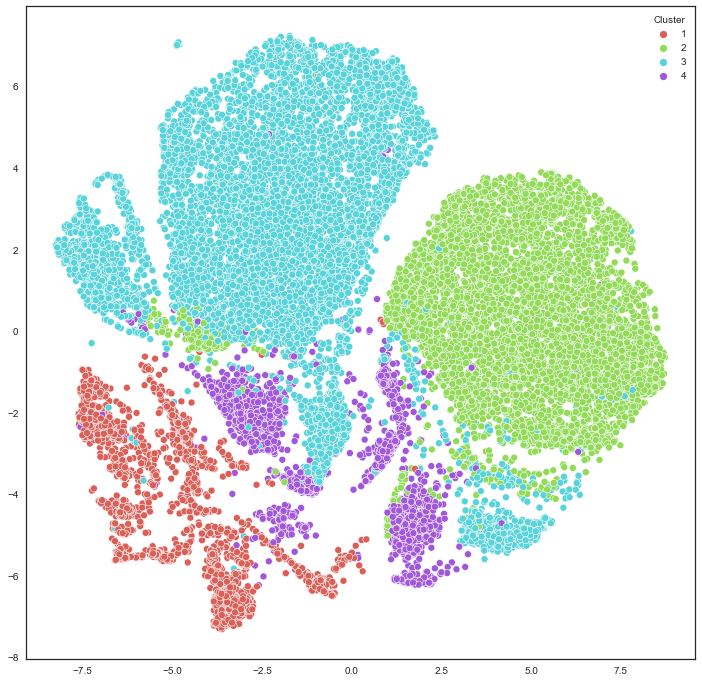

In [72]:
# Visualisation en 2D avec t-SNE
outils_segmentation.affiche_tsne_par_clusters(tsne_red_log,
                                              dendo_labels, 4)

In [76]:
# Projection UMAP en 2D
projector_umap_log_red = UMAP(random_state=seed,
                              n_neighbors=200,
                              min_dist=0.8,
                              n_components=2,
                              metric='manhattan')
X_projected_umap_log_red = \
    projector_umap_log_red.fit_transform(X_link_reduit)

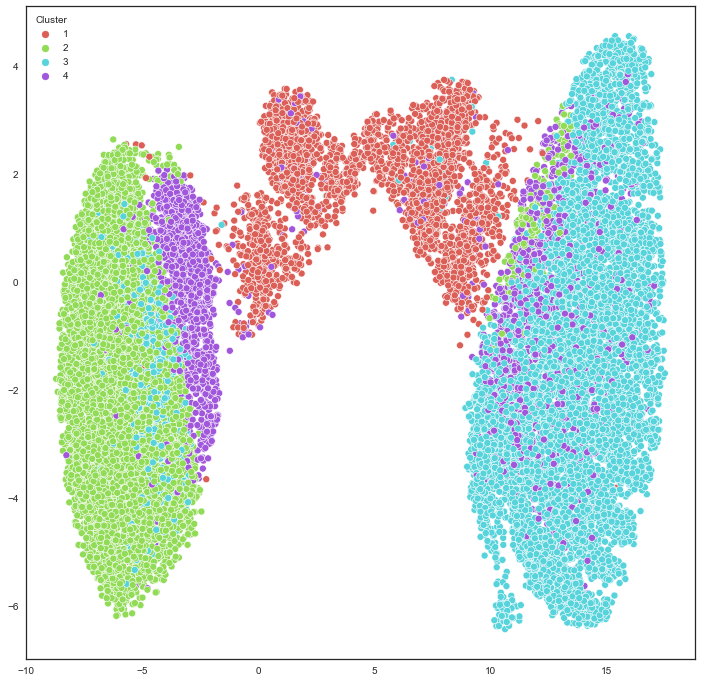

In [82]:
# Visualisation en 2D avec UMAP
outils_segmentation.affiche_umap_par_clusters(X_projected_umap_log_red,
                                              dendo_labels, 4)

**Interprétation des 4 clusters**

In [83]:
%pycodestyle_off

In [84]:
df_interpret_dendo = \
    data_dendo.groupby('Cluster').agg({'rfm_recence' : 'mean',
                                       'rfm_frequence' : 'mean',
                                       'rfm_montant' : 'mean',
                                       'note_avis_mean' : 'mean',
                                       'premier_achat_jour' : 'median',
                                       'dernier_achat_annee' : 'mean',
                                       'dernier_achat_mois' : 'median',
                                       'nbr_commandes' : 'mean',
                                       'nbr_articles_mean' : 'mean',
                                       'panier_moyen': 'mean',
                                       'echeance_paiement_mean' : 'median',
                                       'frais_port_mean' : 'mean'})
df_interpret_dendo.reset_index(inplace = True)
df_interpret_dendo.head()

,Cluster,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,premier_achat_jour,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,1,239.57805,2.60906,572.11623,3.82218,239,2017.54634,6,13.33415,1.48139,99.83939,2.0,19.39966
1,2,372.72645,1.00034,171.28156,4.56141,364,2017.02338,8,1.00101,1.00008,150.59355,2.0,20.12218
2,3,145.32924,1.00436,132.87845,3.99150,136,2017.91643,5,1.01802,1.00146,113.32048,1.0,18.53313
3,4,241.93980,1.07152,173.10526,3.96101,229,2017.53414,6,1.33576,1.01792,132.78431,2.0,27.67565


In [85]:
%pycodestyle_on

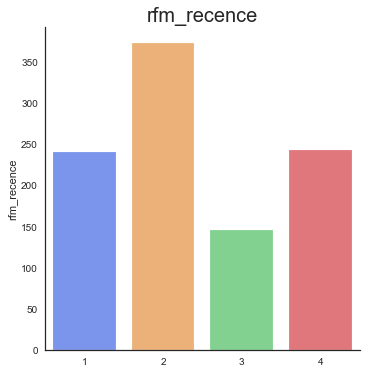

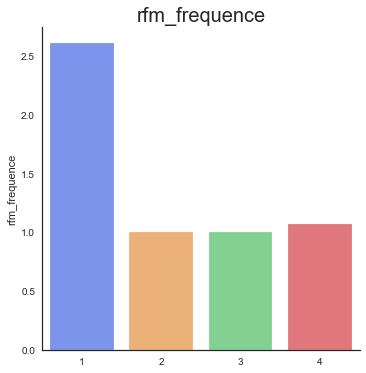

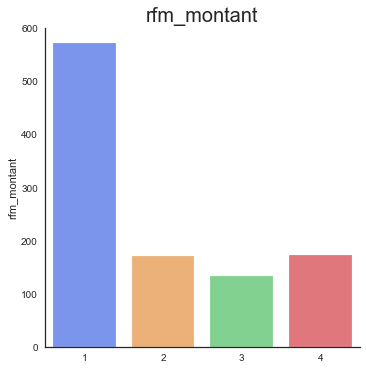

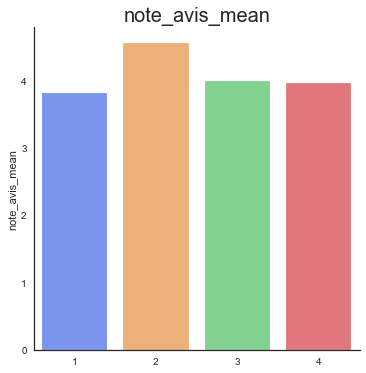

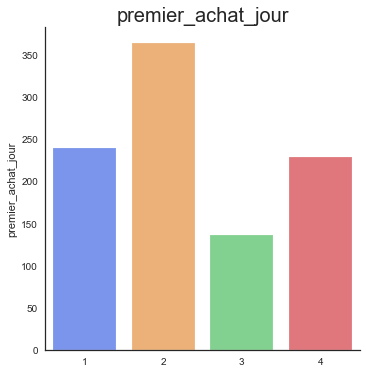

...

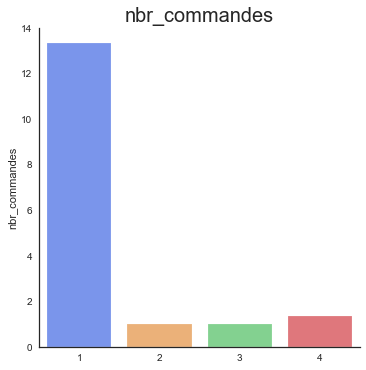

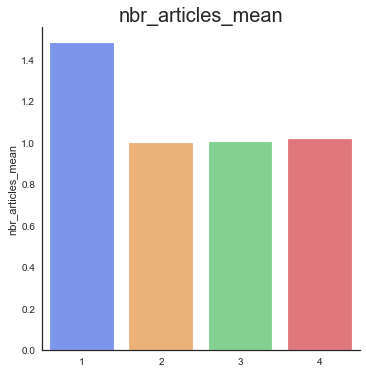

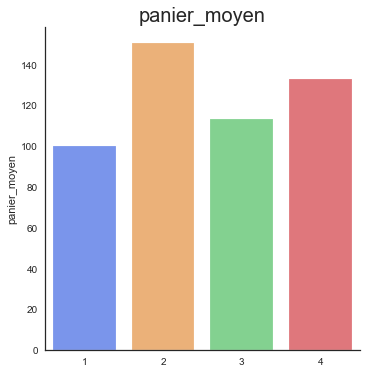

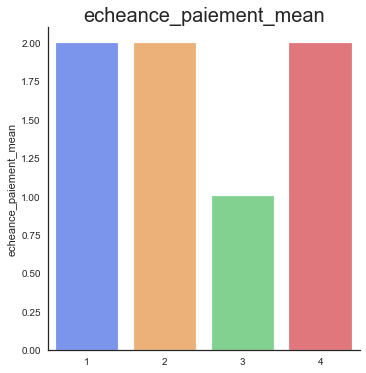

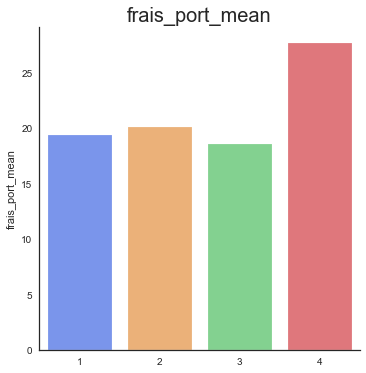

In [86]:
# Visualisation des moyennes des variables par clusters
outils_segmentation.affiche_variables_par_clusters(df_interpret_dendo,
                                                   'Cluster')

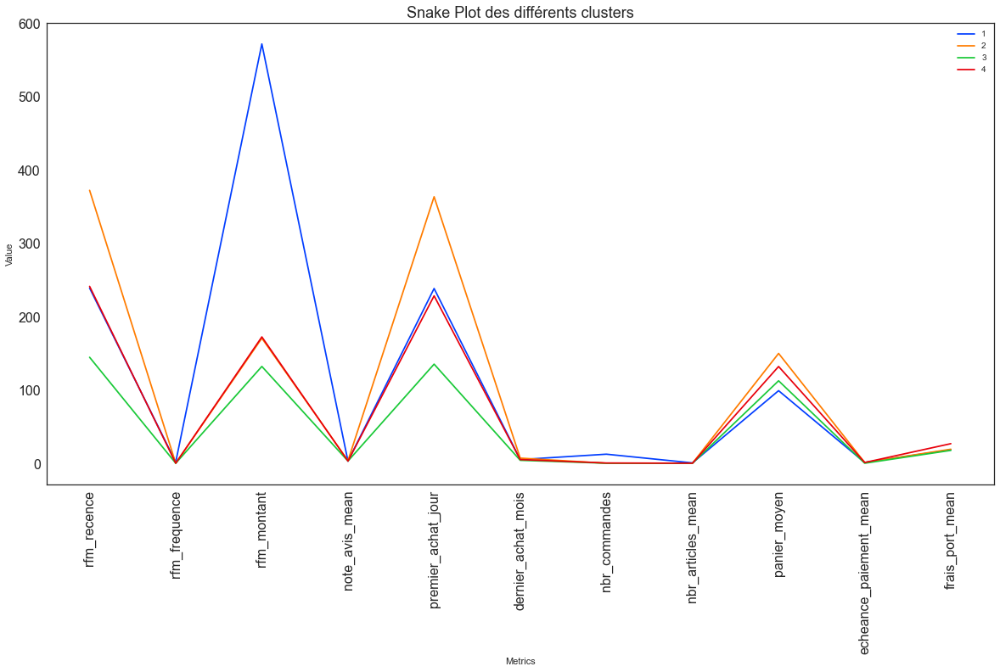

In [87]:
# Snakeplot de visualisation des différents clusters
outils_segmentation.affiche_snakeplot_par_clusters(df_interpret_dendo,
                                                   'Cluster')

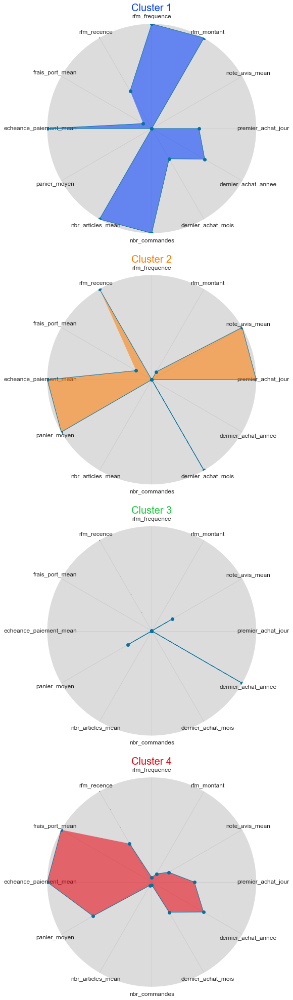

In [88]:
outils_segmentation.affiche_radarplot_par_clusters(df_interpret_dendo,
                                                   'Cluster', 4, 1)

In [89]:
df_interpret_dendo.head()

,Cluster,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,premier_achat_jour,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,1,239.57805,2.60906,572.11623,3.82218,239,2017.54634,6,13.33415,1.48139,99.83939,2.0,19.39966
1,2,372.72645,1.00034,171.28156,4.56141,364,2017.02338,8,1.00101,1.00008,150.59355,2.0,20.12218
2,3,145.32924,1.00436,132.87845,3.99150,136,2017.91643,5,1.01802,1.00146,113.32048,1.0,18.53313
3,4,241.93980,1.07152,173.10526,3.96101,229,2017.53414,6,1.33576,1.01792,132.78431,2.0,27.67565


**Bilan** :
***
- **Cluster 1** : commandes assez récentes, fréquentes et d'un montant élevé ==> **Meilleurs clients**.
- **Cluster 2** : commandes anciennes, peu fréquentes et d'un montant moyen bas, dernier achat très anciens ==> **Clients perdus**.    
- **Cluster 3** : commandes très récentes, peu fréquentes et d'un montant moyen bas ==> **Nouveaux clients**.
- **Cluster 4** : commandes assez récentes, fréquentes et d'un montant moyen ==> **Clients fidèles**.

## <span style='background:Thistle'>7. Clustering de modélisation à base de densité</span>

### <span style='background:PowderBlue; font-size:16px'>**7.1. DBSCAN - méthodes de modélisation à base de densité**</span>

***Note*** :
***    
- DBSCAN est un apprentissage non supervisé non paramétrique basé sur la densité proposé en 1996 par Martin Ester, Hans-Peter Kriegel, Jörg Sander et Xiaowei Xu.
- Moins d'hypothèses, plus de flexibilité dans le modèle construit, une application plus large. 
- Semblable à K-Means, DBSCAN regroupe les données en fonction de leurs similarités sur la base de fonctions de distance et de densité. La densité signifie ici le nombre de points dans la région définie par les paramètres du modèle. 
- L'algorithme DBSCAN utilise 2 paramètres : la distance et le nombre minimum de points MinPts devant se trouver dans un rayon epsilon, pour que ces points soient considérés comme un cluster. Les paramètres d'entrées sont donc une estimation de la densité de points des clusters. L'idée de base de l'algorithme est ensuite, pour un point donné, de récupérer son epsilon-voisinage et de vérifier qu'il contient bien MinPts points ou plus. Ce point est alors considéré comme faisant partie d'un cluster. On parcourt ensuite l'epsilon -voisinage de proche en proche afin de trouver l'ensemble des points du cluster.
- L'algorithme fonctionne en calculant la distance entre chaque point et tous les autres points. Nous plaçons ensuite les points dans l'une des trois catégories suivantes.
     - Point central : un point avec au moins min_échantillons de points dont la distance par rapport au point est inférieure au seuil défini par epsilon.
    - Point frontière : un point qui n'est pas à proximité d'au moins min_échantillons de points mais qui est suffisamment proche d'un ou plusieurs points centraux. Les points limites sont inclus dans le cluster du point central le plus proche.
    - Point de bruit : points qui ne sont pas assez proches des points centraux pour être considérés comme des points limites. Les points de bruit sont ignorés. C'est-à-dire qu'ils ne font partie d'aucun cluster.

**Hyperparamètres** :
- **eps** : définit le voisinage d'un point, x, ou le rayon d'un cercle (ou d'une hypersphère dans l'espace N-D) avec x comme centre. Deux points sont considérés comme voisins si la distance entre les deux points est inférieure au seuil epsilon.
- **minPts** : nombre minimum de points dans le voisinage pour former une région dense.
- **min_samples** : le nombre minimum de voisins qu'un point donné doit avoir pour être classé comme un point central. Il est important de noter que le point lui-même est inclus dans le nombre minimum d'échantillons.
- **metric** : la métrique à utiliser lors du calcul de la distance entre les instances d'un tableau de caractéristiques (c'est-à-dire la distance euclidienne).

In [83]:
# Arbitrage : nombre minimum de points dans le voisinage pour former une
# région dense : 2*dimension
minpts = 2*17

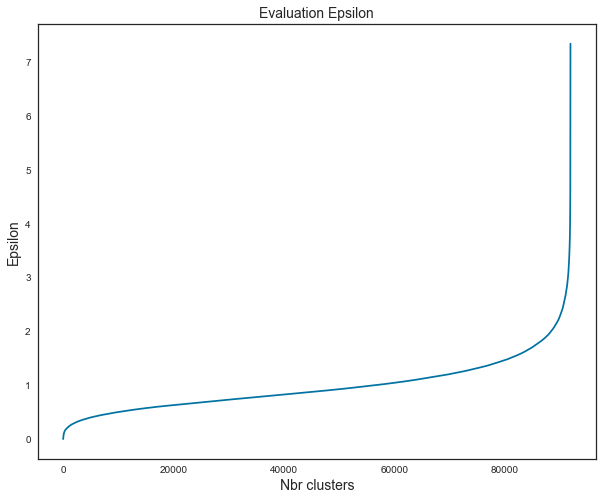

In [84]:
# Recherche du paramètre epsilon optimal
outils_segmentation.recherche_epsilon(X_scaled_log, minpts)

- Le paramètre eps optimal est obtenu où la tangente à la courbe est maximale : entre 1.5 et 2 pour la courbe ci-dessus.

**Recherche des meilleurs hyperparamètres**

In [33]:
# Dataframe de sauvegarde des résultats des métriques CAH
df_metrics_dbscan = pd.DataFrame()

In [34]:
# Tuning hyperparametres eps, min_samples
# --------------------------------------------------------------------
# Métriques pour les données quantitatives standardisées transformées
# en logarithme
eps = [1, 1.5, 2, 2.5, 4]
min_samples = [10, 20, 30, 40, 50]
n_jobs = -1
param_grid_dbscan = [eps, min_samples, n_jobs]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_dbscan = \
    outils_segmentation.calcul_metrics_dbscan(X_scaled_log,
                                              df_metrics_dbscan,
                                              'DBSCAN quant log', seed,
                                              param_grid_dbscan)
df_metrics_dbscan.style.hide_index()

Type_données,eps,min_samples,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
DBSCAN quant log,1.00000,10,-0.32413,1.58593,302.27940,30.85233
DBSCAN quant log,1.00000,20,-0.22803,1.64592,532.62291,30.80160
DBSCAN quant log,1.00000,30,-0.19506,1.88481,829.16600,34.18817
DBSCAN quant log,1.00000,40,-0.27076,1.92862,554.23153,28.21863
DBSCAN quant log,1.00000,50,-0.23261,2.10963,781.26088,29.28899
DBSCAN quant log,1.50000,10,-0.09629,1.69590,912.97167,35.59118
DBSCAN quant log,1.50000,20,-0.08249,1.85626,1367.56786,53.07216
DBSCAN quant log,1.50000,30,0.02571,2.06670,2772.81045,52.38090
DBSCAN quant log,1.50000,40,0.02924,2.41905,3599.73614,53.34395
DBSCAN quant log,1.50000,50,0.02929,2.31870,3497.80431,48.91915


In [36]:
# Coefficient de silhouette : le plus proche de 1 possible
df_metrics_dbscan.sort_values(by='coef_silh', ascending=False).head(4)

,Type_données,eps,min_samples,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
20,DBSCAN quant log,4.0,10,0.61226,1.11027,814.07323,231.84650
21,DBSCAN quant log,4.0,20,0.60081,1.14558,888.61536,220.65268
22,DBSCAN quant log,4.0,30,0.59011,1.16404,1014.16075,222.02784
23,DBSCAN quant log,4.0,40,0.58519,1.17433,1091.08457,210.36228


In [37]:
# Indice de Davies-Bouldin : le plus proche de 0.
df_metrics_dbscan.sort_values(by='davies_bouldin').head(4)

,Type_données,eps,min_samples,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
20,DBSCAN quant log,4.0,10,0.61226,1.11027,814.07323,231.84650
21,DBSCAN quant log,4.0,20,0.60081,1.14558,888.61536,220.65268
22,DBSCAN quant log,4.0,30,0.59011,1.16404,1014.16075,222.02784
24,DBSCAN quant log,4.0,50,0.58142,1.16451,1203.58383,220.06853


In [38]:
# Score de Calinski-Harabsz : le plus grand possible
df_metrics_dbscan.sort_values(by='calinski_harabasz', ascending=False).head(4)

,Type_données,eps,min_samples,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
8,DBSCAN quant log,1.5,40,0.02924,2.41905,3599.73614,53.34395
9,DBSCAN quant log,1.5,50,0.02929,2.31870,3497.80431,48.91915
14,DBSCAN quant log,2.0,50,0.02794,2.46432,3132.46376,67.18491
17,DBSCAN quant log,2.5,30,0.25704,1.70873,3021.04522,92.54356


**Bilan** :
- Silhouette : eps=4, min_samples=10.
- Davies-Bouldin : eps=4, min_samples=10.
- Calinski-Harabsz : eps=1.5, min_samples=40.

On utilisera Les hyperparamètres :
- eps : 4.
- min_samples : 10.

<span style='background:Moccasin; font-size:16px'>**DBSCAN avec les meilleurs paramètres**</span>

In [42]:
# Instanciation de dbscan avec les meilleurs paramètres
dbscan = DBSCAN(eps=4,
                min_samples=10,
                n_jobs=-1)
# Entraînement du modèle
dbscan.fit(X_scaled_log)
dbscan_labels = dbscan.labels_

**Nombre de clients par clusters**

Clusters,Nb_clients,%
-1,108,0.12000
0,91711,99.88000


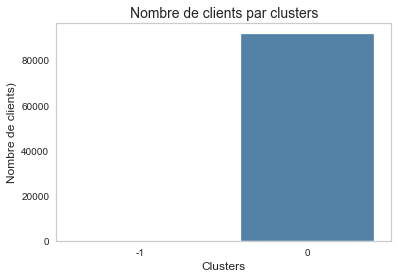

In [44]:
outils_segmentation.affiche_clients_par_clusters(dbscan_labels)

**Bilan** :
***
- DBSCAN ne parvient pas à segmenter les clients et ne trouve qu'un seul cluste et un cluster de bruit, avec les hyperparamètres par défaut. 
- Cela indique bien que le jeu de données est biaisé avec 96% de clients ayant effectué une seule commande.

In [23]:
# Instanciation de DBSCAN avec les meilleurs paramètres
dbscan = DBSCAN(eps=3,
                min_samples=10,
                n_jobs=-1)
# Entraînement du modèle
dbscan.fit(X_scaled_log)
dbscan_labels_2 = dbscan.labels_

In [25]:
# Préparation dataframe d'interprétation
# Ajout de l'assignation du cluster au dataframe
data_dbscan = data_clients.copy()
data_dbscan['Cluster_eps_3'] = dbscan.labels_

**Nombre de clients par clusters**

Clusters,Nb_clients,%
-1,6797,7.40000
0,41864,45.59000
1,33688,36.69000
2,2995,3.26000
3,3895,4.24000
4,141,0.15000
5,1487,1.62000
6,230,0.25000
7,297,0.32000
8,227,0.25000


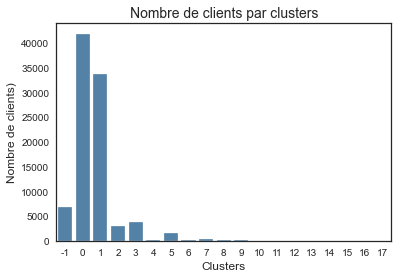

In [76]:
outils_segmentation.affiche_clients_par_clusters(dbscan_labels_2)

**Projection en 2D**

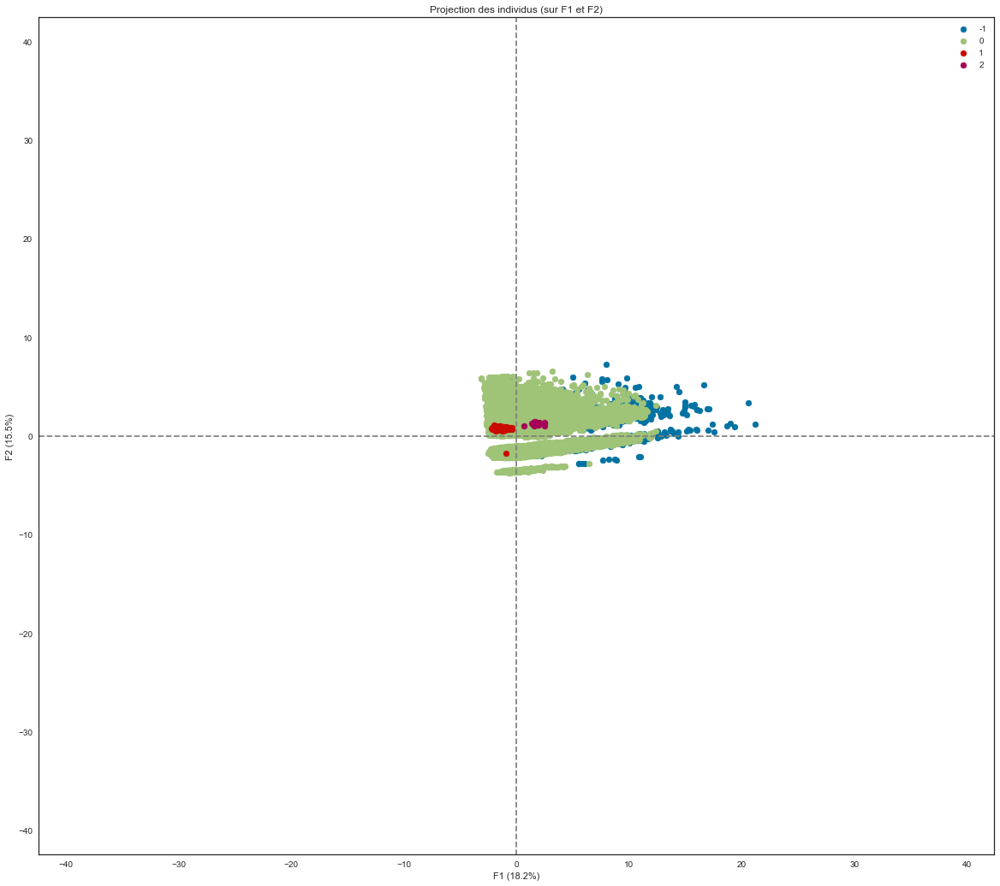

In [83]:
# Visualisation avec ACP
outils_acp.display_factorials_planes(X_projected_log_acp, n_comp_log,
                                     pca_log, [(0, 1)], alpha=1,
                                     illustrative_var=dbscan_labels_2)

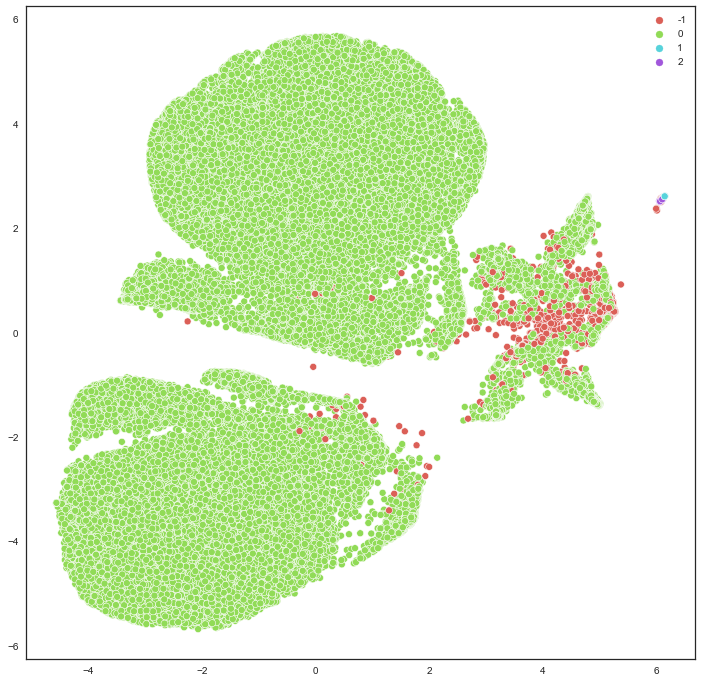

In [68]:
# Visualisation en 2D avec t-SNE
outils_segmentation.affiche_tsne_par_clusters(tsne_log, dbscan_labels_2, 4)

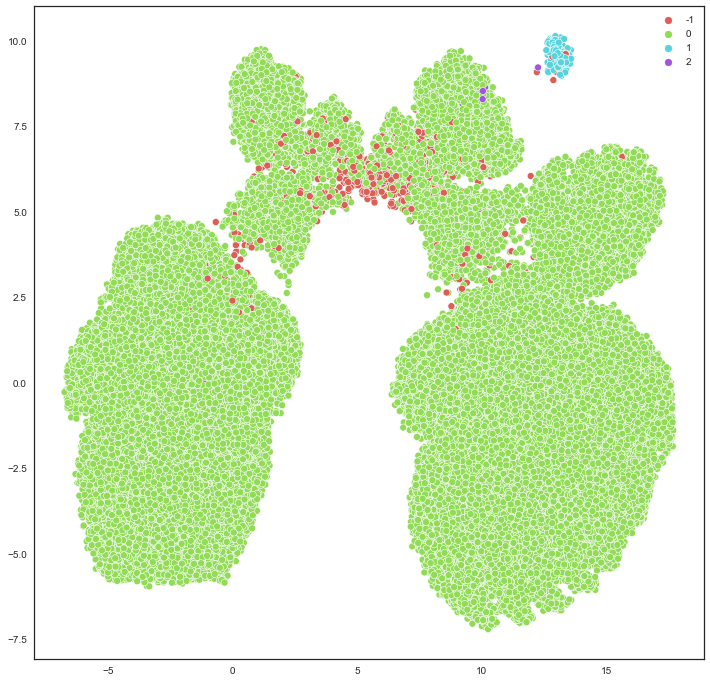

In [69]:
# Visualisation en 2D avec UMAP
outils_segmentation.affiche_umap_par_clusters(X_projected_umap_log,
                                              dbscan_labels_2, 4)

- En modifiant le paramètre eps, DBSCAN parvient à segmenter les clients en 2 groupes principaux, les autres groupes contenant moins de clients que le groupe -1 représentant le bruit.

**Interprétation des clusters**

In [27]:
%pycodestyle_off

In [28]:
df_interpret_dbscan = \
    data_dbscan.groupby('Cluster_eps_3').agg({'rfm_recence' : 'mean',
                                              'rfm_frequence' : 'mean',
                                              'rfm_montant' : 'mean',
                                              'note_avis_mean' : 'mean',
                                              'premier_achat_jour' : 'median',
                                              'dernier_achat_annee' : 'mean',
                                              'dernier_achat_mois' : 'median',
                                              'nbr_commandes' : 'mean',
                                              'nbr_articles_mean' : 'mean',
                                              'panier_moyen': 'mean',
                                              'echeance_paiement_mean' : 'median',
                                              'frais_port_mean' : 'mean'})
df_interpret_dbscan.reset_index(inplace = True)
df_interpret_dbscan.head()

,Cluster_eps_3,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,premier_achat_jour,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,-1,235.68873,4.92647,2188.05961,3.15769,228,2017.57108,6,70.89706,1.90612,258.99695,2.26667,36.25127
1,0,237.62274,1.20627,195.84894,4.14893,222,2017.54999,6,2.04256,1.06377,124.79974,2.00000,20.13536
2,1,121.20370,1.00000,100.36107,4.48519,119,2017.99630,5,1.00000,1.00000,100.36107,2.00000,0.00000
3,2,119.86957,2.04348,283.12609,3.91304,119,2018.00000,5,4.39130,1.47101,73.78261,2.00000,0.00000


In [ ]:
%pycodestyle_on

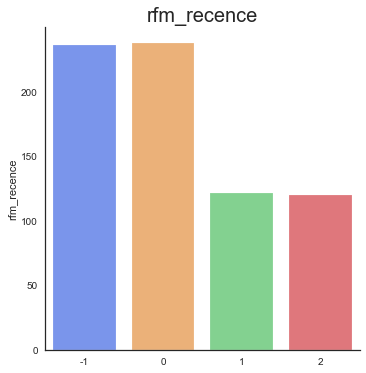

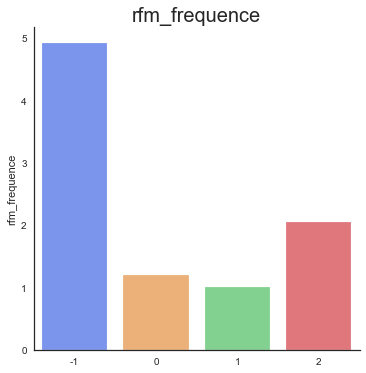

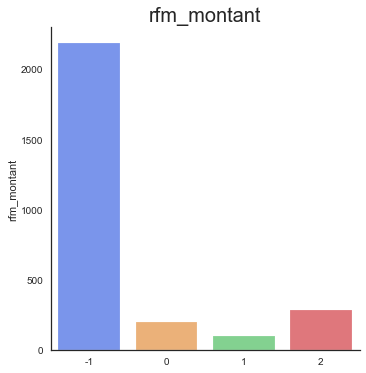

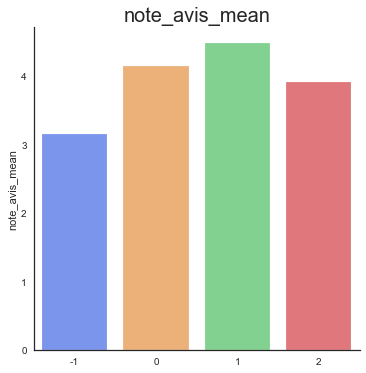

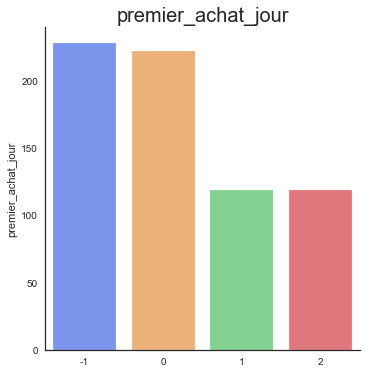

...

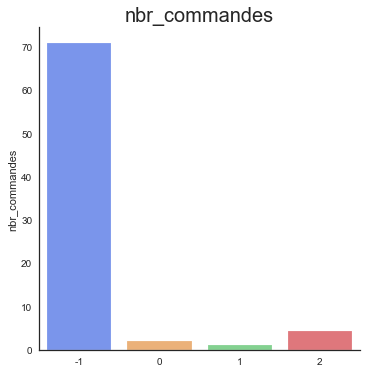

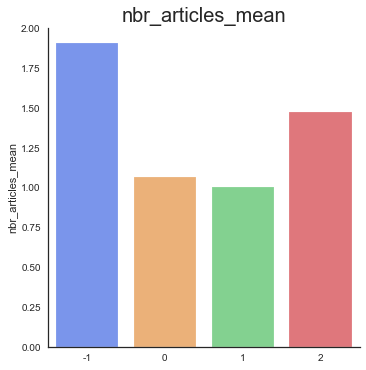

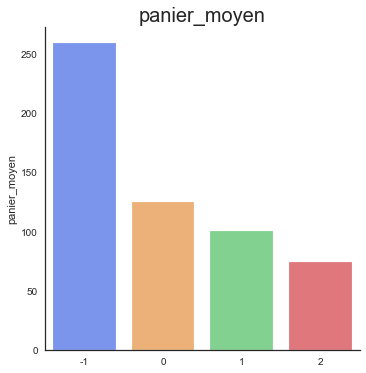

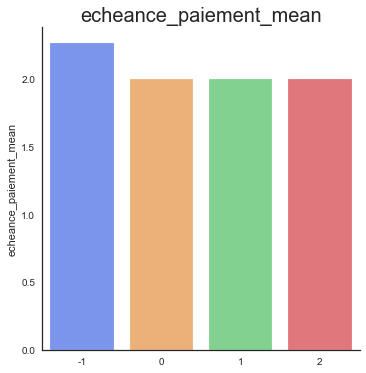

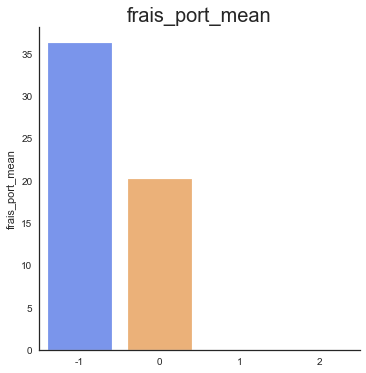

In [30]:
# Visualisation des moyennes des variables par clusters
outils_segmentation.affiche_variables_par_clusters(df_interpret_dbscan,
                                                   'Cluster_eps_3')

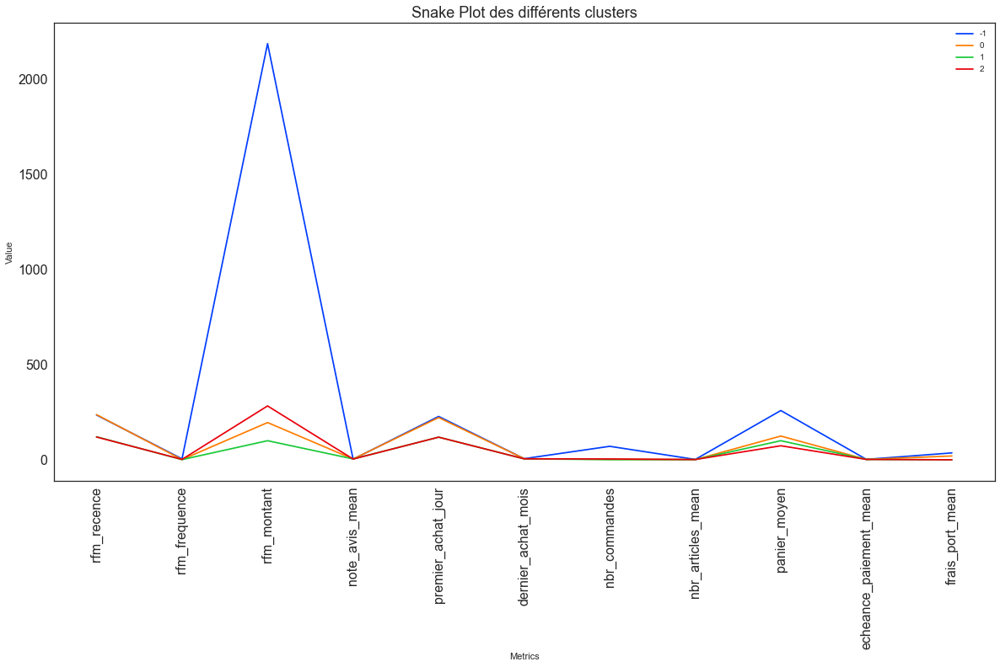

In [31]:
# Snakeplot de visualisation des différents clusters
outils_segmentation.affiche_snakeplot_par_clusters(df_interpret_dbscan,
                                                   'Cluster_eps_3')

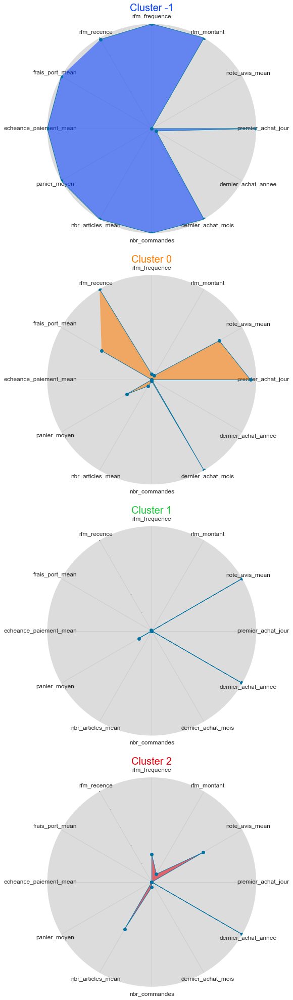

In [32]:
outils_segmentation.affiche_radarplot_par_clusters(df_interpret_dbscan,
                                                   'Cluster_eps_3', 4, 1)

In [33]:
df_interpret_dbscan.head()

,Cluster_eps_3,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,premier_achat_jour,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,-1,235.68873,4.92647,2188.05961,3.15769,228,2017.57108,6,70.89706,1.90612,258.99695,2.26667,36.25127
1,0,237.62274,1.20627,195.84894,4.14893,222,2017.54999,6,2.04256,1.06377,124.79974,2.00000,20.13536
2,1,121.20370,1.00000,100.36107,4.48519,119,2017.99630,5,1.00000,1.00000,100.36107,2.00000,0.00000
3,2,119.86957,2.04348,283.12609,3.91304,119,2018.00000,5,4.39130,1.47101,73.78261,2.00000,0.00000


**Bilan** :
- **Cluster -1** : commandes assez anciennes, très fréquentes et d'un montant élévé ==> **Meilleurs clients presque perdus ou perdus**.
- **Cluster 0** :  commandes assez anciennes, assez fréquentes et d'un montant élévé ==> **Clients presque perdus ou perdus**.
- **Cluster 1** : commandes assez récentes, peu fréquentes et d'un montant moyen ==> **Nouveaux clients**.
- **Cluster 2** : commandes assez récentes, assez fréquentes et d'un montant élévé ==> **Meilleurs clients et clients fidèles**.

### <span style='background:PowderBlue; font-size:16px'>**7.2. ACP + DBSCAN**</span>

Utilisons DBSCAN avec les 9 premières composantes de l'ACP.

In [79]:
# Instanciation de DBSCAN avec les meilleurs paramètres
dbscan_acp = DBSCAN(eps=4,
                    min_samples=10,
                    n_jobs=-1)
# Entraînement du modèle
dbscan_acp.fit(X_projected_log_acp)
dbscan_acp_labels = dbscan_acp.labels_

**Nombre de clients par clusters**

Clusters,Nb_clients,%
-1,13,0.01000
0,91806,99.99000


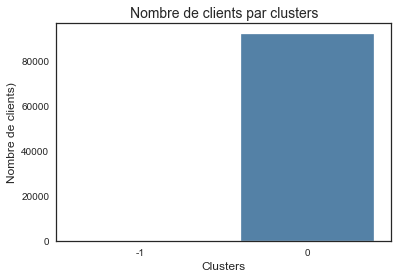

In [80]:
outils_segmentation.affiche_clients_par_clusters(dbscan_acp_labels)

- DBSCAN ne parvient pas à trouver les clusters avec les meilleurs hyperparamètres, essayons en modifiant le paramètre eps.

<span style='background:Moccasin; font-size:16px'>**ACP + DBSCAN**</span>

In [34]:
# Instanciation de DBSCAN avec les meilleurs paramètres
dbscan_acp_1 = DBSCAN(eps=1.7,
                      min_samples=10,
                      n_jobs=-1)
# Entraînement du modèle
dbscan_acp_1.fit(X_projected_log_acp)
dbscan_labels_3 = dbscan_acp_1.labels_

In [35]:
# Préparation dataframe d'interprétation
# Ajout de l'assignation du cluster au dataframe
data_dbscan_acp = data_clients.copy()
data_dbscan_acp['Cluster_acp'] = dbscan_acp_1.labels_

**Nombre de clients par clusters**

Clusters,Nb_clients,%
-1,2724,2.97000
0,49263,53.65000
1,34255,37.31000
2,5266,5.74000
3,161,0.18000
4,89,0.10000
5,27,0.03000
6,15,0.02000
7,7,0.01000
8,12,0.01000


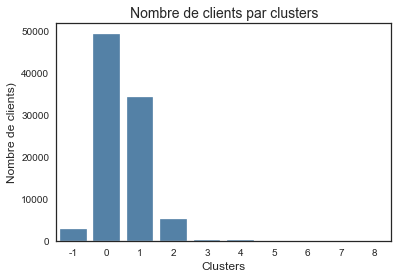

In [37]:
outils_segmentation.affiche_clients_par_clusters(dbscan_labels_3)

- DBSCAN parvient à segmenter les clients en 3 clusters principaux.

**Projection en 2D**

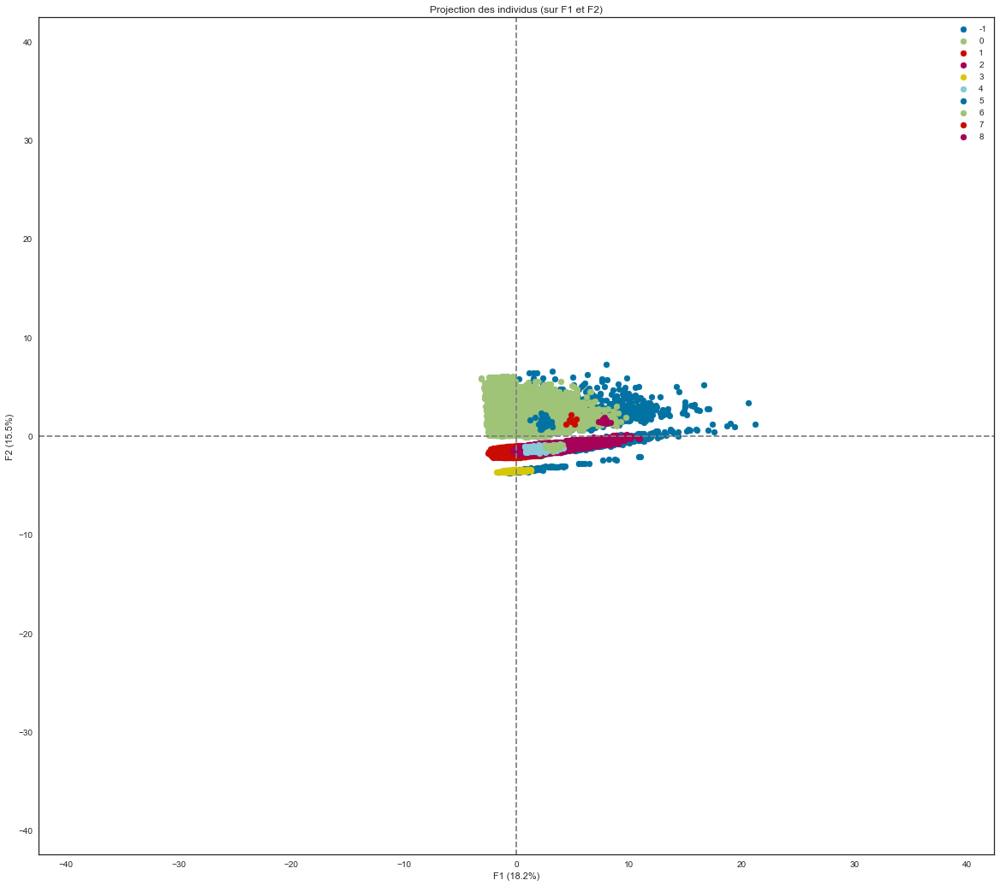

In [38]:
# Visualisation avec ACP
outils_acp.display_factorials_planes(X_projected_log_acp, n_comp_log,
                                     pca_log, [(0, 1)], alpha=1,
                                     illustrative_var=dbscan_labels_3)

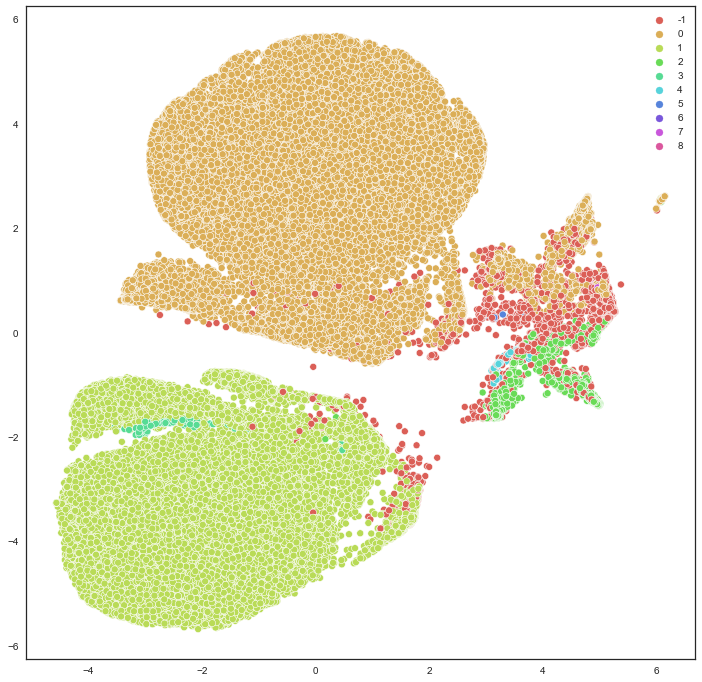

In [72]:
# Visualisation en 2D avec t-SNE
outils_segmentation.affiche_tsne_par_clusters(tsne_log, dbscan_labels_3, 10)

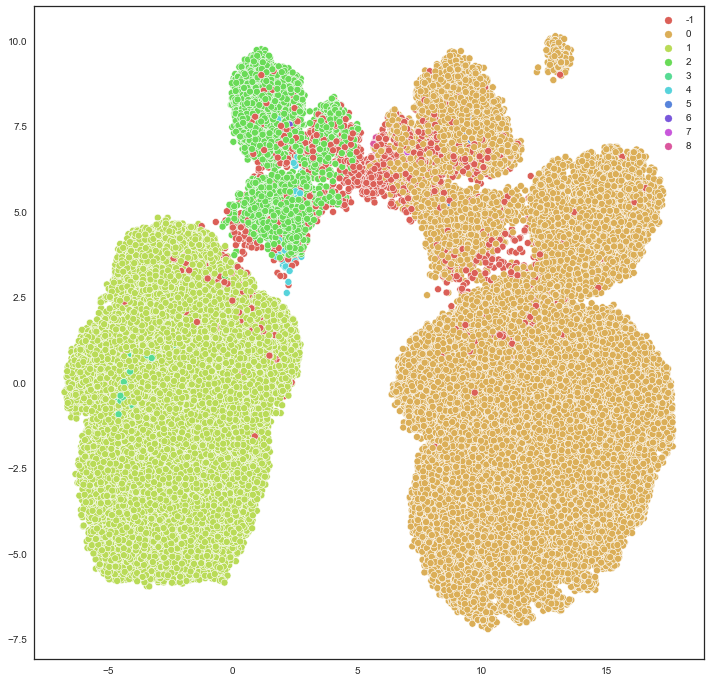

In [73]:
# Visualisation en 2D avec UMAP
outils_segmentation.affiche_umap_par_clusters(X_projected_umap_log,
                                              dbscan_labels_3, 10)

- DBSCAN parvient à segmenter les clients en 10 clusters mais seulement 4 clusters ont plus de 10%.

**Interprétation des clusters**

In [43]:
%pycodestyle_off

In [45]:
df_interpret_dbscan_acp = \
    data_dbscan_acp.groupby('Cluster_acp') \
        .agg({'rfm_recence' : 'mean',
              'rfm_frequence' : 'mean',
              'rfm_montant' : 'mean',
              'note_avis_mean' : 'mean',
              'premier_achat_jour' : 'median',
              'dernier_achat_annee' : 'mean',
              'dernier_achat_mois' : 'median',
              'nbr_commandes' : 'mean',
              'nbr_articles_mean' : 'mean',
              'panier_moyen': 'mean',
              'echeance_paiement_mean' : 'median',
              'frais_port_mean' : 'mean'})
df_interpret_dbscan_acp.reset_index(inplace = True)
df_interpret_dbscan_acp.head()

,Cluster_acp,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,premier_achat_jour,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,-1,246.06204,3.37739,1342.82505,3.10270,223.0,2017.55066,6,29.23385,1.72378,227.07291,2.75,30.88670
1,0,122.75962,1.16556,177.77662,4.16318,126.0,2018.00000,4,1.77870,1.04887,122.66424,1.00,20.36640
2,1,377.77799,1.00000,148.25075,4.22084,364.0,2017.00000,8,1.00000,1.00000,128.60544,2.00,19.59243
3,2,374.23224,2.34979,382.00889,3.95718,372.0,2017.00000,9,7.74858,1.39743,88.11094,2.00,17.53795
4,3,692.23602,1.00000,134.30236,4.10559,692.0,2016.00000,10,1.00000,1.00000,117.04957,2.00,17.11354


In [ ]:
%pycodestyle_on

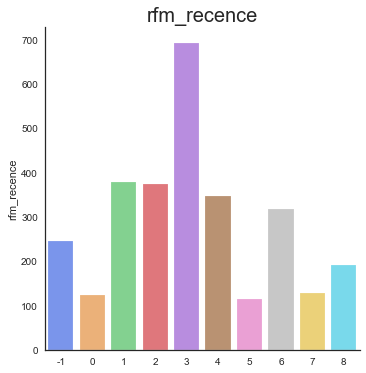

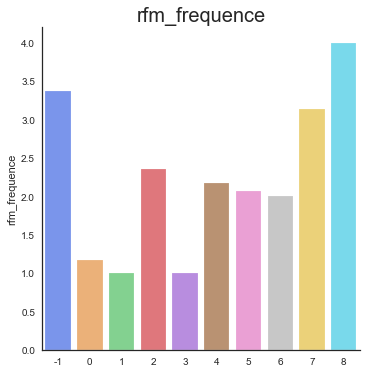

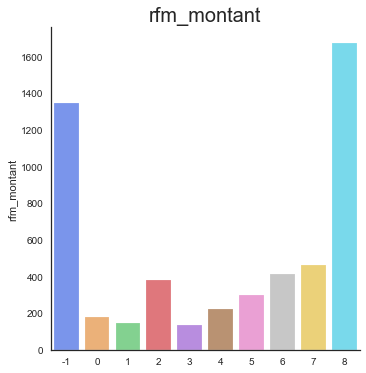

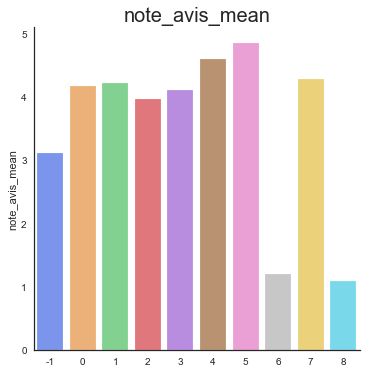

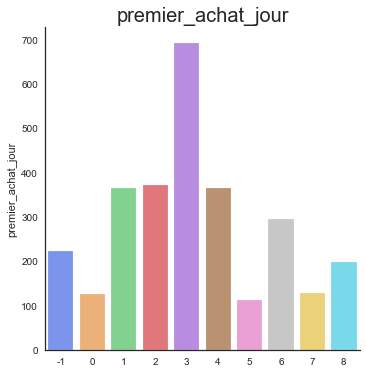

...

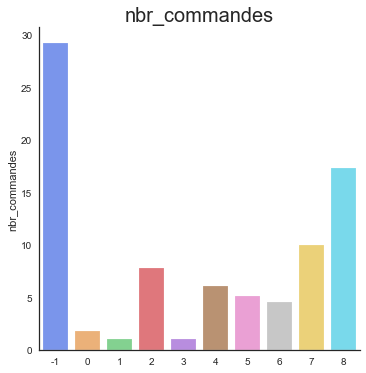

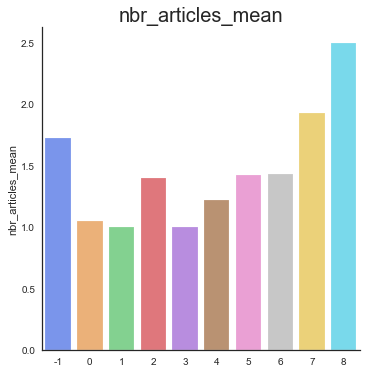

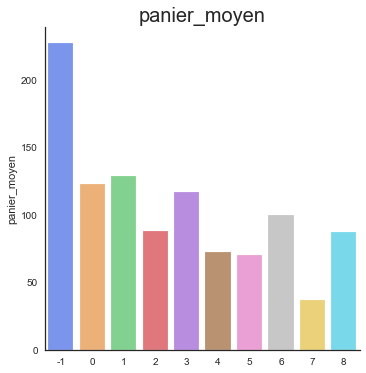

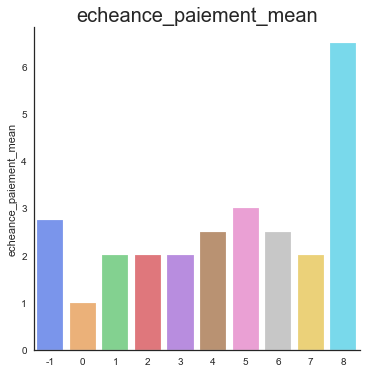

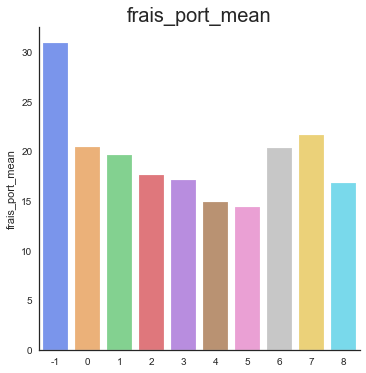

In [47]:
# Visualisation des moyennes des variables par clusters
outils_segmentation.affiche_variables_par_clusters(df_interpret_dbscan_acp,
                                                   'Cluster_acp')

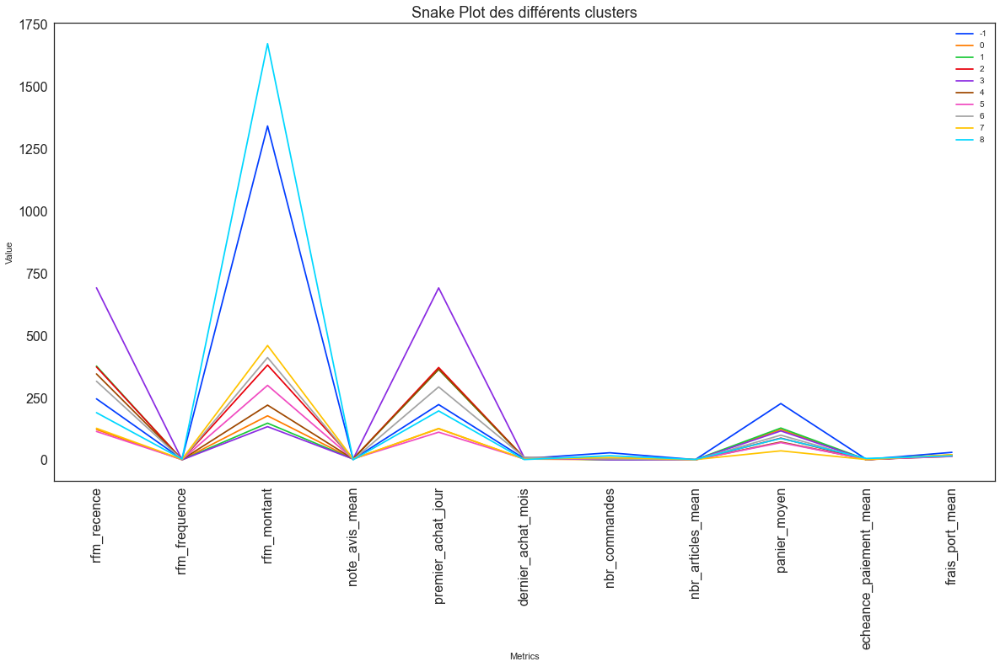

In [48]:
# Snakeplot de visualisation des différents clusters
outils_segmentation.affiche_snakeplot_par_clusters(df_interpret_dbscan_acp,
                                                   'Cluster_acp')

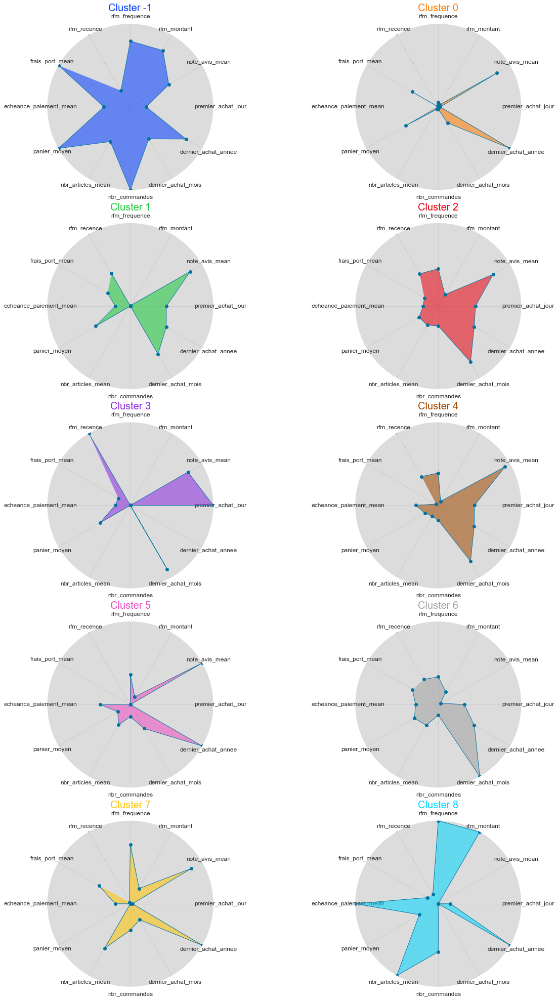

In [49]:
outils_segmentation.affiche_radarplot_par_clusters(df_interpret_dbscan_acp,
                                                   'Cluster_acp', 5, 2)

In [52]:
df_interpret_dbscan_acp.sort_values(by='rfm_recence')

,Cluster_acp,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,premier_achat_jour,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
6,5,114.92593,2.07407,300.25074,4.85185,112.0,2018.00000,5,5.14815,1.42593,70.09938,3.00,14.34173
1,0,122.75962,1.16556,177.77662,4.16318,126.0,2018.00000,4,1.77870,1.04887,122.66424,1.00,20.36640
8,7,127.71429,3.14286,460.49571,4.28571,127.0,2018.00000,4,10.00000,1.92857,37.01143,2.00,21.57381
9,8,190.41667,4.00000,1673.88667,1.08333,197.5,2018.00000,2,17.33333,2.50000,87.02271,6.50,16.81313
0,-1,246.06204,3.37739,1342.82505,3.10270,223.0,2017.55066,6,29.23385,1.72378,227.07291,2.75,30.88670
7,6,316.73333,2.00000,411.97600,1.20000,294.0,2017.00000,11,4.53333,1.43333,99.99433,2.50,20.30333
5,4,346.15730,2.16854,220.79933,4.58801,365.0,2017.00000,9,6.08989,1.22285,72.50435,2.50,14.84052
3,2,374.23224,2.34979,382.00889,3.95718,372.0,2017.00000,9,7.74858,1.39743,88.11094,2.00,17.53795
2,1,377.77799,1.00000,148.25075,4.22084,364.0,2017.00000,8,1.00000,1.00000,128.60544,2.00,19.59243
4,3,692.23602,1.00000,134.30236,4.10559,692.0,2016.00000,10,1.00000,1.00000,117.04957,2.00,17.11354


**Bilan** :
***
On retrouve une partie des groupes de clients issus de la segmentation RFM :
- **Cluster -1** : commandes assez anciennes, fréquentes et d'un montant élevé ==> **Meilleurs clients sur le point de dormir**.
- **Cluster 0** : commandes très récentes, peu fréquentes et d'un faible montant ==> **Nouveaux clients**.
- **Cluster 1** : commandes très anciennes, moyennement fréquentes et d'un montant correct, dernier achat très anciens ==> **Clients en hibernation**.
- **Cluster 2** : commandes très anciennes, très fréquentes et d'un montant élevé, dernier achat très anciens ==> **Meilleurs clients en hibernation**.
- **Cluster 3** : commandes très anciennes, peu fréquentes et d'un montant moyen, dernier achat très anciens ==> **Clients perdus**. 
- **Cluster 4** : commandes assez anciennes, peu fréquentes et d'un montant moyen, dernier achat anciens ==> **Clients sur le point de dormir**.
- **Cluster 5** : commandes assez récentes, assez fréquentes et d'un montant correct, dernier achat anciens ==> **Clients fidèles**.
- **Cluster 6** : commandes assez anciennes, assez fréquentes et d'un montant correct, dernier achat anciens ==> **Clients fidèles sur le point de dormir**.
- **Cluster 7** : commandes assez récentes, très fréquentes et d'un montant correct ==> **Meilleurs clients**.
- **Cluster 8** : commandes un peu moins récentes, très fréquentes et d'un montant élevé ==> **Meilleurs clients ayant besoin d'attention**.

### <span style='background:PowderBlue; font-size:16px'>**7.3. HDBSCAN - méthodes de modélisation à base de densité**</span>

***Note*** :
***
- HDBSCAN (Hierarchical Density-Based Spatial Clustering of Applications with Noise) est un algorithme de clustering développé par Campello, Moulavi et Sander. 
- Il étend DBSCAN en le convertissant en un algorithme de clustering hiérarchique, puis en utilisant une technique pour extraire un clustering plat basé sur la stabilité des clusters. 
- HDBSCAN utilise une approche basée sur la densité qui fait peu d'hypothèses implicites sur les clusters. Il s'agit d'une méthode non paramétrique qui recherche une hiérarchie de clusters formée par les modes multivariés de la distribution sous-jacente. Plutôt que de rechercher des clusters ayant une forme particulière, elle recherche des régions de données qui sont plus denses que l'espace environnant. L'image mentale que vous pouvez utiliser est d'essayer de séparer les îles de la mer ou les montagnes de ses vallées.

[Source](https://towardsdatascience.com/understanding-hdbscan-and-density-based-clustering-121dbee1320e)

[Source](https://towardsdatascience.com/a-gentle-introduction-to-hdbscan-and-density-based-clustering-5fd79329c1e8)

**Hyperparamètres** :
***
Alors que la classe HDBSCAN possède un grand nombre de paramètres qui peuvent être réglés lors de l'initialisation, en pratique, il y a un très petit nombre de paramètres qui ont un effet pratique significatif sur le clustering. 
- **min_cluster_size** : la principale différence entre dbscan et hdbscan est que au lieu de compter les points à l'intérieur d'un rayon fixe eps pour définir les points de noyau, de frontière et de bruit, hdbscan le fait effectivement en utilisant un rayon extensible, de sorte que le seul hyperparamètre important est le d'importance est le min_cluster_size (la taille minimale d'un cluster). L'augmentation de la taille min_cluster_size  réduit le nombre de clusters, en fusionnant certains ensemble. Ceci est le résultat de la réoptimisation de HDBSCAN*, dont le clustering plat offre une plus grande stabilité sous une notion légèrement différente de ce qui constitue un cluster. Valeurs : int(gamma * np.sqrt(n)) avec gamma in range (1, int(np.log(n))) et n= nb lignes dataframe.
- **min_samples** : Plus la valeur de min_samples est grande, plus le clustering est conservateur - plus de points seront considérés comme du bruit, et les clusters seront limités à des zones progressivement plus denses. valeurs : range(1, int(2 * np.log(n)) n= nb lignes dataframe.
- **cluster_selection_epsilon** : Dans certains cas, nous voulons choisir une petite taille de min_cluster_size car même les groupes de quelques points peuvent être intéressants pour nous. Cependant, si notre ensemble de données contient également des partitions avec de fortes concentrations d'objets, ce paramétrage peut donner lieu à un grand nombre de micro-clusters. La sélection d'une valeur pour cluster_selection_epsilon nous aide à fusionner les clusters dans ces régions. En d'autres termes, cela garantit que les clusters inférieurs au seuil donné ne sont pas divisés davantage. Le choix de cluster_selection_epsilon dépend des distances données entre vos points de données. Par exemple, définissez la valeur à 0,5 si vous ne voulez pas séparer les clusters qui sont séparés de moins de 0,5 unités.

**Recherche des meilleurs hyperparamètres**

In [23]:
# On lance HDBSCAN sur 20000 clients pour avoir une idée des paramètres
data_reduit = X_scaled_log.sample(20000, random_state=seed).copy()
X_reduit = data_reduit.values
X_names = data_reduit.index

In [33]:
# Dataframe de sauvegarde des résultats des métriques HDBSCAN
df_metrics_hdbscan = pd.DataFrame()

In [34]:
# Tuning hyperparametres min_samples, min_cluster_size
# Méthode 'eom'
# --------------------------------------------------------------------
# Métriques pour les données quantitatives standardisées transformées
# en logarithme
min_samples = [1, 2, 3, 4, 5, 10]
min_cluster_size = [300, 1000, 2000, 3000, 4000]
param_grid_hdbscan = [min_samples, min_cluster_size]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_hdbscan = \
    outils_segmentation.calcul_metrics_hdbscan(X_reduit,
                                               df_metrics_hdbscan,
                                               'HDBSCAN quant log', seed,
                                               param_grid_hdbscan, 'eom')
df_metrics_hdbscan.style.hide_index()

Type_données,min_samples,min_cluster_size,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
HDBSCAN quant log,1,300,0.122688,3.060534,1166.552848,15.056391
HDBSCAN quant log,1,1000,0.150080,3.317965,1700.405234,12.782283
HDBSCAN quant log,1,2000,0.146735,2.022656,3010.272753,12.924720
HDBSCAN quant log,1,3000,0.146735,2.022656,3010.272753,12.879638
HDBSCAN quant log,1,4000,0.146735,2.022656,3010.272753,12.805812
HDBSCAN quant log,2,300,0.145661,3.335200,1645.965860,8.373362
HDBSCAN quant log,2,1000,0.139686,2.975830,2067.614270,8.380022
HDBSCAN quant log,2,2000,0.143831,2.037444,2929.304035,8.302609
HDBSCAN quant log,2,3000,0.143831,2.037444,2929.304035,8.320438
HDBSCAN quant log,2,4000,0.143831,2.037444,2929.304035,8.329707


In [35]:
# Tuning hyperparametres min_samples, min_cluster_size
# Méthode 'eom'
# --------------------------------------------------------------------
# Métriques pour les données quantitatives standardisées transformées
# en logarithme
min_samples = [1, 2, 3, 4, 5, 10]
min_cluster_size = [300, 1000, 2000, 3000, 4000]
param_grid_hdbscan = [min_samples, min_cluster_size]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_hdbscan = \
    outils_segmentation.calcul_metrics_hdbscan(X_reduit,
                                               df_metrics_hdbscan,
                                               'HDBSCAN quant log leaf', seed,
                                               param_grid_hdbscan, 'leaf')
df_metrics_hdbscan.style.hide_index()

Type_données,min_samples,min_cluster_size,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
HDBSCAN quant log,1,300,0.122688,3.060534,1166.552848,15.056391
HDBSCAN quant log,1,1000,0.150080,3.317965,1700.405234,12.782283
HDBSCAN quant log,1,2000,0.146735,2.022656,3010.272753,12.924720
HDBSCAN quant log,1,3000,0.146735,2.022656,3010.272753,12.879638
HDBSCAN quant log,1,4000,0.146735,2.022656,3010.272753,12.805812
HDBSCAN quant log,2,300,0.145661,3.335200,1645.965860,8.373362
HDBSCAN quant log,2,1000,0.139686,2.975830,2067.614270,8.380022
HDBSCAN quant log,2,2000,0.143831,2.037444,2929.304035,8.302609
HDBSCAN quant log,2,3000,0.143831,2.037444,2929.304035,8.320438
HDBSCAN quant log,2,4000,0.143831,2.037444,2929.304035,8.329707


In [36]:
# Coefficient de silhouette : le plus proche de 1 possible
df_metrics_hdbscan.sort_values(by='coef_silh', ascending=False).head(4)

,Type_données,min_samples,min_cluster_size,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
31,HDBSCAN quant log leaf,1,1000,0.150080,3.317965,1700.405234,12.787027
1,HDBSCAN quant log,1,1000,0.150080,3.317965,1700.405234,12.782283
32,HDBSCAN quant log leaf,1,2000,0.146735,2.022656,3010.272753,12.787821
33,HDBSCAN quant log leaf,1,3000,0.146735,2.022656,3010.272753,12.806740


In [37]:
# Indice de Davies-Bouldin : le plus proche de 0.
df_metrics_hdbscan.sort_values(by='davies_bouldin').head(4)

,Type_données,min_samples,min_cluster_size,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
34,HDBSCAN quant log leaf,1,4000,0.146735,2.022656,3010.272753,12.734305
32,HDBSCAN quant log leaf,1,2000,0.146735,2.022656,3010.272753,12.787821
2,HDBSCAN quant log,1,2000,0.146735,2.022656,3010.272753,12.924720
3,HDBSCAN quant log,1,3000,0.146735,2.022656,3010.272753,12.879638


In [38]:
# Score de Calinski-Harabsz : le plus grand possible
df_metrics_hdbscan.sort_values(by='calinski_harabasz', ascending=False).head(4)

,Type_données,min_samples,min_cluster_size,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
34,HDBSCAN quant log leaf,1,4000,0.146735,2.022656,3010.272753,12.734305
2,HDBSCAN quant log,1,2000,0.146735,2.022656,3010.272753,12.924720
3,HDBSCAN quant log,1,3000,0.146735,2.022656,3010.272753,12.879638
4,HDBSCAN quant log,1,4000,0.146735,2.022656,3010.272753,12.805812


**Bilan** :
- min_cluster_size : 1000 ou 4000.
- min_samples : 1.
- method : leaf.

<span style='background:Moccasin; font-size:16px'>**HDBSCAN avec les meilleurs paramètres**</span>

In [45]:
# Instanciation de hdbscan avec les meilleurs paramètres
clus_hdbscan = hdbscan.HDBSCAN(algorithm='best', alpha=1.0,
                               approx_min_span_tree=True,
                               gen_min_span_tree=True,
                               leaf_size=40,
                               cluster_selection_method='leaf',
                               metric='euclidean',
                               min_cluster_size=4000,
                               min_samples=1,
                               allow_single_cluster=False)

# Entraînement du modèle
clus_hdbscan.fit(X_scaled_log)
hdbscan_labels = clus_hdbscan.labels_

In [47]:
# Préparation dataframe d'interprétation
# Ajout de l'assignation du cluster au dataframe
data_hdbscan = data_clients.copy()
data_hdbscan['Cluster'] = clus_hdbscan.labels_

**Nombre de clients par clusters**

Clusters,Nb_clients,%
-1,10276,11.190000
0,34573,37.650000
1,6811,7.420000
2,5686,6.190000
3,30386,33.090000
4,4087,4.450000


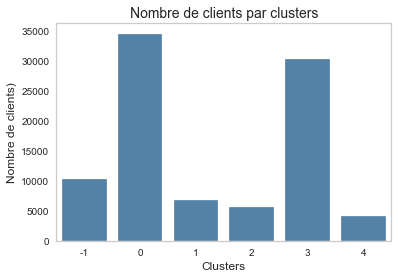

In [48]:
outils_segmentation.affiche_clients_par_clusters(hdbscan_labels)

**Bilan** :
***
- HDBSCAN permet de regrouper les clients en 5 groupes et un groupe considéré comme du bruit mais qui peut constituer un groupe de clients un peu outlier.

**Projection en 2D**

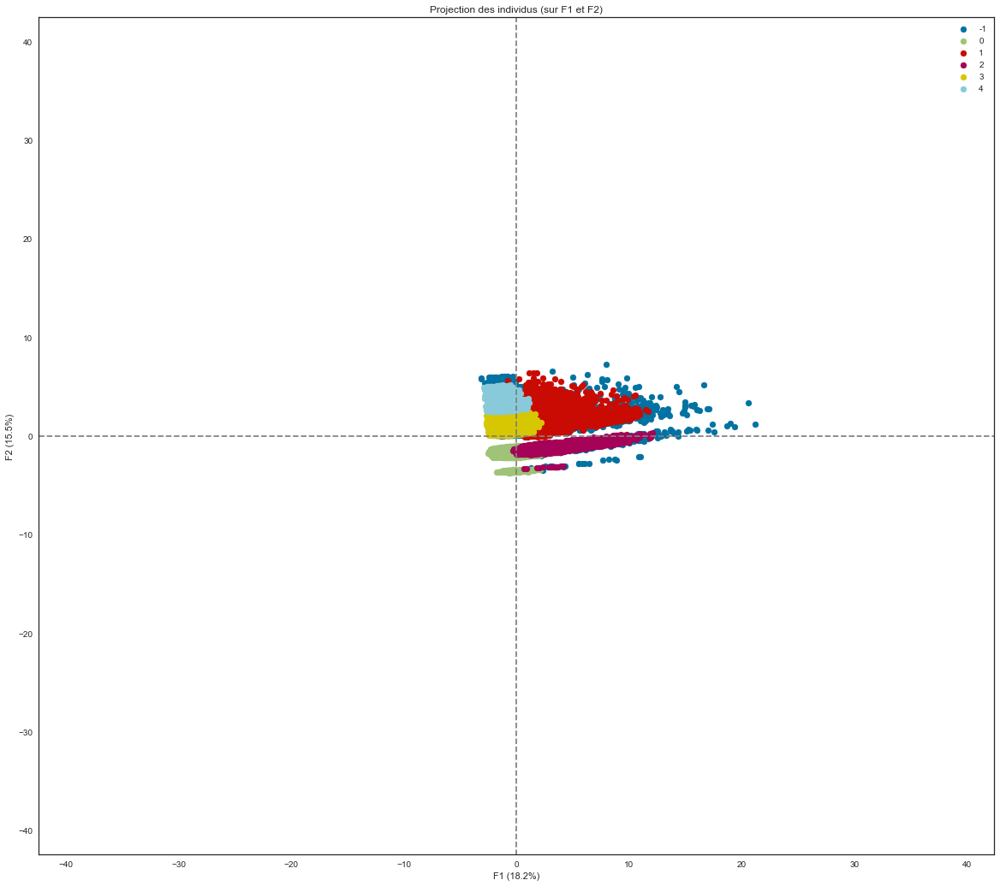

In [49]:
# Visualisation avec ACP
outils_acp.display_factorials_planes(X_projected_log_acp, n_comp_log,
                                     pca_log, [(0, 1)], alpha=1,
                                     illustrative_var=hdbscan_labels)

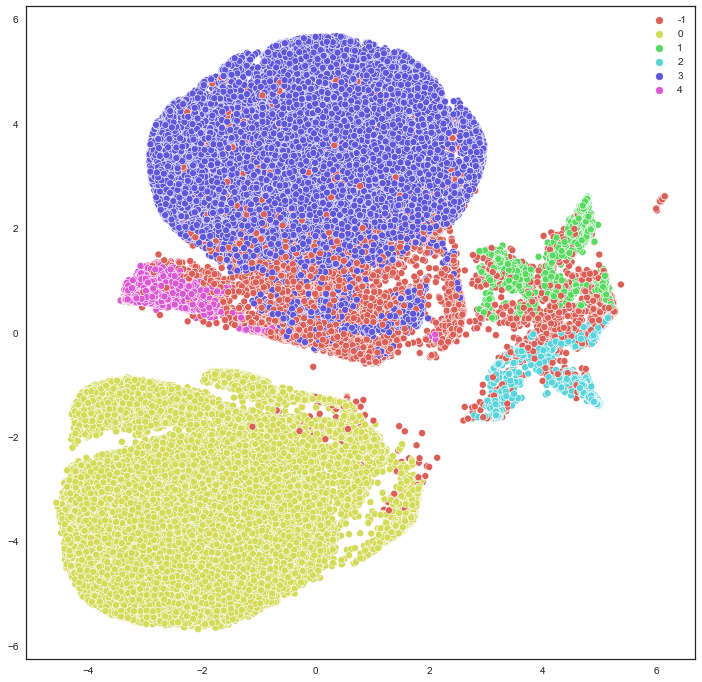

In [50]:
# Visualisation en 2D avec t-SNE
outils_segmentation.affiche_tsne_par_clusters(tsne_log, hdbscan_labels, 6)

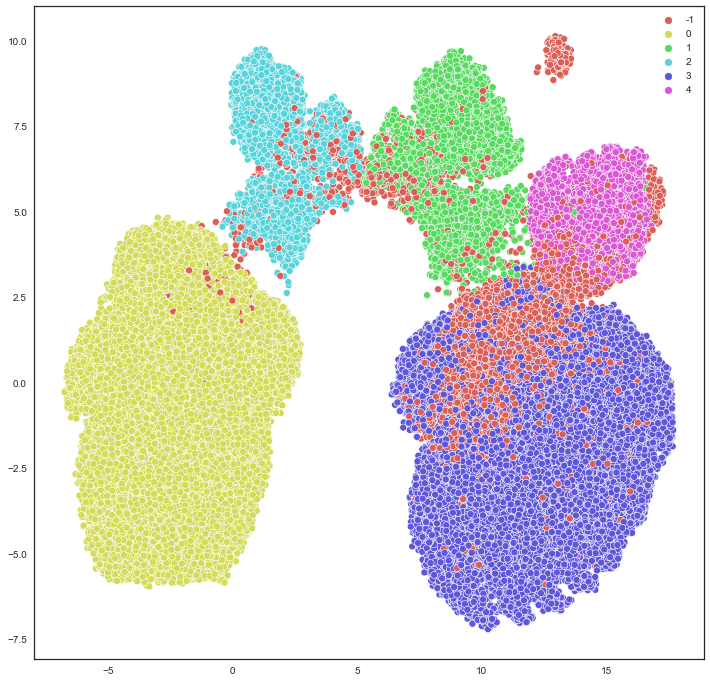

In [51]:
# Visualisation en 2D avec UMAP
outils_segmentation.affiche_umap_par_clusters(X_projected_umap_log,
                                              hdbscan_labels, 6)

**Interprétation des clusters**

In [72]:
%pycodestyle_off

In [74]:
df_interpret_hdbscan = \
    data_hdbscan.groupby('Cluster') \
        .agg({'rfm_recence' : 'mean',
              'rfm_frequence' : 'mean',
              'rfm_montant' : 'mean',
              'note_avis_mean' : 'mean',
              'premier_achat_jour' : 'median',
              'dernier_achat_annee' : 'mean',
              'dernier_achat_mois' : 'median',
              'nbr_commandes' : 'mean',
              'nbr_articles_mean' : 'mean',
              'panier_moyen': 'mean',
              'echeance_paiement_mean' : 'median',
              'frais_port_mean' : 'mean'})
df_interpret_hdbscan.reset_index(inplace = True)
df_interpret_hdbscan.head()

,Cluster,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,premier_achat_jour,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,-1,137.369307,1.461950,473.545483,3.580411,126,2017.932172,5,7.646458,1.110825,235.037451,3.0,33.958948
1,0,379.784543,1.000000,149.442992,4.213837,365,2016.994244,9,1.000000,1.000000,129.791387,2.0,19.604218
2,1,125.400235,2.357510,437.624904,3.844553,142,2018.000000,4,7.435472,1.434416,90.234624,2.0,18.281782
3,2,376.268730,2.397467,427.036219,3.921372,373,2016.997186,9,7.956384,1.428567,89.057618,2.0,17.583928
4,3,137.420062,1.000000,121.597842,4.309221,139,2018.000000,4,1.000000,1.000000,103.965326,1.0,17.605486


In [75]:
%pycodestyle_on

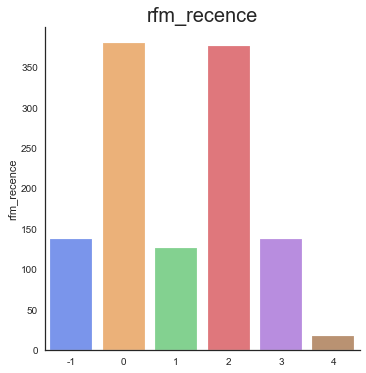

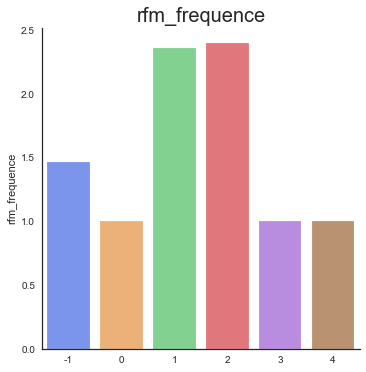

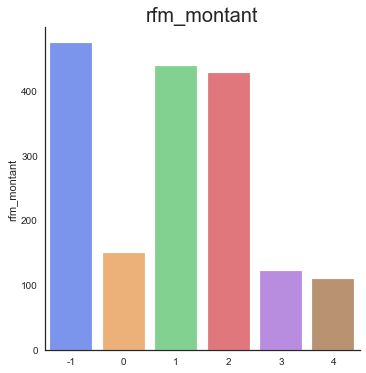

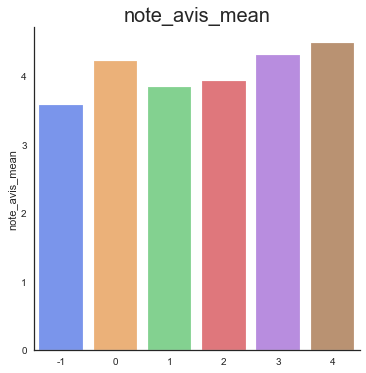

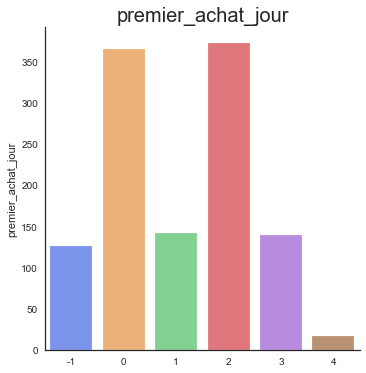

...

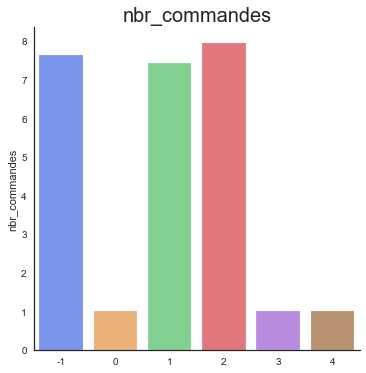

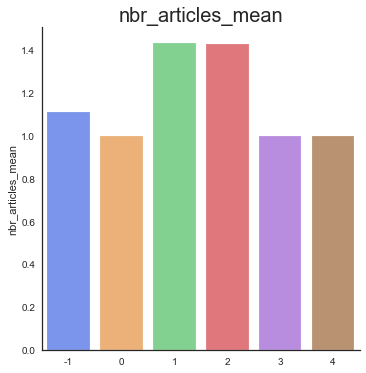

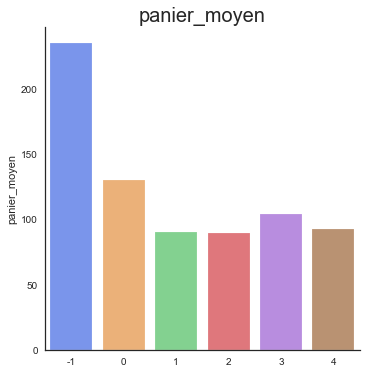

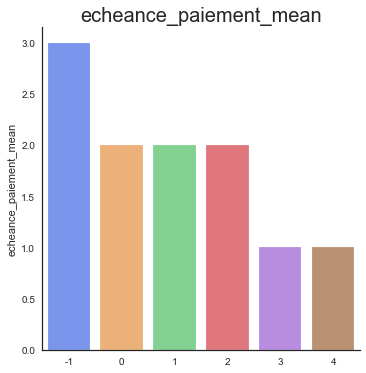

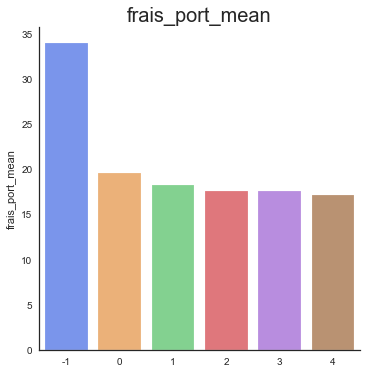

In [76]:
# Visualisation des moyennes des variables par clusters
outils_segmentation.affiche_variables_par_clusters(df_interpret_hdbscan,
                                                   'Cluster')

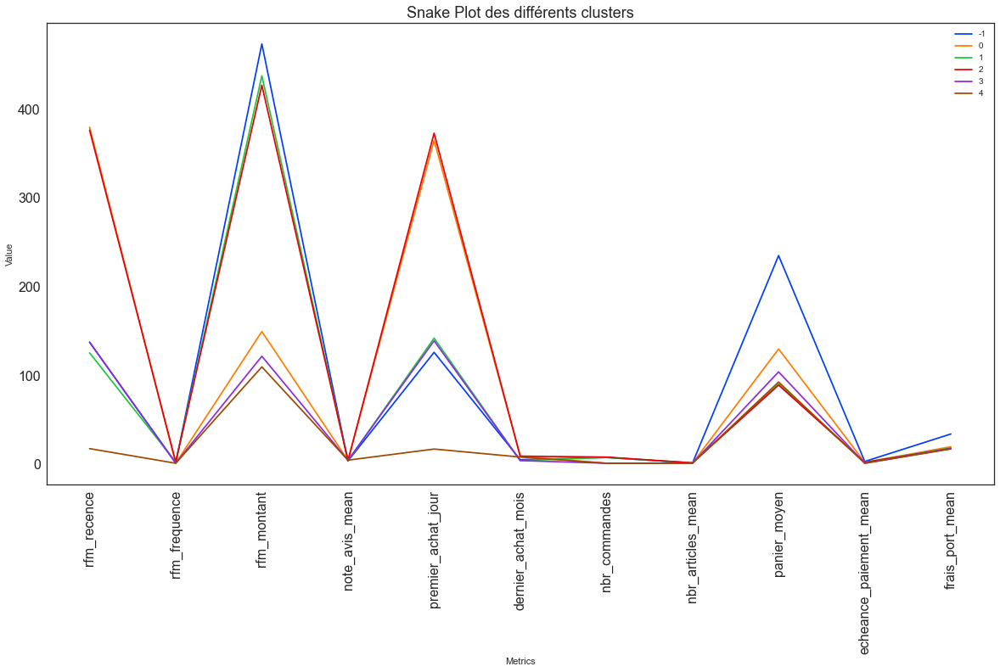

In [77]:
# Snakeplot de visualisation des différents clusters
outils_segmentation.affiche_snakeplot_par_clusters(df_interpret_hdbscan,
                                                   'Cluster')

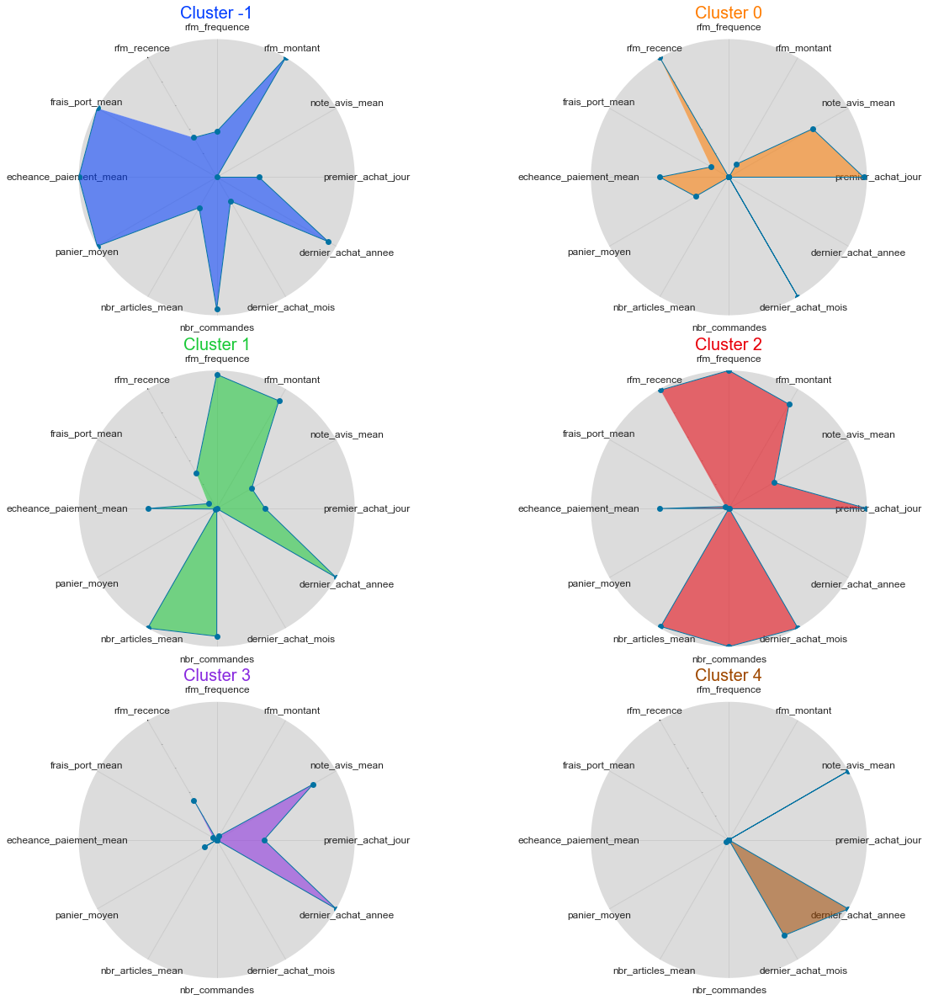

In [78]:
outils_segmentation.affiche_radarplot_par_clusters(df_interpret_hdbscan,
                                                   'Cluster', 5, 2)

In [79]:
df_interpret_hdbscan.sort_values(by='rfm_recence')

,Cluster,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,premier_achat_jour,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
5,4,17.483240,1.000000,109.619418,4.484463,17,2018.000000,8,1.000000,1.000000,92.522151,1.0,17.093492
2,1,125.400235,2.357510,437.624904,3.844553,142,2018.000000,4,7.435472,1.434416,90.234624,2.0,18.281782
0,-1,137.369307,1.461950,473.545483,3.580411,126,2017.932172,5,7.646458,1.110825,235.037451,3.0,33.958948
4,3,137.420062,1.000000,121.597842,4.309221,139,2018.000000,4,1.000000,1.000000,103.965326,1.0,17.605486
3,2,376.268730,2.397467,427.036219,3.921372,373,2016.997186,9,7.956384,1.428567,89.057618,2.0,17.583928
1,0,379.784543,1.000000,149.442992,4.213837,365,2016.994244,9,1.000000,1.000000,129.791387,2.0,19.604218


**Bilan** :
***
On retrouve une partie des groupes de clients issus de la segmentation RFM :
- **Cluster -1** : commandes moins récentes, assez fréquentes et d'un montant élevé, dernier achat anciens ==> **Meilleurs clients/Clients fidèles ayant un besoin d'attention**.
- **Cluster 0** : commandes très anciennes, peu fréquentes et d'un montant moyen, dernier achat très anciens ==> **Clients perdus**. 
- **Cluster 1** : commandes assez récentes, très fréquentes et d'un montant correct ==> **Meilleurs clients fidèles**.
- **Cluster 2** : commandes très anciennes, très fréquentes et d'un montant élevé ==> **Meilleurs clients perdus**.
- **Cluster 3** : commandes moins récentes, peu fréquentes et d'un montant moyen, dernier achat anciens ==> **Clients ayant un besoin d'attention**.
- **Cluster 4** : commandes très récentes, peu fréquentes et d'un montant moyen ==> **Nouveaux clients**.

### <span style='background:PowderBlue; font-size:16px'>**7.4. OPTICS - méthodes de modélisation à base de densité**</span>

**Note** :
***
- OPTICS (Ordering Points To Identify the Clustering Structure) est un algorithme de partitionnement de données, proposé par Mihael Ankerst, Markus M. Breunig, Hans-Peter Kriegel and Jörg Sander. 
- Il s'agit d'un algorithme basé densité dont le principe est similaire à DBSCAN mais élimine son principal défaut : l'impossibilité de détecter des partitions de densités différentes.
- Etroitement lié à DBSCAN, trouve un échantillon central de haute densité et étend les clusters à partir de celui-ci. Contrairement à DBSCAN, il conserve la hiérarchie des clusters pour un rayon de voisinage variable. Mieux adapté à l'utilisation sur de grands ensembles de données que l'implémentation actuelle de DBSCAN par Sklearn.
- Les clusters sont ensuite extraits en utilisant une méthode similaire à DBSCAN (cluster_method = 'dbscan') ou une technique automatique proposée dans (cluster_method = 'xi').

**Hyperparamètres** :
- **min_samples** : le nombre d'échantillons dans un voisinage pour qu'un point soit considéré comme un point central. De même, les régions à forte pente ascendante et descendante ne peuvent pas avoir plus de min_échantillons de points consécutifs non pentus. Exprimé comme un nombre absolu ou une fraction du nombre d'échantillons (arrondi pour être au moins 2).
- **xi** : détermine la pente minimale sur le graphe d'atteignabilité qui constitue une frontière de cluster. Par exemple, un point ascendant dans le graphe d'accessibilité est défini par le rapport d'un point à son successeur étant au plus 1-xi. Utilisé uniquement lorsque cluster_method='xi'.
- **min_cluster_size** : nombre minimum d'échantillons dans un cluster OPTICS, exprimé comme un nombre absolu ou une fraction du nombre d'échantillons (arrondi pour être au moins 2). Si None, la valeur de min_samples est utilisée à la place. Utilisé uniquement lorsque cluster_method='xi'.

**Recherche des meilleurs hyperparamètres**

In [23]:
# On lance OPTICS sur 20000 clients pour avoir une idée des paramètres
data_reduit = X_scaled_log.sample(20000, random_state=seed).copy()
X_reduit = data_reduit.values
X_names = data_reduit.index

In [24]:
# Dataframe de sauvegarde des résultats des métriques OPTICS
df_metrics_optics = pd.DataFrame()

In [25]:
# Tuning hyperparametres min_samples, xi, min_cluster_size
# --------------------------------------------------------------------
# Métriques pour les données quantitatives standardisées transformées
# en logarithme
min_samples = [1, 3, 5, 10]
xi = [0.05, 0.1, 0.2]
min_cluster_size = [0.01, 0.05]
param_grid_optics = [min_samples, xi, min_cluster_size]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_optics = \
    outils_segmentation.calcul_metrics_optics(X_reduit,
                                              df_metrics_optics,
                                              'OPTICS quant log', seed,
                                              param_grid_optics)
df_metrics_optics.style.hide_index()
# ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1
# (inclusive)

Type_données,min_samples,xi,min_cluster_size,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
OPTICS quant log,1,0.05000,0.01000,0,0,0,178.11494
OPTICS quant log,1,0.05000,0.05000,0,0,0,180.88483
OPTICS quant log,1,0.10000,0.01000,0,0,0,179.71104
OPTICS quant log,1,0.10000,0.05000,0,0,0,179.38329
OPTICS quant log,1,0.20000,0.01000,0,0,0,179.55139
OPTICS quant log,1,0.20000,0.05000,0,0,0,179.27599
OPTICS quant log,3,0.05000,0.01000,0,0,0,140.44777
OPTICS quant log,3,0.05000,0.05000,0,0,0,140.04576
OPTICS quant log,3,0.10000,0.01000,0,0,0,137.92844
OPTICS quant log,3,0.10000,0.05000,0,0,0,138.43178


**Bilan** :
- OPTICS ne parvient qu'à trouver un seul cluster et ne peut pas calculer les coefficients et les indices.

<span style='background:Moccasin; font-size:16px'>**OPTICS avec des paramètres unitaires**</span>

**Test 1**

In [22]:
# Instanciation de cah avec les meilleurs paramètres
optics = OPTICS(min_samples=1,
                xi=0.2,
                min_cluster_size=0.01,
                cluster_method='xi',
                n_jobs=-1)

# Entraînement du modèle
optics.fit(X_scaled_log)
optics_labels = optics.labels_

In [23]:
# Préparation dataframe d'interprétation
# Ajout de l'assignation du cluster au dataframe
data_optics = data_clients.copy()
data_optics['Cluster'] = optics_labels

**Nombre de clients par clusters**

Clusters,Nb_clients,%
0,91819,100.00000


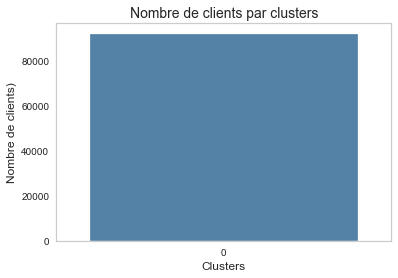

In [24]:
outils_segmentation.affiche_clients_par_clusters(optics_labels)

**Test 2**

In [28]:
# Instanciation de cah avec les meilleurs paramètres
optics_2 = OPTICS(min_samples=1,
                  xi=0.05,
                  min_cluster_size=0.01,
                  cluster_method='xi',
                  n_jobs=-1)

# Entraînement du modèle
optics_2.fit(X_scaled_log)
optics_labels_2 = optics_2.labels_

In [29]:
# Préparation dataframe d'interprétation
# Ajout de l'assignation du cluster au dataframe
data_optics['Cluster_2'] = optics_labels_2

**Nombre de clients par clusters**

Clusters,Nb_clients,%
0,91819,100.00000


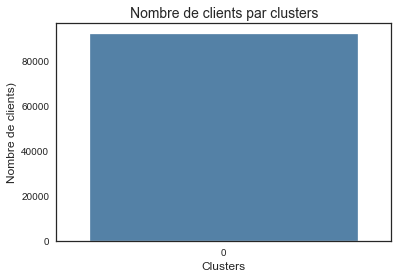

In [30]:
outils_segmentation.affiche_clients_par_clusters(optics_labels_2)

**Test 3**

In [21]:
# Instanciation de cah avec les meilleurs paramètres
optics_3 = OPTICS(min_samples=1,
                  eps=4,
                  cluster_method='dbscan',
                  n_jobs=-1)

# Entraînement du modèle
optics_3.fit(X_scaled_log)
optics_labels_3 = optics_3.labels_

In [25]:
# Préparation dataframe d'interprétation
# Ajout de l'assignation du cluster au dataframe
data_optics['Cluster_3'] = optics_labels_3

**Nombre de clients par clusters**

Clusters,Nb_clients,%
-1,91819,100.00000


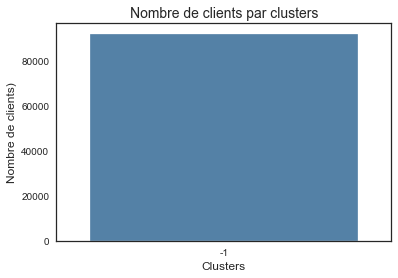

In [26]:
outils_segmentation.affiche_clients_par_clusters(optics_labels_3)

**Bilan** :
***
- OPTICS n'est pas capable pour notre jeu de données et nos paramètres de regrouper les clients par segments.

## <span style='background:Thistle'>8. Clustering de modélisation en utilisant les mélanges de gaussiennes</span>

### <span style='background:PowderBlue; font-size:16px'>**8.1. GMM - méthodes de modélisation avec mélange de gaussiennes**</span>

**Note** :
***
- GaussianMixture : un modèle de mélange gaussien est un modèle probabiliste qui suppose que tous les points de données sont générés à partir d'un mélange d'un nombre fini de distributions gaussiennes avec des paramètres inconnus. On peut considérer que les modèles de mélange généralisent le regroupement par k-means pour intégrer des informations sur la structure de covariance des données ainsi que sur les centres des gaussiennes latentes.
- L'objet GaussianMixture met en œuvre l'algorithme d'espérance-maximisation (EM) pour l'ajustement des modèles de mélange de gaussiens. Il peut également dessiner des ellipsoïdes de confiance pour les modèles multivariés et calculer le critère d'information bayésien pour évaluer le nombre de groupes dans les données. Une méthode GaussianMixture.fit est fournie pour apprendre un modèle de mélange gaussien à partir des données d'entraînement. Étant donné les données de test, il peut attribuer à chaque échantillon le modèle de mélange gaussien auquel il appartient le plus probablement en utilisant la méthode GaussianMixture.predict.
- Le GaussianMixture est fourni avec différentes options pour contraindre la covariance des classes de différence estimées : sphérique, diagonale, liée ou covariance complète.

[Source](https://scikit-learn.org/stable/modules/mixture.html#:~:text=A%20Gaussian%20mixture%20model%20is,Gaussian%20distributions%20with%20unknown%20parameters.)

**Hyperparamètres** :
- **n_composants** : par défaut=1, le nombre de composants du mélange.
- **covariance_type** : {'full', 'tied', 'diag', 'spherical'}, default='full'. Chaîne décrivant le type de paramètres de covariance à utiliser. Doit être l'un de :
    - full : (complet) chaque composant a sa propre matrice de covariance générale.
    - tied : tous les composants partagent la même matrice de covariance générale.
    - diag : chaque composant a sa propre matrice de covariance diagonale.
    - spherical : chaque composante a sa propre variance unique.

**Recherche des meilleurs hyperparamètres**

In [33]:
# Dataframe de sauvegarde des résultats des métriques GaussianMixture
df_metrics_gmm = pd.DataFrame()

In [35]:
# Tuning hyperparametres min_samples, xi, min_cluster_size
# --------------------------------------------------------------------
# Métriques pour les données quantitatives standardisées transformées
# en logarithme
n_components = range(2,20)
covariance_type = ['full', 'spherical']
param_grid_gmm = [n_components, covariance_type]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_gmm = \
    outils_segmentation.calcul_metrics_gmm(X_scaled_log,
                                           df_metrics_gmm,
                                           'GMM quant log', seed,
                                           param_grid_gmm)
df_metrics_gmm.style.hide_index()

Type_données,n_components,covariance_type,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
GMM quant log,2,full,0.24533,1.89461,13796.13696,0.37790
GMM quant log,2,spherical,0.04184,2.52645,7503.03041,0.40068
GMM quant log,3,full,0.15176,1.99236,14603.32984,0.62782
GMM quant log,3,spherical,0.08945,2.68691,9305.38202,0.52224
GMM quant log,4,full,0.14947,3.16856,9984.99531,1.54531
GMM quant log,4,spherical,0.07240,2.44266,8141.14906,0.53226
GMM quant log,5,full,0.14703,3.48283,8028.97889,2.99103
GMM quant log,5,spherical,0.10874,2.38912,9297.54940,0.50579
GMM quant log,6,full,0.12678,3.15181,6481.40443,5.14770
GMM quant log,6,spherical,0.09343,2.23489,9044.44086,0.55249


5:23: E231 missing whitespace after ','


In [36]:
# Coefficient de silhouette : le plus proche de 1 possible
df_metrics_gmm.sort_values(by='coef_silh', ascending=False).head(4)

,Type_données,n_components,covariance_type,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
0,GMM quant log,2,full,0.24533,1.89461,13796.13696,0.37790
2,GMM quant log,3,full,0.15176,1.99236,14603.32984,0.62782
4,GMM quant log,4,full,0.14947,3.16856,9984.99531,1.54531
6,GMM quant log,5,full,0.14703,3.48283,8028.97889,2.99103


In [37]:
# Indice de Davies-Bouldin : le plus proche de 0.
df_metrics_gmm.sort_values(by='davies_bouldin').head(4)

,Type_données,n_components,covariance_type,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
0,GMM quant log,2,full,0.24533,1.89461,13796.13696,0.37790
35,GMM quant log,19,spherical,0.07999,1.93050,5653.08751,2.06915
17,GMM quant log,10,spherical,0.10203,1.93639,8187.44888,0.64201
27,GMM quant log,15,spherical,0.05984,1.97428,5463.79437,1.58495


In [38]:
# Score de Calinski-Harabsz : le plus grand possible
df_metrics_gmm.sort_values(by='calinski_harabasz', ascending=False).head(4)

,Type_données,n_components,covariance_type,coef_silh,davies_bouldin,calinski_harabasz,Durée (s)
2,GMM quant log,3,full,0.15176,1.99236,14603.32984,0.62782
0,GMM quant log,2,full,0.24533,1.89461,13796.13696,0.37790
4,GMM quant log,4,full,0.14947,3.16856,9984.99531,1.54531
3,GMM quant log,3,spherical,0.08945,2.68691,9305.38202,0.52224


**Bilan** :
- Silhouette : n_components=2, covariance_type=full.
- Davies-Bouldin : n_components=2, covariance_type=full.
- Calinski-Harabsz : n_components=3, covariance_type=full.

On utilisera Les hyperparamètres :
- n_components : 2 ou 3.
- covariance_type : full.

<span style='background:Moccasin; font-size:16px'>**GausianMixture avec les meilleurs paramètres**</span>

**2 composants**

In [39]:
# Instanciation de cah avec les meilleurs paramètres
gmm = mixture.GaussianMixture(n_components=2,
                              covariance_type='full')

# Entraînement du modèle
gmm_labels = gmm.fit_predict(X_scaled_log)

In [40]:
# Préparation dataframe d'interprétation
# Ajout de l'assignation du cluster au dataframe
data_gmm = data_clients.copy()
data_gmm['Cluster'] = gmm_labels

**Nombre de clients par clusters**

Clusters,Nb_clients,%
0,13933,15.17000
1,77886,84.83000


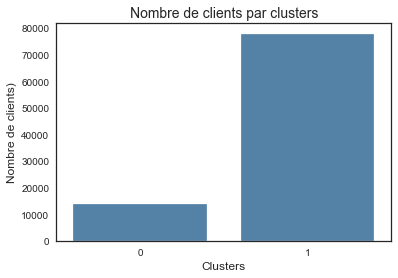

In [41]:
outils_segmentation.affiche_clients_par_clusters(gmm_labels)

**Bilan** :
***
- GaussianMixture découpe en 2 segments très déséquilibrés.

**Projection en 2D**

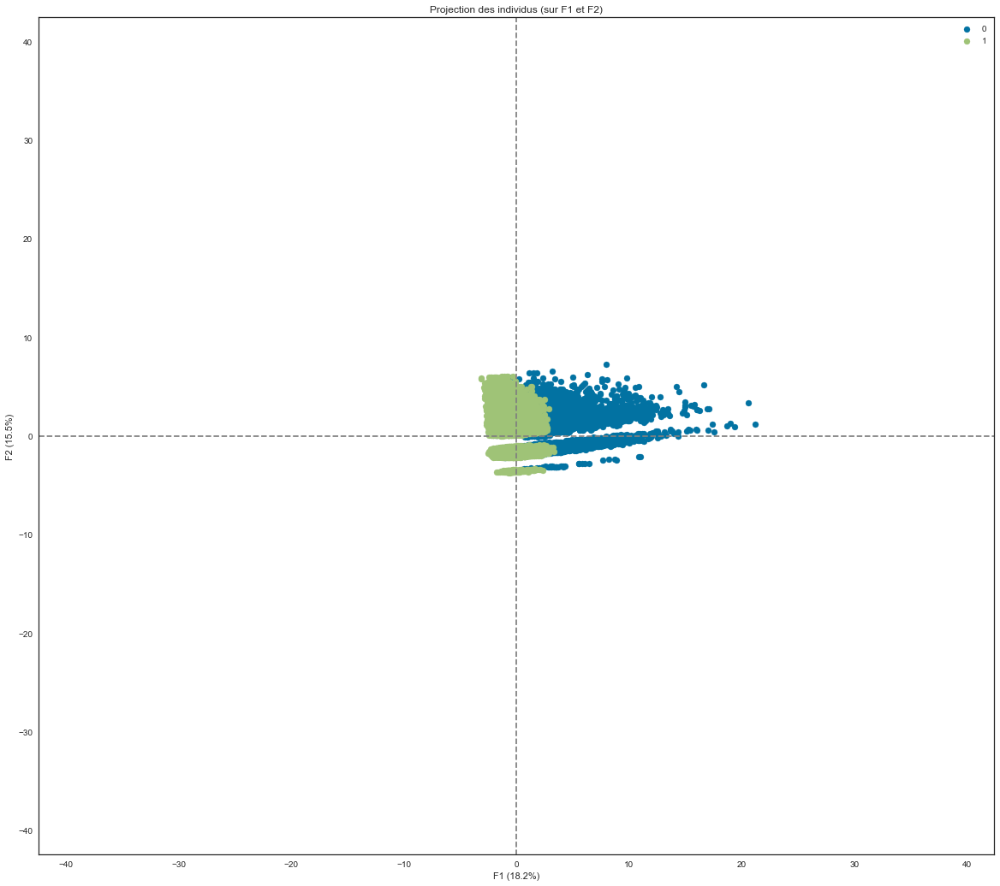

In [42]:
# Visualisation avec ACP
outils_acp.display_factorials_planes(X_projected_log_acp, n_comp_log,
                                     pca_log, [(0, 1)], alpha=1,
                                     illustrative_var=gmm_labels)

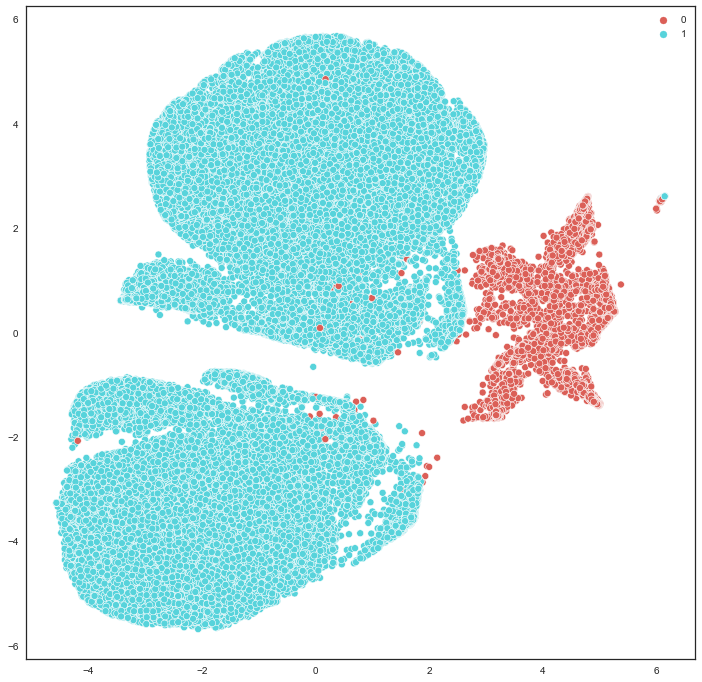

In [46]:
# Visualisation en 2D avec t-SNE
outils_segmentation.affiche_tsne_par_clusters(tsne_log, gmm_labels, 2)

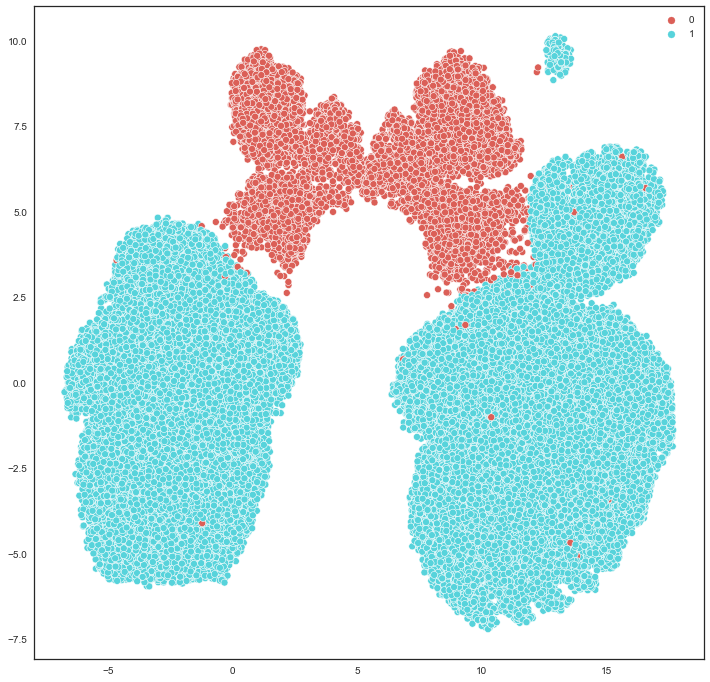

In [47]:
# Visualisation en 2D avec UMAP
outils_segmentation.affiche_umap_par_clusters(X_projected_umap_log,
                                              gmm_labels, 2)

**Interprétation des clusters**

In [48]:
%pycodestyle_off

In [49]:
df_interpret_gmm = \
    data_gmm.groupby('Cluster') \
        .agg({'rfm_recence' : 'mean',
              'rfm_frequence' : 'mean',
              'rfm_montant' : 'mean',
              'note_avis_mean' : 'mean',
              'premier_achat_jour' : 'median',
              'dernier_achat_annee' : 'mean',
              'dernier_achat_mois' : 'median',
              'nbr_commandes' : 'mean',
              'nbr_articles_mean' : 'mean',
              'panier_moyen': 'mean',
              'echeance_paiement_mean' : 'median',
              'frais_port_mean' : 'mean'})
df_interpret_gmm.reset_index(inplace = True)
df_interpret_gmm.head()

,Cluster,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,premier_achat_jour,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,0,238.85186,2.57461,559.8230,3.81271,238,2017.54812,6,11.88674,1.46899,98.12031,2.0,19.20725
1,1,236.94425,1.00000,151.3046,4.19979,218,2017.55223,6,1.00000,1.00000,130.87860,2.0,20.39449


In [50]:
%pycodestyle_on

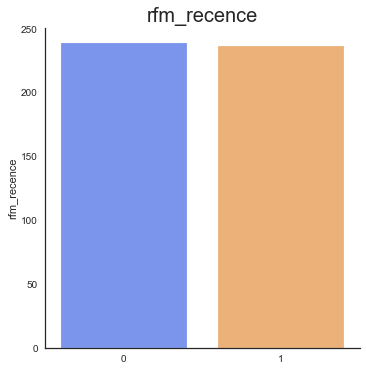

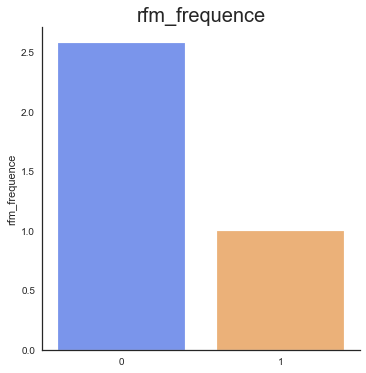

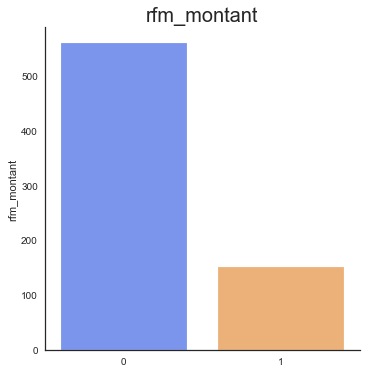

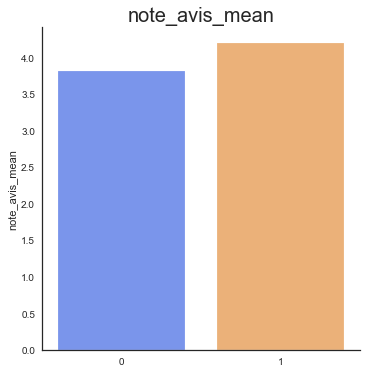

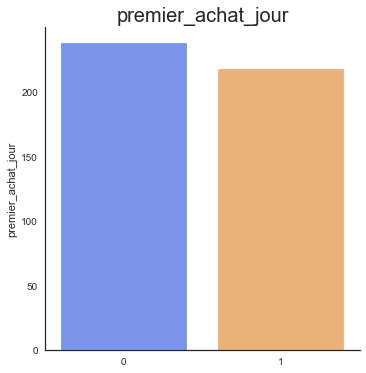

...

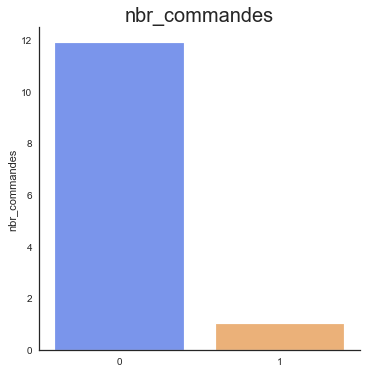

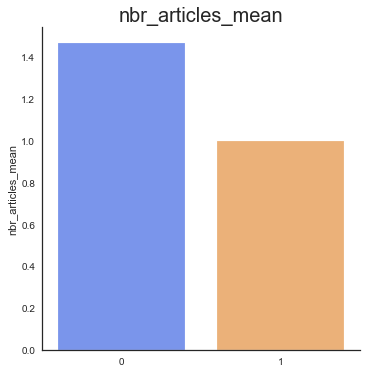

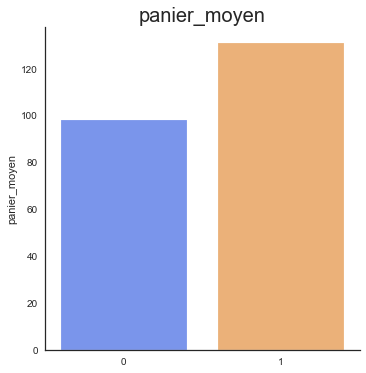

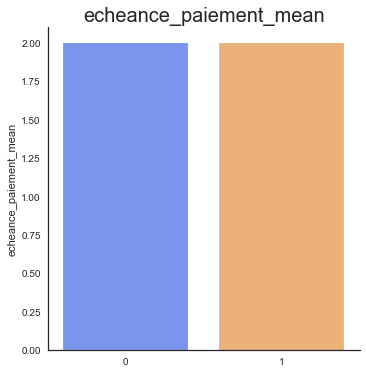

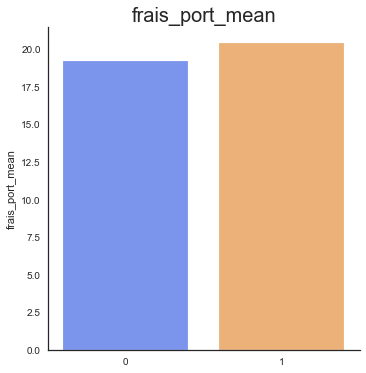

In [51]:
# Visualisation des moyennes des variables par clusters
outils_segmentation.affiche_variables_par_clusters(df_interpret_gmm,
                                                   'Cluster')

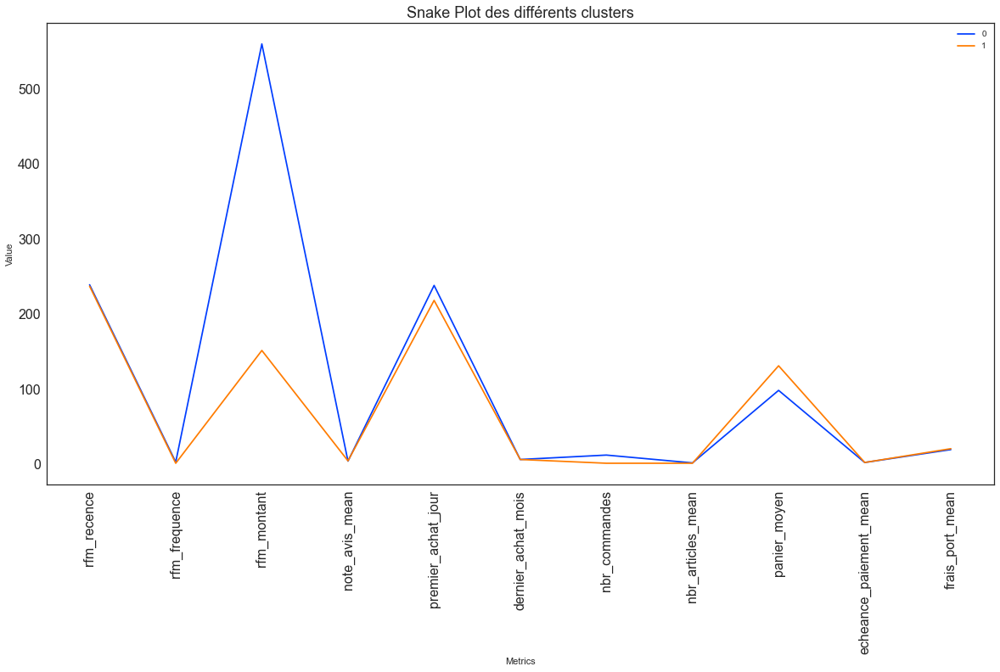

In [52]:
# Snakeplot de visualisation des différents clusters
outils_segmentation.affiche_snakeplot_par_clusters(df_interpret_gmm,
                                                   'Cluster')

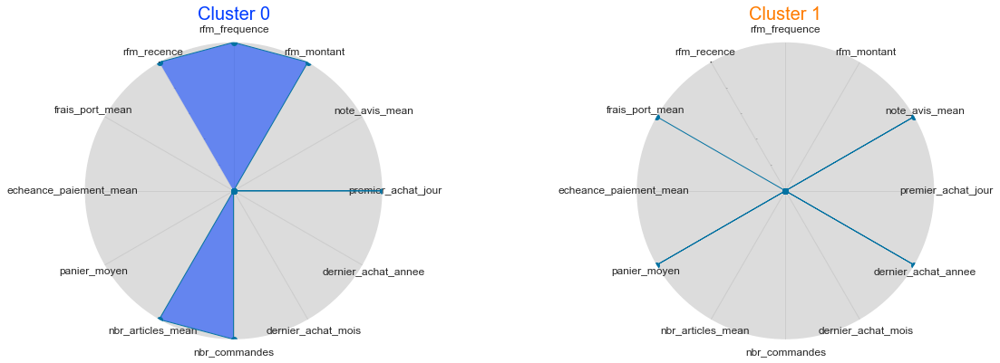

In [53]:
outils_segmentation.affiche_radarplot_par_clusters(df_interpret_gmm,
                                                   'Cluster', 5, 2)

In [54]:
df_interpret_gmm.sort_values(by='rfm_recence')

,Cluster,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,premier_achat_jour,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
1,1,236.94425,1.00000,151.3046,4.19979,218,2017.55223,6,1.00000,1.00000,130.87860,2.0,20.39449
0,0,238.85186,2.57461,559.8230,3.81271,238,2017.54812,6,11.88674,1.46899,98.12031,2.0,19.20725


**Bilan** :
***
- **Cluster 1** : Les clients fidèles.
- **cluster 2** : Les meilleurs clients.

**3 composants**

In [55]:
# Instanciation de cah avec les meilleurs paramètres
gmm_1 = mixture.GaussianMixture(n_components=3,
                                covariance_type='full')

# Entraînement du modèle
gmm_labels_1 = gmm_1.fit_predict(X_scaled_log)

In [56]:
# Préparation dataframe d'interprétation
# Ajout de l'assignation du cluster au dataframe
data_gmm['Cluster_1'] = gmm_labels_1

**Nombre de clients par clusters**

Clusters,Nb_clients,%
0,34456,37.53000
1,43243,47.10000
2,14120,15.38000


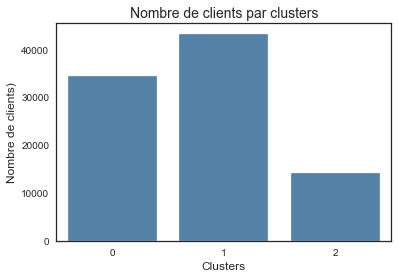

In [58]:
outils_segmentation.affiche_clients_par_clusters(gmm_labels_1)

**Projection en 2D**

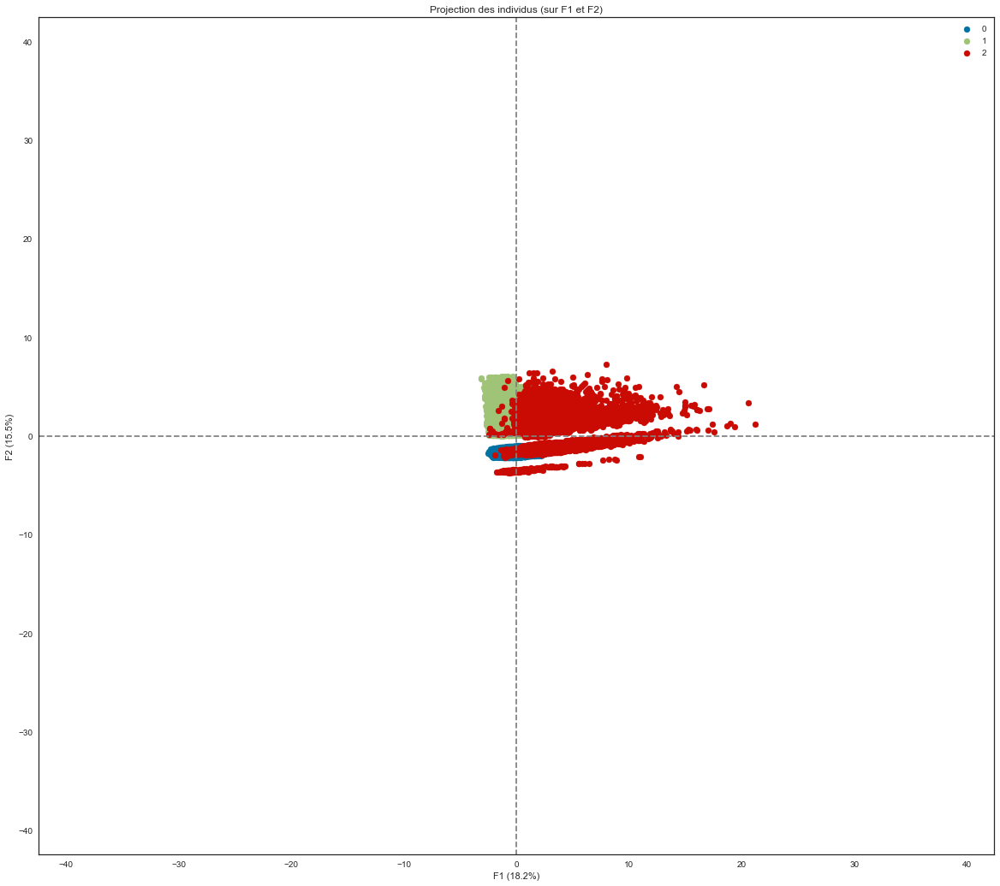

In [59]:
# Visualisation avec ACP
outils_acp.display_factorials_planes(X_projected_log_acp, n_comp_log,
                                     pca_log, [(0, 1)], alpha=1,
                                     illustrative_var=gmm_labels_1)

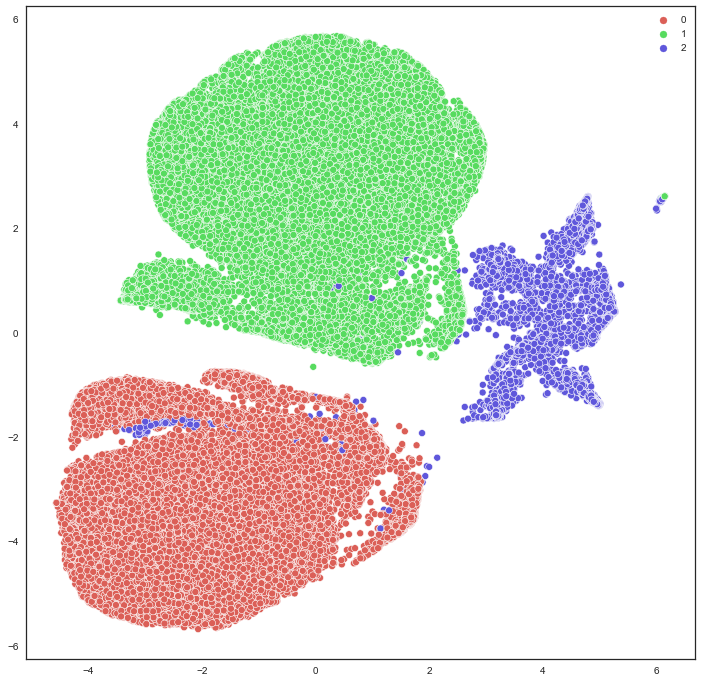

In [60]:
# Visualisation en 2D avec t-SNE
outils_segmentation.affiche_tsne_par_clusters(tsne_log, gmm_labels_1, 3)

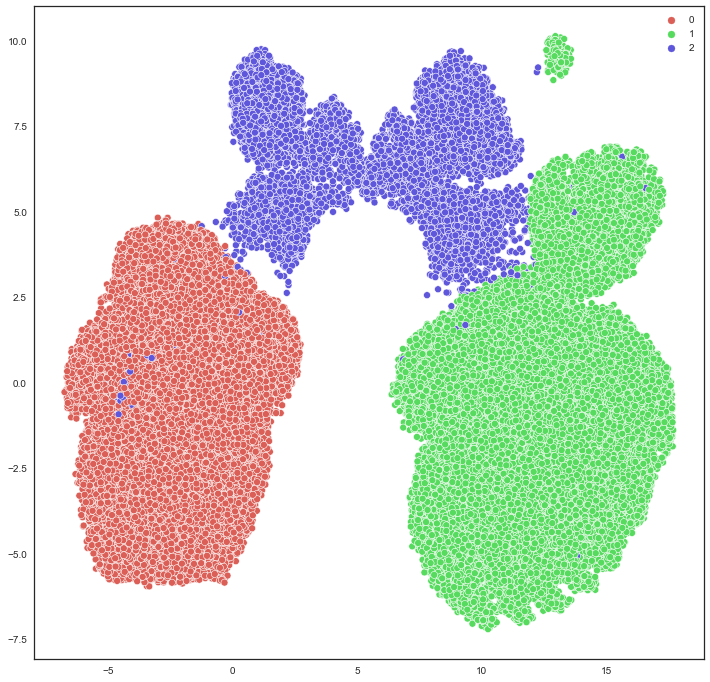

In [61]:
# Visualisation en 2D avec UMAP
outils_segmentation.affiche_umap_par_clusters(X_projected_umap_log,
                                              gmm_labels_1, 3)

**Interprétation des clusters**

In [73]:
%pycodestyle_off

In [74]:
df_interpret_gmm_1 = \
    data_gmm.groupby('Cluster_1') \
        .agg({'rfm_recence' : 'mean',
              'rfm_frequence' : 'mean',
              'rfm_montant' : 'mean',
              'note_avis_mean' : 'mean',
              'premier_achat_jour' : 'median',
              'dernier_achat_annee' : 'mean',
              'dernier_achat_mois' : 'median',
              'nbr_commandes' : 'mean',
              'nbr_articles_mean' : 'mean',
              'panier_moyen': 'mean',
              'echeance_paiement_mean' : 'median',
              'frais_port_mean' : 'mean'})
df_interpret_gmm_1.reset_index(inplace = True)
df_interpret_gmm_1.head()

,Cluster_1,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,premier_achat_jour,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,0,378.05291,1.00000,151.11317,4.21088,364,2017.00000,8,1.00000,1.00000,131.35394,2.0,19.7249
1,1,122.24554,1.00000,151.30674,4.19157,124,2018.00000,4,1.00000,1.00000,130.34087,1.0,20.9349
2,2,245.75836,2.55375,554.87328,3.81597,243,2017.52443,6,11.74256,1.46278,99.04100,2.0,19.2019


In [75]:
%pycodestyle_on

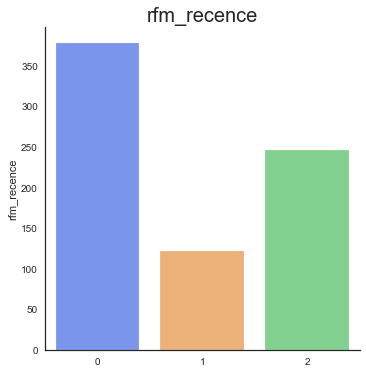

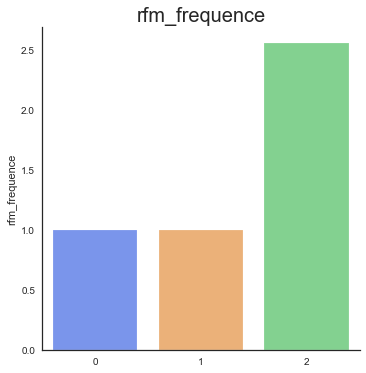

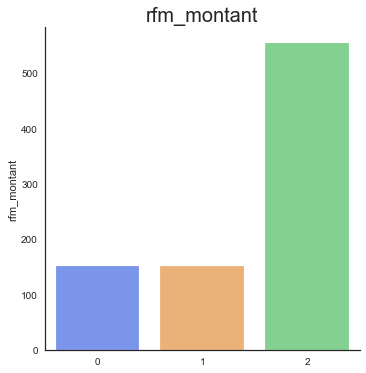

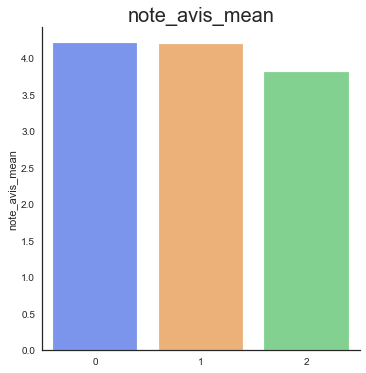

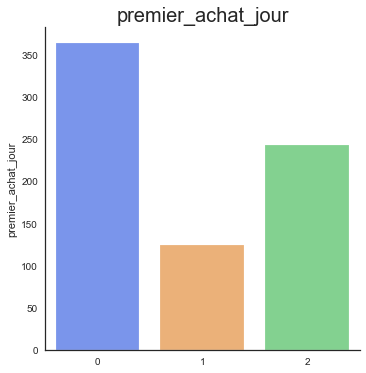

...

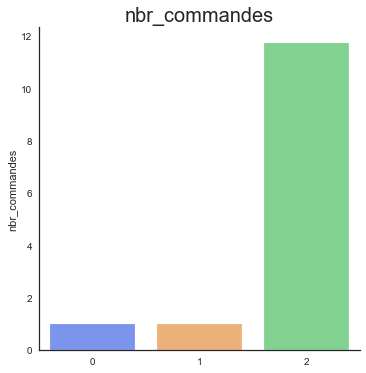

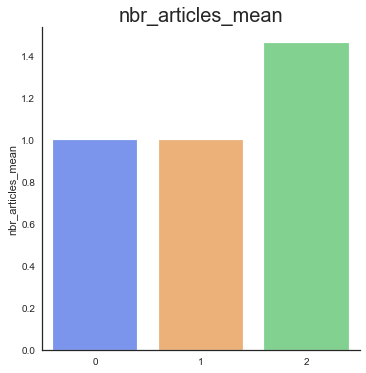

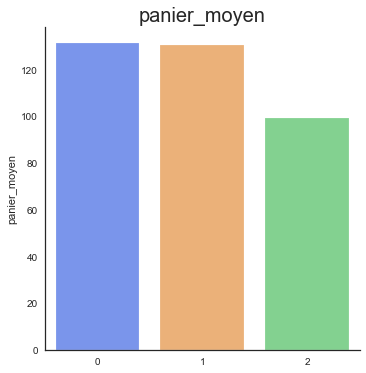

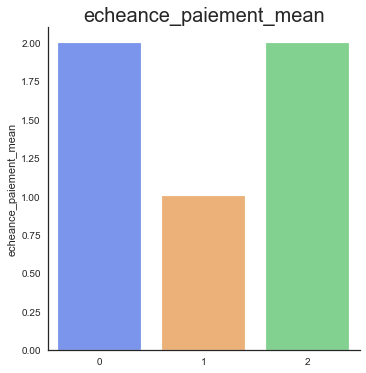

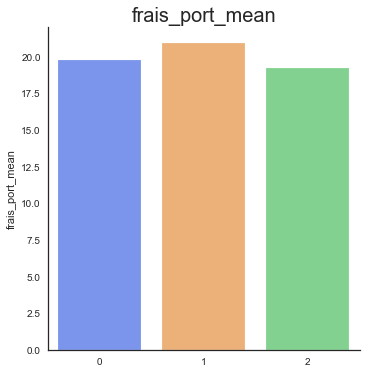

In [77]:
# Visualisation des moyennes des variables par clusters
outils_segmentation.affiche_variables_par_clusters(df_interpret_gmm_1,
                                                   'Cluster_1')

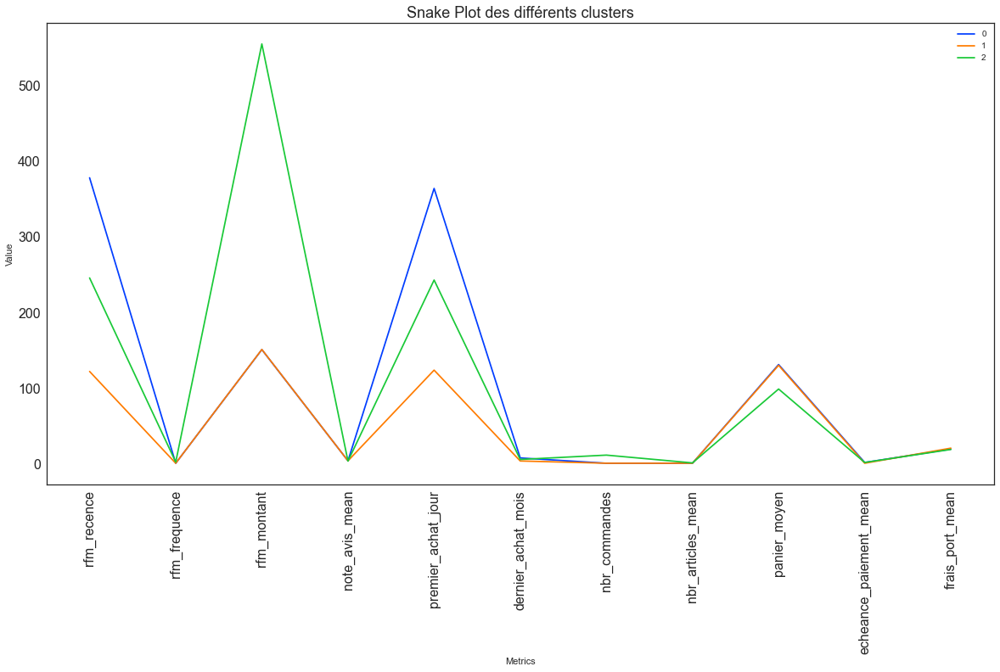

In [78]:
# Snakeplot de visualisation des différents clusters
outils_segmentation.affiche_snakeplot_par_clusters(df_interpret_gmm_1,
                                                   'Cluster_1')

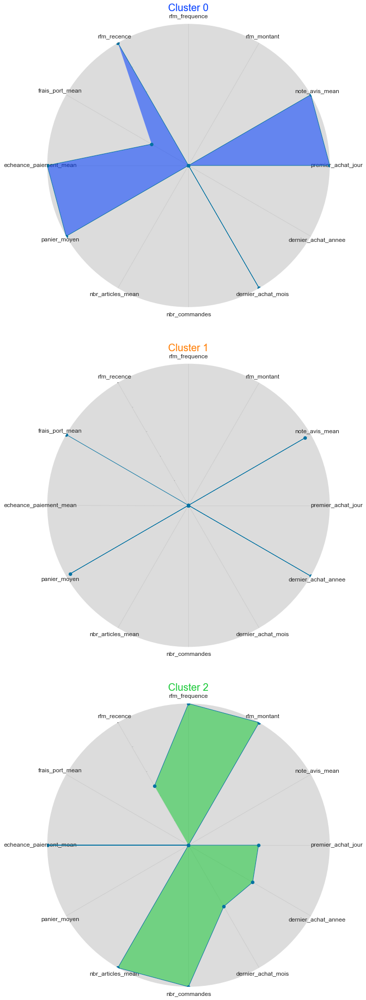

In [79]:
outils_segmentation.affiche_radarplot_par_clusters(df_interpret_gmm_1,
                                                   'Cluster_1', 3, 1)

In [81]:
df_interpret_gmm_1.sort_values(by='rfm_recence', ascending=True)

,Cluster_1,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,premier_achat_jour,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
1,1,122.24554,1.00000,151.30674,4.19157,124,2018.00000,4,1.00000,1.00000,130.34087,1.0,20.9349
2,2,245.75836,2.55375,554.87328,3.81597,243,2017.52443,6,11.74256,1.46278,99.04100,2.0,19.2019
0,0,378.05291,1.00000,151.11317,4.21088,364,2017.00000,8,1.00000,1.00000,131.35394,2.0,19.7249


**Bilan** :
***
- **Cluster 0** : Les clients perdus.
- **Cluster 1** : Les clients nouveaux.
- **Cluster 2** : Les meilleurs clients/clients fidèles.

**4 composants**

In [62]:
# Instanciation de cah avec les meilleurs paramètres
gmm_2 = mixture.GaussianMixture(n_components=4,
                                covariance_type='full')

# Entraînement du modèle
gmm_labels_2 = gmm_2.fit_predict(X_scaled_log)

In [63]:
# Préparation dataframe d'interprétation
# Ajout de l'assignation du cluster au dataframe
data_gmm['Cluster_2'] = gmm_labels_2

**Nombre de clients par clusters**

Clusters,Nb_clients,%
0,13862,15.10000
1,33780,36.79000
2,42198,45.96000
3,1979,2.16000


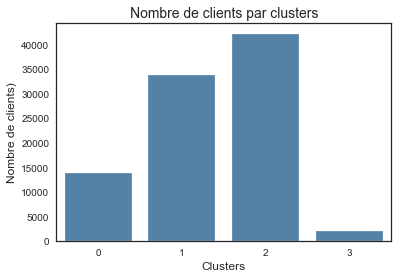

In [64]:
outils_segmentation.affiche_clients_par_clusters(gmm_labels_2)

**Bilan** :
***
- GaussianMixture 

**Projection en 2D**

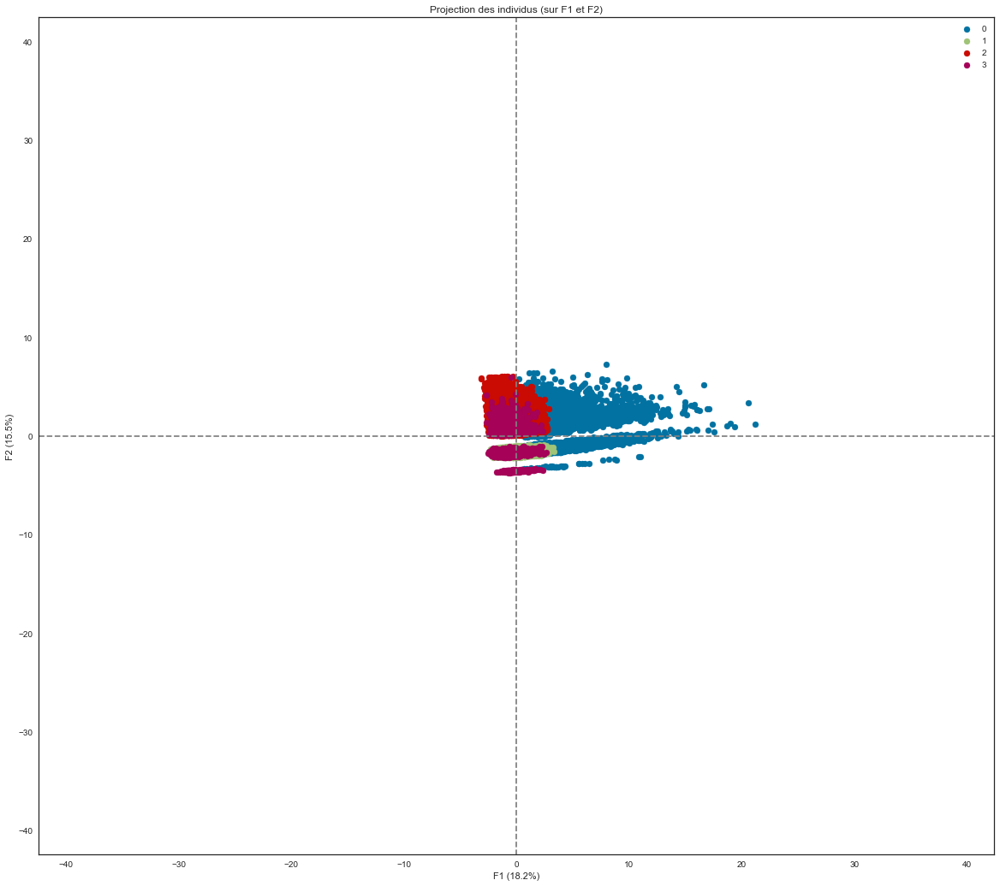

In [65]:
# Visualisation avec ACP
outils_acp.display_factorials_planes(X_projected_log_acp, n_comp_log,
                                     pca_log, [(0, 1)], alpha=1,
                                     illustrative_var=gmm_labels_2)

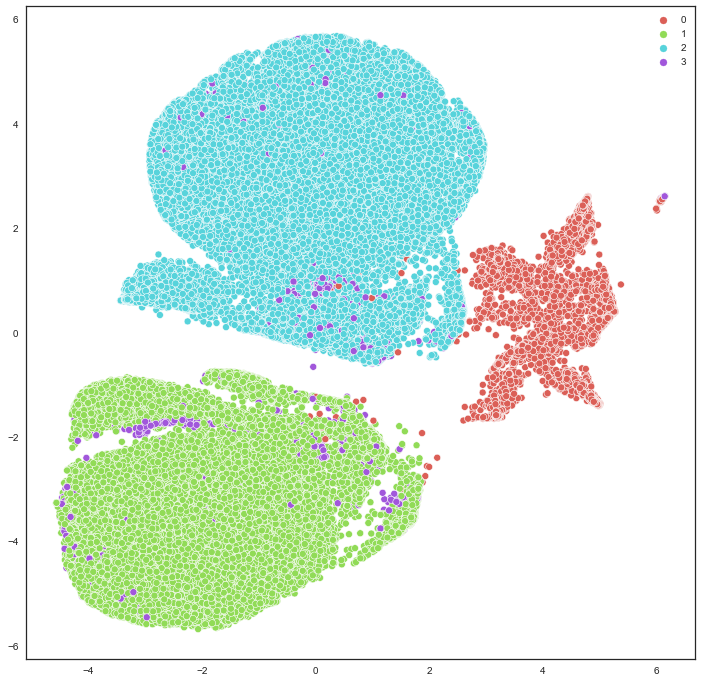

In [66]:
# Visualisation en 2D avec t-SNE
outils_segmentation.affiche_tsne_par_clusters(tsne_log, gmm_labels_2, 4)

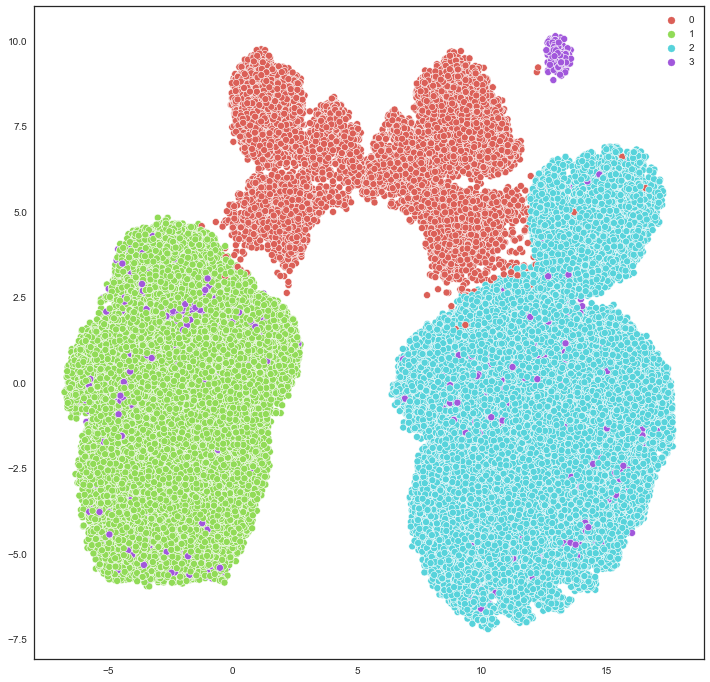

In [67]:
# Visualisation en 2D avec UMAP
outils_segmentation.affiche_umap_par_clusters(X_projected_umap_log,
                                              gmm_labels_2, 4)

**Interprétation des clusters**

In [82]:
%pycodestyle_off

In [83]:
df_interpret_gmm_2 = \
    data_gmm.groupby('Cluster_2') \
        .agg({'rfm_recence' : 'mean',
              'rfm_frequence' : 'mean',
              'rfm_montant' : 'mean',
              'note_avis_mean' : 'mean',
              'premier_achat_jour' : 'median',
              'dernier_achat_annee' : 'mean',
              'dernier_achat_mois' : 'median',
              'nbr_commandes' : 'mean',
              'nbr_articles_mean' : 'mean',
              'panier_moyen': 'mean',
              'echeance_paiement_mean' : 'median',
              'frais_port_mean' : 'mean'})
df_interpret_gmm_2.reset_index(inplace = True)
df_interpret_gmm_2.head()

,Cluster_2,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,premier_achat_jour,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
0,0,238.87022,2.58267,562.29468,3.81298,238,2017.54790,6,11.9425,1.47139,98.48027,2.0,19.12308
1,1,377.65157,1.00000,151.24615,4.21353,364,2017.00000,8,1.0000,1.00000,131.71531,2.0,19.49677
2,2,122.10652,1.00000,151.75557,4.19314,124,2018.00000,4,1.0000,1.00000,130.95888,1.0,20.77548
3,3,283.79131,1.00000,140.02950,4.09146,223,2017.43204,5,1.0000,1.00000,111.18799,1.0,28.14093


In [84]:
%pycodestyle_on

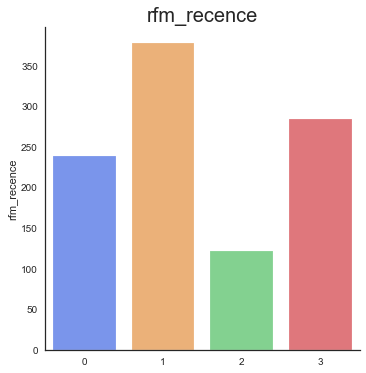

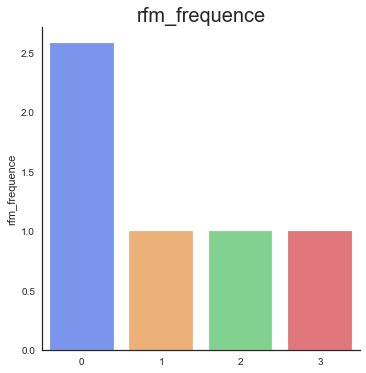

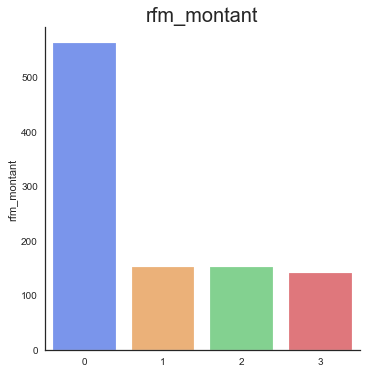

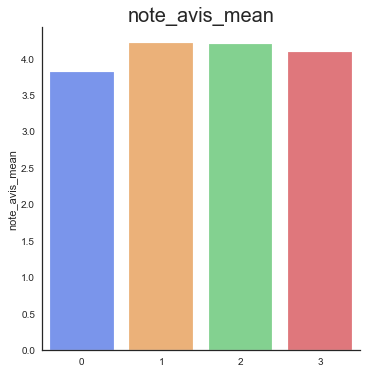

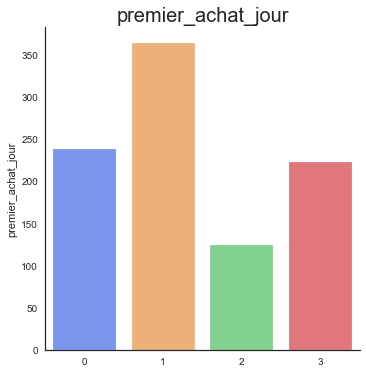

...

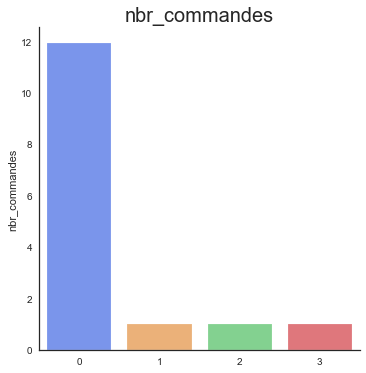

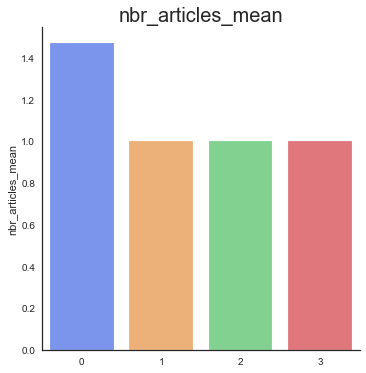

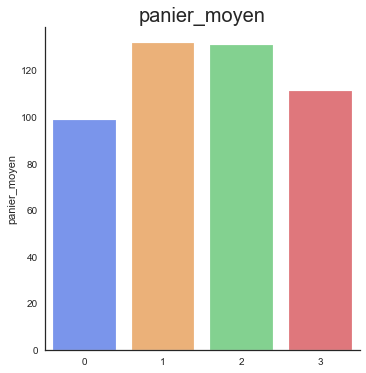

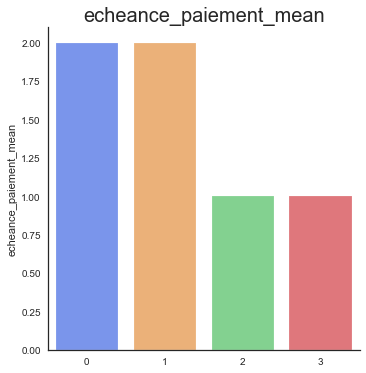

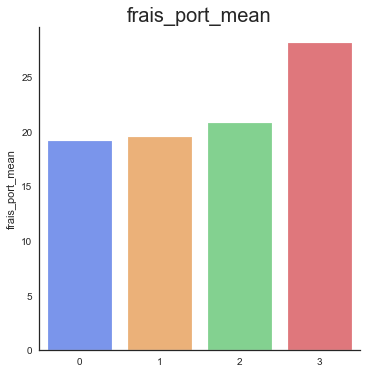

In [85]:
# Visualisation des moyennes des variables par clusters
outils_segmentation.affiche_variables_par_clusters(df_interpret_gmm_2,
                                                   'Cluster_2')

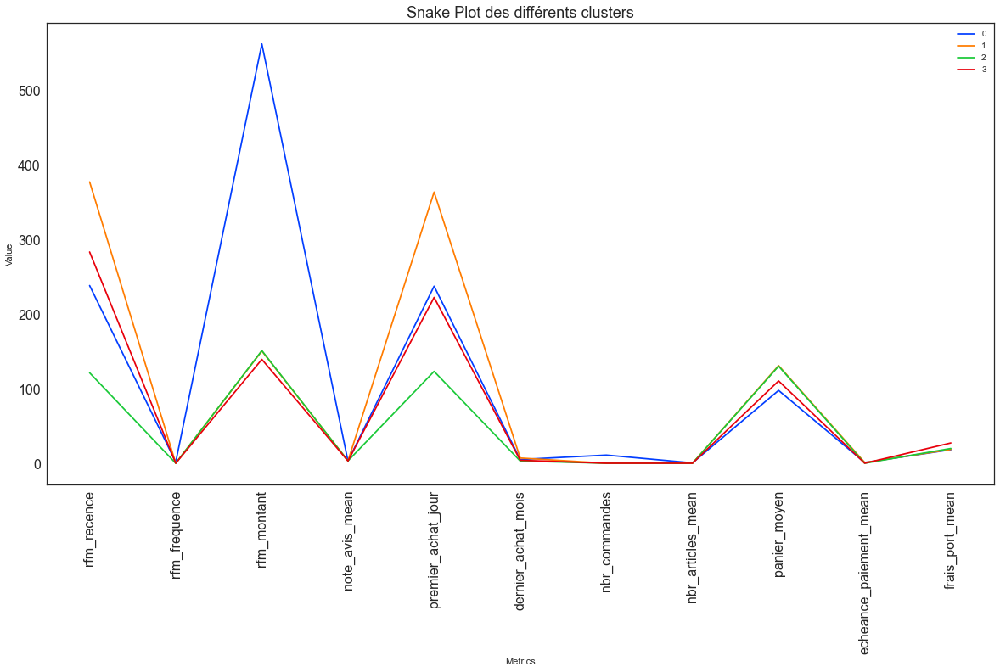

In [86]:
# Snakeplot de visualisation des différents clusters
outils_segmentation.affiche_snakeplot_par_clusters(df_interpret_gmm_2,
                                                   'Cluster_2')

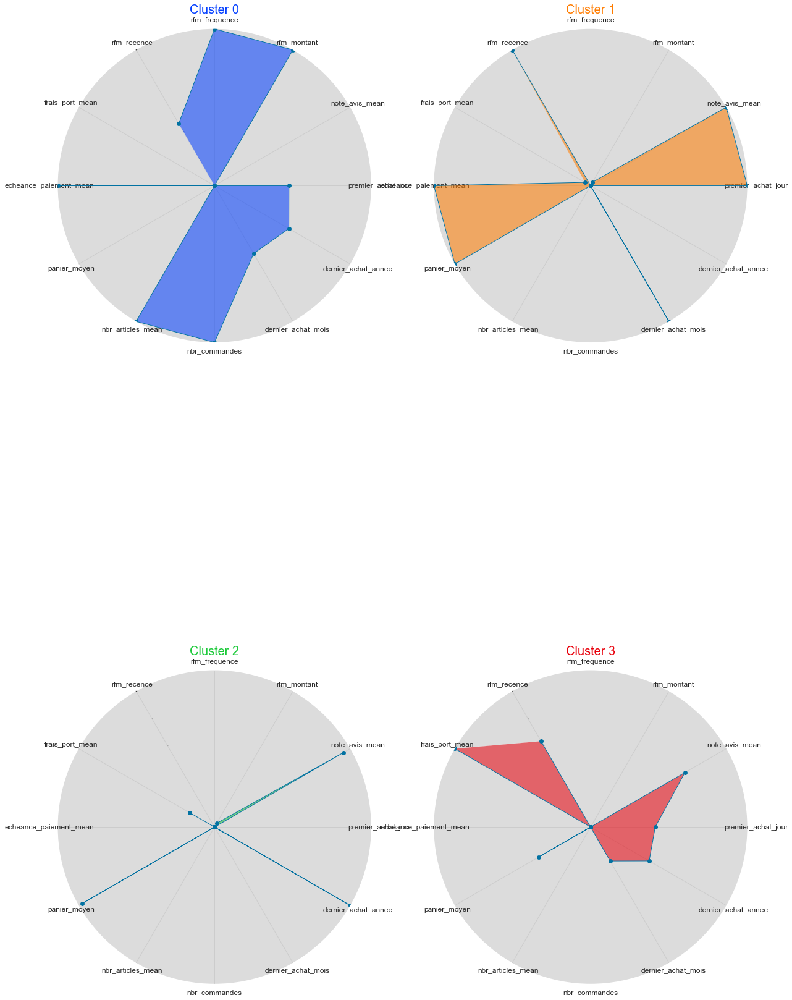

In [87]:
outils_segmentation.affiche_radarplot_par_clusters(df_interpret_gmm_2,
                                                   'Cluster_2', 2, 2)

In [88]:
df_interpret_gmm_2.sort_values(by='rfm_recence', ascending=True)

,Cluster_2,rfm_recence,rfm_frequence,rfm_montant,note_avis_mean,premier_achat_jour,dernier_achat_annee,dernier_achat_mois,nbr_commandes,nbr_articles_mean,panier_moyen,echeance_paiement_mean,frais_port_mean
2,2,122.10652,1.00000,151.75557,4.19314,124,2018.00000,4,1.0000,1.00000,130.95888,1.0,20.77548
0,0,238.87022,2.58267,562.29468,3.81298,238,2017.54790,6,11.9425,1.47139,98.48027,2.0,19.12308
3,3,283.79131,1.00000,140.02950,4.09146,223,2017.43204,5,1.0000,1.00000,111.18799,1.0,28.14093
1,1,377.65157,1.00000,151.24615,4.21353,364,2017.00000,8,1.0000,1.00000,131.71531,2.0,19.49677


**Bilan** :
***
- **Cluster 0** : les meilleurs clients.
- **Cluster 1** : les clients perdus.
- **Cluster 2** : les nouveaux clients
- **Cluster 3** : les clients fidèles.

## <span style='background:Thistle'>9. Comparaison des performances des algorithmes</span>

In [228]:
# Réduction du jeu de données à 20000 clients
# Préparation des jeux de données réduits à partir de X_scaled_log
data_comp = X_scaled_log.sample(20000, random_state=seed).copy()
X_comp = data_comp.values

# Préparation des jeux de données réduits à partir de X_scaled_cat
data_comp_cat = X_scaled_cat.sample(20000, random_state=seed).copy()
X_comp_cat = data_comp_cat.values

# Préparation des jeux de données réduits à partir de X_projected_log_acp
df = pd.DataFrame(X_projected_log_acp)
data_comp_acp = df.sample(20000, random_state=seed).copy()
X_comp_acp = data_comp_acp.values

# Préparation des jeux de données réduits à partir de data_kprot
data_comp_kproto = data_kprot.sample(20000, random_state=seed).copy()
X_comp_kproto = data_comp_kproto.values
X_comp_kproto_num = data_comp_kproto.drop(['moyen_paiement_prefere',
                                           'cat_produit_prefere'],
                                          axis=1)

In [229]:
# Dataframe de comparaisons des performances des algorithmes
df_resultats_comp = pd.DataFrame()

<span style='background:PowderBlue; font-size:16px'>**9.1. KMeans**</span>

In [230]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Instanciation du modèle KMeans pour 3 clusters et  meilleurs paramètres
# Top début d'exécution
time_start = time.time()
kmeans_3 = KMeans(n_clusters=3,
                  init='k-means++').fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('K-Means-3',
                                               X_comp,
                                               kmeans_3,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855


In [231]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Instanciation du modèle KMeans pour 4 clusters + meilleurs paramètres
# Top début d'exécution
time_start = time.time()
kmeans_4 = KMeans(n_clusters=4,
                  init='k-means++',
                  random_state=seed).fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('K-Means-4',
                                               X_comp,
                                               kmeans_4,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335


In [232]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Instanciation du modèle KMeans pour 5 clusters  + meilleurs paramètres
# Top début d'exécution
time_start = time.time()
kmeans_5 = KMeans(n_clusters=5,
                  init='k-means++').fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('K-Means-5',
                                               X_comp,
                                               kmeans_5,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454


In [233]:
# Variables quantitatives transformées en log + quantitatives
# -----------------------------------------------------------------------
# Instanciation du modèle KMeans pour 6 clusters et  meilleurs paramètres
# Top début d'exécution
time_start = time.time()
kmeans_6 = KMeans(n_clusters=6,
                  n_init=20,
                  init='k-means++').fit_predict(X_comp_cat)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('K-Means-6',
                                               X_comp_cat,
                                               kmeans_6,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199


In [234]:
# ACP + Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Instanciation du modèle KMeans pour 5 clusters
# Top début d'exécution
time_start = time.time()
kmeans_acp_5 = KMeans(n_clusters=5,
                      init='k-means++').fit_predict(X_comp_acp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('K-Means-5-acp',
                                               X_comp_acp,
                                               kmeans_acp_5,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360


<span style='background:PowderBlue; font-size:16px'>**9.2. K-Prototype**</span>

In [235]:
# Instanciation du modèle de clustering
# Top début d'exécution
time_start = time.time()
kproto = KPrototypes(n_clusters=6,
                     init='Cao',
                     n_jobs=-1).fit_predict(X_comp_kproto,
                                            categorical=cols_categorical)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('K-Proto-6',
                                               X_comp_kproto_num,
                                               kproto,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360
K-Proto-6,6,0.13665,1.86386,2369.06818,69.75964


<span style='background:PowderBlue; font-size:16px'>**9.3. CAH**</span>

In [240]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de cah avec les meilleurs paramètres
cah_3 = AgglomerativeClustering(n_clusters=3,
                                linkage='single',
                                affinity='euclidean').fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('CAH-3',
                                               X_comp,
                                               cah_3,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360
K-Proto-6,6,0.13665,1.86386,2369.06818,69.75964
CAH-3,3,0.74695,0.17329,30.51173,4.50845


In [241]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de cah avec 4 clusters + meilleurs hyperparamètres
cah_4 = AgglomerativeClustering(n_clusters=4,
                                linkage='single',
                                affinity='manhattan').fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('CAH-4',
                                               X_comp,
                                               cah_4,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360
K-Proto-6,6,0.13665,1.86386,2369.06818,69.75964
CAH-3,3,0.74695,0.17329,30.51173,4.50845
CAH-4,4,0.69212,0.19346,26.76747,3.53690


In [242]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de cah avec 5 clusters + meilleurs hyperparamètres
cah_5 = AgglomerativeClustering(n_clusters=5,
                                linkage='single',
                                affinity='manhattan').fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('CAH-5',
                                               X_comp,
                                               cah_5,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360
K-Proto-6,6,0.13665,1.86386,2369.06818,69.75964
CAH-3,3,0.74695,0.17329,30.51173,4.50845
CAH-4,4,0.69212,0.19346,26.76747,3.53690
CAH-5,5,0.59979,0.22597,22.82009,3.55105


In [243]:
# ACP + Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de cah avec les meilleurs paramètres
cah_acp = AgglomerativeClustering(n_clusters=3,
                                  linkage='single',
                                  affinity='manhattan').fit_predict(X_comp_acp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('CAH-3-acp',
                                               X_comp_acp,
                                               cah_acp,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360
K-Proto-6,6,0.13665,1.86386,2369.06818,69.75964
CAH-3,3,0.74695,0.17329,30.51173,4.50845
CAH-4,4,0.69212,0.19346,26.76747,3.53690
CAH-5,5,0.59979,0.22597,22.82009,3.55105
CAH-3-acp,3,0.73880,0.17507,30.46068,2.65669


<span style='background:PowderBlue; font-size:16px'>**9.4. DBSCAN**</span>

In [244]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de dbscan avec les meilleurs paramètres
dbscan = DBSCAN(eps=4,
                min_samples=10,
                n_jobs=-1).fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('Dbscan-1',
                                               X_comp,
                                               dbscan,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360
K-Proto-6,6,0.13665,1.86386,2369.06818,69.75964
CAH-3,3,0.74695,0.17329,30.51173,4.50845
CAH-4,4,0.69212,0.19346,26.76747,3.53690
CAH-5,5,0.59979,0.22597,22.82009,3.55105
CAH-3-acp,3,0.73880,0.17507,30.46068,2.65669


In [245]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
dbscan_2 = DBSCAN(eps=3,
                  min_samples=10,
                  n_jobs=-1).fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('Dbscan-2',
                                               X_comp,
                                               dbscan_2,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360
K-Proto-6,6,0.13665,1.86386,2369.06818,69.75964
CAH-3,3,0.74695,0.17329,30.51173,4.50845
CAH-4,4,0.69212,0.19346,26.76747,3.53690
CAH-5,5,0.59979,0.22597,22.82009,3.55105
CAH-3-acp,3,0.73880,0.17507,30.46068,2.65669


In [246]:
# ACP + Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de DBSCAN avec les meilleurs paramètres
dbscan_acp = DBSCAN(eps=4,
                    min_samples=10,
                    n_jobs=-1).fit_predict(X_comp_acp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('Dbscan-acp-1',
                                               X_comp_acp,
                                               dbscan_acp,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360
K-Proto-6,6,0.13665,1.86386,2369.06818,69.75964
CAH-3,3,0.74695,0.17329,30.51173,4.50845
CAH-4,4,0.69212,0.19346,26.76747,3.53690
CAH-5,5,0.59979,0.22597,22.82009,3.55105
CAH-3-acp,3,0.73880,0.17507,30.46068,2.65669


In [247]:
# ACP + Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de DBSCAN avec d'autres paramètres
dbscan_acp_1 = DBSCAN(eps=1.7,
                      min_samples=10,
                      n_jobs=-1).fit_predict(X_comp_acp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('Dbscan-acp-2',
                                               X_comp_acp,
                                               dbscan_acp_1,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360
K-Proto-6,6,0.13665,1.86386,2369.06818,69.75964
CAH-3,3,0.74695,0.17329,30.51173,4.50845
CAH-4,4,0.69212,0.19346,26.76747,3.53690
CAH-5,5,0.59979,0.22597,22.82009,3.55105
CAH-3-acp,3,0.73880,0.17507,30.46068,2.65669


<span style='background:PowderBlue; font-size:16px'>**9.5. HDBSCAN**</span>

In [248]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de hdbscan avec les meilleurs paramètres
clus_hdbscan = hdbscan.HDBSCAN(algorithm='best', alpha=1.0,
                               approx_min_span_tree=True,
                               gen_min_span_tree=True,
                               leaf_size=40,
                               cluster_selection_method='leaf',
                               metric='euclidean',
                               min_cluster_size=4000,
                               min_samples=1,
                               allow_single_cluster=False).fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('HDbscan',
                                               X_comp,
                                               clus_hdbscan,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360
K-Proto-6,6,0.13665,1.86386,2369.06818,69.75964
CAH-3,3,0.74695,0.17329,30.51173,4.50845
CAH-4,4,0.69212,0.19346,26.76747,3.53690
CAH-5,5,0.59979,0.22597,22.82009,3.55105
CAH-3-acp,3,0.73880,0.17507,30.46068,2.65669


<span style='background:PowderBlue; font-size:16px'>**9.6. OPTICS**</span>

In [249]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de cah avec les meilleurs paramètres
optics_3 = OPTICS(min_samples=1,
                  eps=4,
                  cluster_method='dbscan',
                  n_jobs=-1).fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('Optics-1',
                                               X_comp,
                                               optics_3,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360
K-Proto-6,6,0.13665,1.86386,2369.06818,69.75964
CAH-3,3,0.74695,0.17329,30.51173,4.50845
CAH-4,4,0.69212,0.19346,26.76747,3.53690
CAH-5,5,0.59979,0.22597,22.82009,3.55105
CAH-3-acp,3,0.73880,0.17507,30.46068,2.65669


In [250]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de cah avec les meilleurs paramètres
optics = OPTICS(min_samples=1,
                xi=0.2,
                min_cluster_size=0.01,
                cluster_method='xi',
                n_jobs=-1).fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('Optics-2',
                                               X_comp,
                                               optics,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360
K-Proto-6,6,0.13665,1.86386,2369.06818,69.75964
CAH-3,3,0.74695,0.17329,30.51173,4.50845
CAH-4,4,0.69212,0.19346,26.76747,3.53690
CAH-5,5,0.59979,0.22597,22.82009,3.55105
CAH-3-acp,3,0.73880,0.17507,30.46068,2.65669


In [251]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de cah avec les meilleurs paramètres
optics_2 = OPTICS(min_samples=1,
                  eps=4,
                  cluster_method='dbscan',
                  n_jobs=-1).fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('Optics-3',
                                               X_comp,
                                               optics_2,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360
K-Proto-6,6,0.13665,1.86386,2369.06818,69.75964
CAH-3,3,0.74695,0.17329,30.51173,4.50845
CAH-4,4,0.69212,0.19346,26.76747,3.53690
CAH-5,5,0.59979,0.22597,22.82009,3.55105
CAH-3-acp,3,0.73880,0.17507,30.46068,2.65669


<span style='background:PowderBlue; font-size:16px'>**9.7. Mélange de gaussienne**</span>

In [252]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de cah avec les meilleurs paramètres
gmm = mixture.GaussianMixture(n_components=2,
                              covariance_type='full').fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('GMM-2',
                                               X_comp,
                                               gmm,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360
K-Proto-6,6,0.13665,1.86386,2369.06818,69.75964
CAH-3,3,0.74695,0.17329,30.51173,4.50845
CAH-4,4,0.69212,0.19346,26.76747,3.53690
CAH-5,5,0.59979,0.22597,22.82009,3.55105
CAH-3-acp,3,0.73880,0.17507,30.46068,2.65669


In [253]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de cah avec les meilleurs paramètres
gmm_1 = mixture.GaussianMixture(n_components=3,
                                covariance_type='full').fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('GMM-3',
                                               X_comp,
                                               gmm_1,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360
K-Proto-6,6,0.13665,1.86386,2369.06818,69.75964
CAH-3,3,0.74695,0.17329,30.51173,4.50845
CAH-4,4,0.69212,0.19346,26.76747,3.53690
CAH-5,5,0.59979,0.22597,22.82009,3.55105
CAH-3-acp,3,0.73880,0.17507,30.46068,2.65669


In [254]:
# Variables quantitatives transformées en log
# -----------------------------------------------------------------------
# Top début d'exécution
time_start = time.time()
# Instanciation de cah avec les meilleurs paramètres
gmm_2 = mixture.GaussianMixture(n_components=4,
                                covariance_type='full').fit_predict(X_comp)
# Top fin d'exécution
time_end = time.time()
# Durée d'exécution
time_execution = time_end - time_start
df_resultats_comp = \
    outils_segmentation.calcul_comp_clustering('GMM-4',
                                               X_comp,
                                               gmm_2,
                                               df_resultats_comp,
                                               time_execution)
df_resultats_comp.style.hide_index()

Algos,Nb_clusters,coef_silh,davies_bouldin,calinski_harabasz,Durée
K-Means-3,3,0.15883,1.95836,3281.44019,0.15855
K-Means-4,4,0.14617,1.98232,2818.52479,0.23335
K-Means-5,5,0.13466,1.93985,2564.19551,0.28454
K-Means-6,6,0.12082,1.98239,2140.17771,0.74199
K-Means-5-acp,5,0.16385,1.73178,3214.79648,0.20360
K-Proto-6,6,0.13665,1.86386,2369.06818,69.75964
CAH-3,3,0.74695,0.17329,30.51173,4.50845
CAH-4,4,0.69212,0.19346,26.76747,3.53690
CAH-5,5,0.59979,0.22597,22.82009,3.55105
CAH-3-acp,3,0.73880,0.17507,30.46068,2.65669


<span style='background:PowderBlue; font-size:16px'>**9.8. Visualisation des performances**</span>

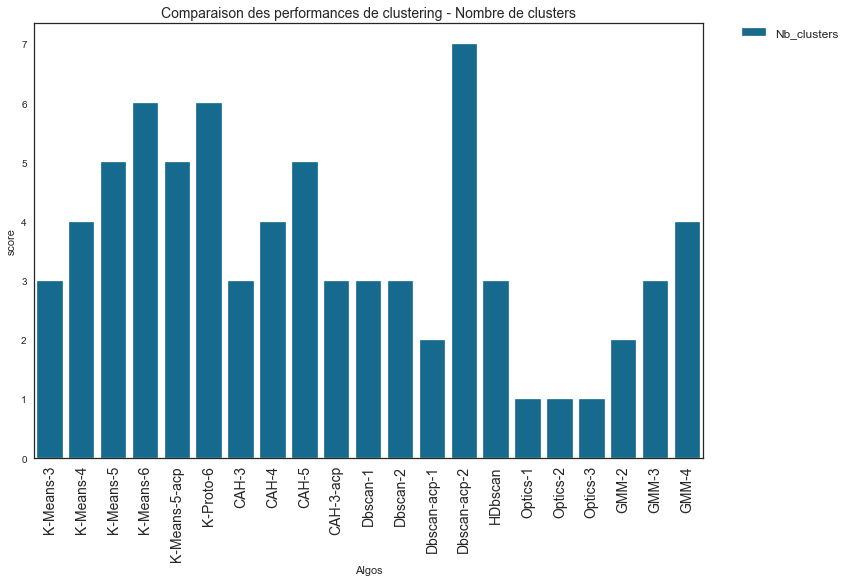

In [275]:
# Visualisation des nombres de clusters
# --------------------------------------------------------------------
# Comparaison visuelle des 7 algorithmes
comparaison_perf_melt = pd.melt(df_resultats_comp, id_vars=['Algos'],
                                value_name='score',
                                value_vars=['Nb_clusters'])
# Visualisation
plt.figure(figsize=(12, 8))
sns.barplot(x=comparaison_perf_melt['Algos'],
            y=comparaison_perf_melt['score'],
            hue=comparaison_perf_melt['variable'])
plt.title('Comparaison des performances de clustering - Nombre de clusters',
          fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
plt.xticks(rotation=90, fontsize=14)
plt.show()

- Le plus petit nombre de clusters par algorithmes a été déterminé par une recherche des meilleurs hyperparamètres pour chaque algorithme. Souvent le nombre de clusters est de 3 et ne convient pas pour pouvoir segmenter les clients de manières fines. 
- En augmentant le nombre de clusters ou en modifiant les hyperparamètres, une segmentation de clientèle plus fine est obtenue.
- L'algorithme **CAH* pour 3, 4 ou 5 clusters ne permet en réalité de n'obtenir qu'un seul cluster (100% des clients dans 1 seul cluster) et ne permet pas de segmenter la clientèle pour notre jeu de données.
- De même, l'algorithme **OPTICS** ne sélectionne qu'un seul cluster et ne permet pas non plus de répondre aux besoins de notre projet.
- Les meilleurs hyperparamètres de **DBSCAN** ne sélectionne qu'un seul cluster mais en modifiant les paramètres (très délicat) nous parvenons à segmenter les clients plus finement.
- L'algorithme **HDBSCAN** avec ces meilleurs paramètres permet de segmenter les clients assez finement.
- L'algorithme **GaussianMixtureModel** permet de segmenter finement les clients et les groupes sont distinctivement séparés en visualisation 2D.
- Les algorithmes **K-Means** et **K-Prototype** permettent avec un paramétrage très simple de segmenter les clients efficacement.

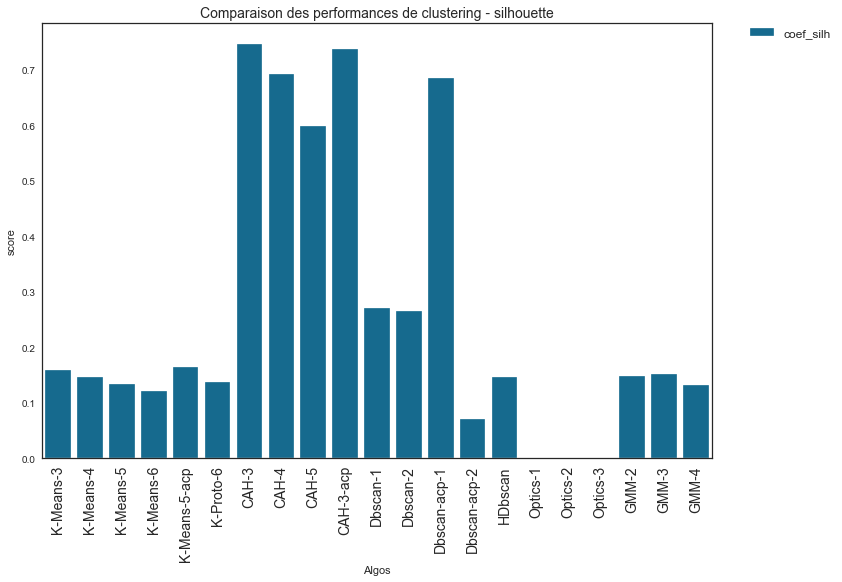

In [278]:
# Visualisation du score de silhouette
# ---------------------------------------------------------------------
# Comparaison visuelle des 7 algorithmes
comparaison_perf_melt = pd.melt(df_resultats_comp, id_vars=['Algos'],
                                value_name='score',
                                value_vars=['coef_silh'])
# Visualisation
plt.figure(figsize=(12, 8))
sns.barplot(x=comparaison_perf_melt['Algos'],
            y=comparaison_perf_melt['score'],
            hue=comparaison_perf_melt['variable'])
plt.title('Comparaison des performances de clustering - silhouette',
          fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
plt.xticks(rotation=90, fontsize=14)
plt.show()

- ***Rappel*** : **score de silhouette** : mesure la différence entre la distance quadratique moyenne intra-groupe et celle du groupe le plus proche (à maximiser).
- Si on retire les algorithmes ne pouvant sélectionner qu'un seul cluster donc inutiles (CAH, OPTICS, DBSCAN), les scores de silhouette (le plus haut possible), sur l'ensemble des données, sont assez identiques pour les algorithmes **K-Means, K-Prototype, HDBscan et GMM**.

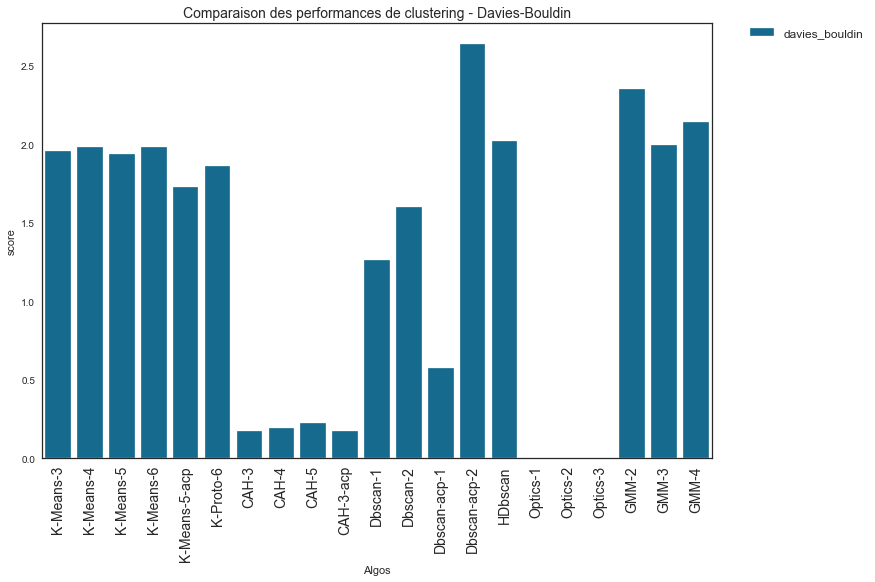

In [279]:
# Visualisation de l'indice Davies-Bouldin
# ---------------------------------------------------------------------
# Comparaison visuelle des 7 algorithmes
comparaison_perf_melt = pd.melt(df_resultats_comp, id_vars=['Algos'],
                                value_name='score',
                                value_vars=['davies_bouldin'])
# Visualisation
plt.figure(figsize=(12, 8))
sns.barplot(x=comparaison_perf_melt['Algos'],
            y=comparaison_perf_melt['score'],
            hue=comparaison_perf_melt['variable'])
plt.title('Comparaison des performances de clustering - Davies-Bouldin',
          fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
plt.xticks(rotation=90, fontsize=14)
plt.show()

- ***Rappel*** : **Score de Davies-Bouldin** : mesure le rapport maximal de la dispersion des paires de clusters par rapport à leur distance (à minimiser).
- Si on retire les algorithmes ne pouvant sélectionner qu'un seul cluster donc inutiles (CAH, OPTICS, DBSCAN), les scores de Davies-Bouldin (le plus bas possible), sur l'ensemble des données, sont assez identiques pour les algorithmes **K-Means, K-Prototype, HDBscan sauf pour GMM** avec des valeurs un peu plus élevées.

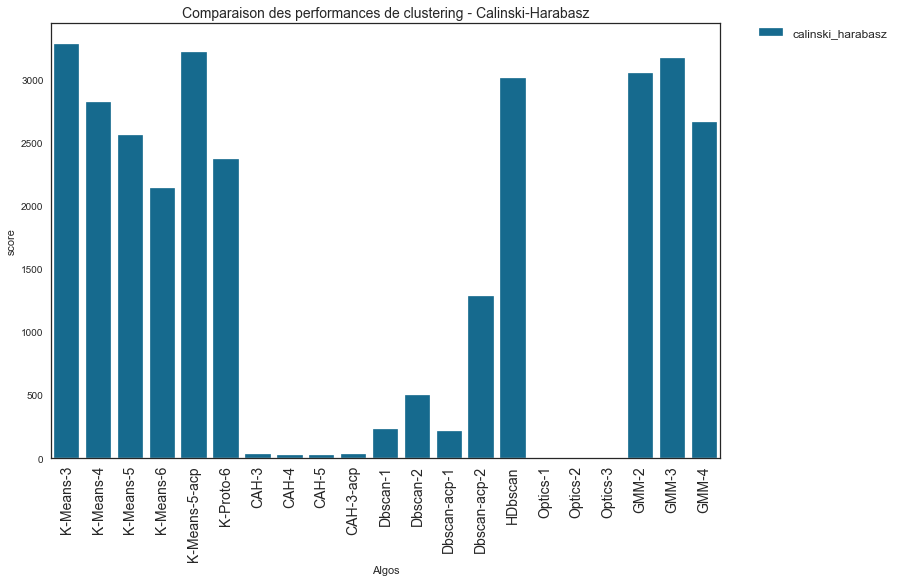

In [280]:
# Visualisation de l'indice Calinski Harabasz
# ---------------------------------------------------------------------
# Comparaison visuelle des 7 algorithmes
comparaison_perf_melt = pd.melt(df_resultats_comp, id_vars=['Algos'],
                                value_name='score',
                                value_vars=['calinski_harabasz'])
# Visualisation
plt.figure(figsize=(12, 8))
sns.barplot(x=comparaison_perf_melt['Algos'],
            y=comparaison_perf_melt['score'],
            hue=comparaison_perf_melt['variable'])
plt.title('Comparaison des performances de clustering - Calinski-Harabasz',
          fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
plt.xticks(rotation=90, fontsize=14)
plt.show()

- ***Rappel*** : **Score de Calinski-Harabasz** : le rapport entre la dispersion inter-clusters et la dispersion intra-clusters (à maximiser).
- Si on retire les algorithmes ne pouvant sélectionner qu'un seul cluster donc inutiles (CAH, OPTICS, DBSCAN), les scores de Calinski-Harabasz (le plus bas possible), sont favorables pour les algorithmes **K-Means et K-Prototype**, et plus défavorable pour **HDBscan et GMM** avec des valeurs bien plus élevées.

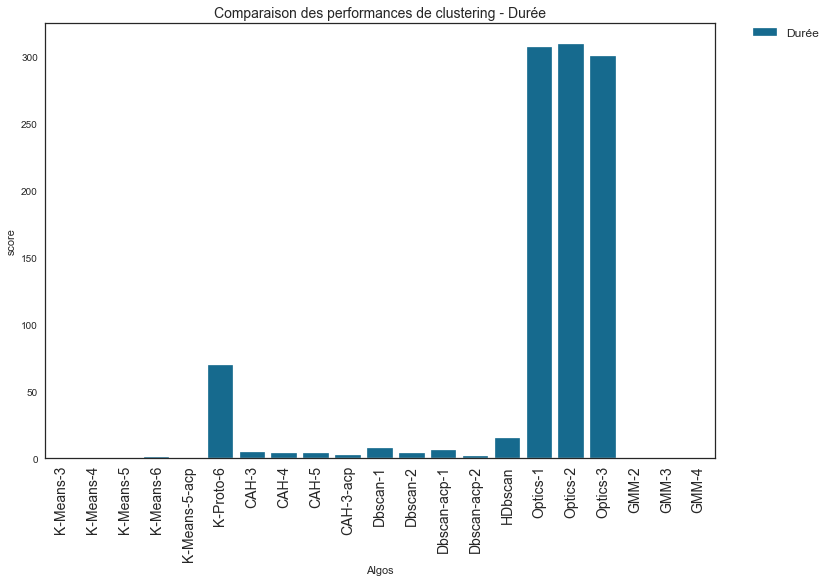

In [281]:
# Visualisation de la durée entraînement + prédiction
# ---------------------------------------------------------------------
# Comparaison visuelle des 7 algorithmes
comparaison_perf_melt = pd.melt(df_resultats_comp, id_vars=['Algos'],
                                value_name='score',
                                value_vars=['Durée'])
# Visualisation
plt.figure(figsize=(12, 8))
sns.barplot(x=comparaison_perf_melt['Algos'],
            y=comparaison_perf_melt['score'],
            hue=comparaison_perf_melt['variable'])
plt.title('Comparaison des performances de clustering - Durée',
          fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
plt.xticks(rotation=90, fontsize=14)
plt.show()

- Si on retire les algorithmes ne pouvant sélectionner qu'un seul cluster donc inutiles (CAH, OPTICS, DBSCAN), les durées (la plus basse possible), sont favorables pour les algorithmes **K-Means et GMM**, **HDBSCAN** est relativement long et **K-Prototype** obtient des durées bien plus longues.

**Bilan** :
***
- la comparaison des résultats des performances permet d'envisager pour la segmentation de clientèle, l'utilisation des algorithmes **KMeans** et **GMM** (HDBCSAN est plus difficile à paramétrer et plus long) pour les variables quantitatives et **K-Prototype** pour embarquer toutes les variables quantitatives et qualitatives.

## <span style='background:Thistle'>10. Stabilité d'initialisation de la partition</span>

In [294]:
# Dataframe de sauvegarde des scores ARI de stabilité d'initialisation
df_stabilite_init = pd.DataFrame()

In [295]:
model = KMeans(n_clusters=3,
               init='k-means++')
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_initialisation('K-Means-3',
                                                        model,
                                                        X_scaled_log,
                                                        df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005


In [296]:
model = KMeans(n_clusters=4,
               init='k-means++',
               random_state=seed)
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_initialisation('K-Means-4',
                                                        model,
                                                        X_scaled_log,
                                                        df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000


In [297]:
model = KMeans(n_clusters=5,
               init='k-means++')
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_initialisation('K-Means-5',
                                                        model,
                                                        X_scaled_log,
                                                        df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498


In [302]:
model = KMeans(n_clusters=6,
               n_init=20,
               init='k-means++')
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_initialisation('K-Means-6',
                                                        model,
                                                        X_scaled_cat,
                                                        df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498
K-Means-6,0.99790,0.00221


In [303]:
model = KMeans(n_clusters=5,
               init='k-means++')
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_initialisation('K-Means-5-acp',
                                                        model,
                                                        X_projected_log_acp,
                                                        df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498
K-Means-6,0.99790,0.00221
K-Means-5-acp,0.99102,0.00458


In [304]:
model = KPrototypes(n_clusters=6,
                    init='Cao',
                    n_jobs=-1)
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation. calcul_stabilite_init_kproto('K-Proto-6',
                                                      model,
                                                      cols_categorical,
                                                      data_kprot,
                                                      df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498
K-Means-6,0.99790,0.00221
K-Means-5-acp,0.99102,0.00458
K-Proto-6,0.99847,0.00197


In [305]:
model = AgglomerativeClustering(n_clusters=3,
                                linkage='single',
                                affinity='euclidean')
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_initialisation('CAH-3',
                                                        model,
                                                        X_scaled_log,
                                                        df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498
K-Means-6,0.99790,0.00221
K-Means-5-acp,0.99102,0.00458
K-Proto-6,0.99847,0.00197
CAH-3,1.00000,0.00000


In [306]:
model = AgglomerativeClustering(n_clusters=4,
                                linkage='single',
                                affinity='manhattan')
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_initialisation('CAH-4',
                                                        model,
                                                        X_scaled_log,
                                                        df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498
K-Means-6,0.99790,0.00221
K-Means-5-acp,0.99102,0.00458
K-Proto-6,0.99847,0.00197
CAH-3,1.00000,0.00000
CAH-4,1.00000,0.00000


In [307]:
model = AgglomerativeClustering(n_clusters=5,
                                linkage='single',
                                affinity='manhattan')
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_initialisation('CAH-5',
                                                        model,
                                                        X_scaled_log,
                                                        df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498
K-Means-6,0.99790,0.00221
K-Means-5-acp,0.99102,0.00458
K-Proto-6,0.99847,0.00197
CAH-3,1.00000,0.00000
CAH-4,1.00000,0.00000
CAH-5,1.00000,0.00000


In [309]:
model = AgglomerativeClustering(n_clusters=3,
                                linkage='single',
                                affinity='manhattan')
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_initialisation('CAH-3-acp',
                                                        model,
                                                        X_projected_log_acp,
                                                        df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498
K-Means-6,0.99790,0.00221
K-Means-5-acp,0.99102,0.00458
K-Proto-6,0.99847,0.00197
CAH-3,1.00000,0.00000
CAH-4,1.00000,0.00000
CAH-5,1.00000,0.00000
DBSCAN-1,1.00000,0.00000


2:35: E127 32
3:35: E127 32


In [308]:
model = DBSCAN(eps=4,
               min_samples=10,
               n_jobs=-1)
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_initialisation('DBSCAN-1',
                                                        model,
                                                        X_scaled_log,
                                                        df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498
K-Means-6,0.99790,0.00221
K-Means-5-acp,0.99102,0.00458
K-Proto-6,0.99847,0.00197
CAH-3,1.00000,0.00000
CAH-4,1.00000,0.00000
CAH-5,1.00000,0.00000
DBSCAN-1,1.00000,0.00000


In [310]:
model = DBSCAN(eps=3,
               min_samples=10,
               n_jobs=-1)
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_initialisation('DBSCAN-2',
                                                        model,
                                                        X_scaled_log,
                                                        df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498
K-Means-6,0.99790,0.00221
K-Means-5-acp,0.99102,0.00458
K-Proto-6,0.99847,0.00197
CAH-3,1.00000,0.00000
CAH-4,1.00000,0.00000
CAH-5,1.00000,0.00000
DBSCAN-1,1.00000,0.00000


In [311]:
model = DBSCAN(eps=4,
               min_samples=10,
               n_jobs=-1)
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_initialisation('DBSCAN-1-acp',
                                                        model,
                                                        X_projected_log_acp,
                                                        df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498
K-Means-6,0.99790,0.00221
K-Means-5-acp,0.99102,0.00458
K-Proto-6,0.99847,0.00197
CAH-3,1.00000,0.00000
CAH-4,1.00000,0.00000
CAH-5,1.00000,0.00000
DBSCAN-1,1.00000,0.00000


In [312]:
model = DBSCAN(eps=1.7,
               min_samples=10,
               n_jobs=-1)
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_initialisation('DBSCAN-2-acp',
                                                        model,
                                                        X_projected_log_acp,
                                                        df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498
K-Means-6,0.99790,0.00221
K-Means-5-acp,0.99102,0.00458
K-Proto-6,0.99847,0.00197
CAH-3,1.00000,0.00000
CAH-4,1.00000,0.00000
CAH-5,1.00000,0.00000
DBSCAN-1,1.00000,0.00000


In [313]:
model = hdbscan.HDBSCAN(algorithm='best', alpha=1.0,
                        approx_min_span_tree=True,
                        gen_min_span_tree=True,
                        leaf_size=40,
                        cluster_selection_method='leaf',
                        metric='euclidean',
                        min_cluster_size=4000,
                        min_samples=1,
                        allow_single_cluster=False)
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_initialisation('HDBSCAN',
                                                        model,
                                                        X_scaled_log,
                                                        df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498
K-Means-6,0.99790,0.00221
K-Means-5-acp,0.99102,0.00458
K-Proto-6,0.99847,0.00197
CAH-3,1.00000,0.00000
CAH-4,1.00000,0.00000
CAH-5,1.00000,0.00000
DBSCAN-1,1.00000,0.00000


In [314]:
model = OPTICS(min_samples=1,
               eps=4,
               cluster_method='dbscan',
               n_jobs=-1)
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_initialisation('OPTICS',
                                                        model,
                                                        X_scaled_log,
                                                        df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498
K-Means-6,0.99790,0.00221
K-Means-5-acp,0.99102,0.00458
K-Proto-6,0.99847,0.00197
CAH-3,1.00000,0.00000
CAH-4,1.00000,0.00000
CAH-5,1.00000,0.00000
DBSCAN-1,1.00000,0.00000


In [320]:
model = mixture.GaussianMixture(n_components=2,
                                covariance_type='full')
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_init_gmm('GMM-2',
                                                  model,
                                                  X_scaled_log,
                                                  df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498
K-Means-6,0.99790,0.00221
K-Means-5-acp,0.99102,0.00458
K-Proto-6,0.99847,0.00197
CAH-3,1.00000,0.00000
CAH-4,1.00000,0.00000
CAH-5,1.00000,0.00000
DBSCAN-1,1.00000,0.00000


In [322]:
model = mixture.GaussianMixture(n_components=3,
                                covariance_type='full')
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_init_gmm('GMM-3',
                                                  model,
                                                  X_scaled_log,
                                                  df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498
K-Means-6,0.99790,0.00221
K-Means-5-acp,0.99102,0.00458
K-Proto-6,0.99847,0.00197
CAH-3,1.00000,0.00000
CAH-4,1.00000,0.00000
CAH-5,1.00000,0.00000
DBSCAN-1,1.00000,0.00000


In [321]:
model = mixture.GaussianMixture(n_components=4,
                                covariance_type='full')
# Score de stabilité d'initialisation
df_stabilite_init = \
    outils_segmentation.calcul_stabilite_init_gmm('GMM-4',
                                                  model,
                                                  X_scaled_log,
                                                  df_stabilite_init)
df_stabilite_init.style.hide_index()

Algos,ARI_mean,ARI_std
K-Means-3,0.99992,0.00005
K-Means-4,1.00000,0.00000
K-Means-5,0.99515,0.00498
K-Means-6,0.99790,0.00221
K-Means-5-acp,0.99102,0.00458
K-Proto-6,0.99847,0.00197
CAH-3,1.00000,0.00000
CAH-4,1.00000,0.00000
CAH-5,1.00000,0.00000
DBSCAN-1,1.00000,0.00000


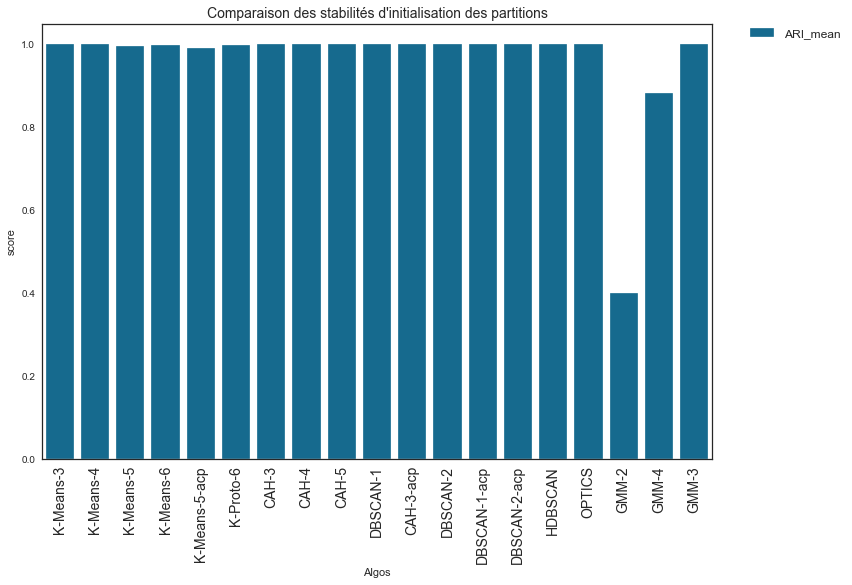

In [330]:
# Visualisation de la durée entraînement + prédiction
# ---------------------------------------------------------------------
# Comparaison visuelle des 7 algorithmes
comparaison_satbinit_melt = pd.melt(df_stabilite_init, id_vars=['Algos'],
                                    value_name='score',
                                    value_vars=['ARI_mean'])
# Visualisation
plt.figure(figsize=(12, 8))
sns.barplot(x=comparaison_satbinit_melt['Algos'],
            y=comparaison_satbinit_melt['score'],
            hue=comparaison_satbinit_melt['variable'])
plt.title('Comparaison des stabilités d\'initialisation des partitions',
          fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=12)
plt.xticks(rotation=90, fontsize=14)
plt.show()

- Pour les 3 algorithmes les plus performants, la stabilité d'initialisation (proche de 1) est favorable à **K-Means et K-Prototype** et défavorable à **GMM**.

**Bilan** :
- Les 2 algorithmes les plus performants sont **K-Means** (variables quantitatives) et **K-Prototype** (variables mixtes).

## <span style='background:Thistle'>11. Stabilité des clusters au cours du temps</span>

In [505]:
# Copie du jeu de données
df_stab = data.copy()
df_stab = df_stab.reset_index()

In [507]:
# Détermination des dates de référence
# ---------------------------------------------------------------------
# Date de référence de la période complète ?
date_reference = df_stab['date_dernier_achat'].max()
print(f'Data de référence période complète : {date_reference}')
# Data de référence transformée
date_reference = pd.to_datetime(date_reference,
                                format='%Y-%m-%d %H:%M:%S')
# Data de référence de la première période historique - 1 mois
data_ref_1mois = date_reference - pd.DateOffset(months=1)
print(f'Data de référence histo - 1 mois : {data_ref_1mois}')
# Data de référence de la première période historique - 2 mois
data_ref_2mois = date_reference - pd.DateOffset(months=2)
print(f'Data de référence histo - 2 mois : {data_ref_2mois}')
# Data de référence de la première période historique - 3 mois
data_ref_3mois = date_reference - pd.DateOffset(months=3)
print(f'Data de référence histo - 3 mois : {data_ref_3mois}')
# Data de référence de la première période historique - 4 mois
data_ref_4mois = date_reference - pd.DateOffset(months=4)
print(f'Data de référence histo - 4 mois : {data_ref_2mois}')
# Data de référence de la première période historique - 5 mois
data_ref_5mois = date_reference - pd.DateOffset(months=5)
print(f'Data de référence histo - 5 mois : {data_ref_2mois}')
# Data de référence de la première période historique - 6 mois
data_ref_6mois = date_reference - pd.DateOffset(months=6)
print(f'Data de référence histo - 6 mois : {data_ref_6mois}')
# Data de référence de la première période historique - 7 mois
data_ref_7mois = date_reference - pd.DateOffset(months=7)
print(f'Data de référence histo - 7 mois : {data_ref_7mois}')
# Data de référence de la première période historique - 8 mois
data_ref_8mois = date_reference - pd.DateOffset(months=8)
print(f'Data de référence histo - 8 mois : {data_ref_8mois}')
# Data de référence de la première période historique - 9 mois
data_ref_9mois = date_reference - pd.DateOffset(months=9)
print(f'Data de référence histo - 9 mois : {data_ref_9mois}')
# Data de référence de la première période historique - 10 mois
data_ref_10mois = date_reference - pd.DateOffset(months=10)
print(f'Data de référence histo - 10 mois : {data_ref_10mois}')
# Data de référence de la première période historique - 11 mois
data_ref_11mois = date_reference - pd.DateOffset(months=11)
print(f'Data de référence histo - 11 mois : {data_ref_11mois}')
# Data de référence de la première période historique - 1 an
data_ref_12mois = date_reference - pd.DateOffset(months=12)
print(f'Data de référence histo - 1 an : {data_ref_12mois}')

<span style='background:PowderBlue; font-size:16px'>**11.1. Stabilité KMeans 6 clusters sur 1 an**</span>

**Protocole** :
***
- On conserve un dataframe de référence.
- On sélectionne les clients sur une période historique (ex 1 mois).
- On entraine un algorithme KMeans sur cette période historique ==> les clients sont classés dans des groupes.
- On entraîne un algorithme KMeans sur la période de référence, en ne conservant que les clients présents sur la période historique ==> les clients sont classés dans des groupes.
- On compare les groupes des clients.

In [506]:
# Dataframe de sauvegarde des métriques de stabilité du dataframe
df_resultats_km = pd.DataFrame({})

In [508]:
# Score de stabilité ARI sur la période juillet-août 2018 - 1 mois
df_resultats_km, df_hist_1mois, df_ref_1mois = \
    outils_segmentation.segmentation_kmean_periode(df_stab,
                                                   df_resultats_km,
                                                   data_ref_1mois,
                                                   '1 mois_Juillet_août',
                                                   6)

In [509]:
# Score de stabilité ARI sur la période juin-août 2018 - 2 mois
df_resultats_km, df_hist_2mois, df_ref_2mois = \
    outils_segmentation.segmentation_kmean_periode(df_stab,
                                                   df_resultats_km,
                                                   data_ref_2mois,
                                                   '2 mois_Juin_août',
                                                   6)

In [510]:
# Score de stabilité ARI sur la période mai-août 2018 - 3 mois
df_resultats_km, df_hist_3mois, df_ref_3mois = \
    outils_segmentation.segmentation_kmean_periode(df_stab,
                                                   df_resultats_km,
                                                   data_ref_3mois,
                                                   '3 mois_Mai_août',
                                                   6)

In [511]:
# Score de stabilité ARI sur la période Avril-août 2018 - 4 mois
df_resultats_km, df_hist_4mois, df_ref_4mois = \
    outils_segmentation.segmentation_kmean_periode(df_stab,
                                                   df_resultats_km,
                                                   data_ref_4mois,
                                                   '4 mois_Avril_août',
                                                   6)

In [512]:
# Score de stabilité ARI sur la période mars-août 2018 - 5 mois
df_resultats_km, df_hist_5mois, df_ref_5mois = \
    outils_segmentation.segmentation_kmean_periode(df_stab,
                                                   df_resultats_km,
                                                   data_ref_5mois,
                                                   '5 mois_Mars_août',
                                                   6)

In [513]:
# Score de stabilité ARI sur la période février-août 2018 - 6 mois
df_resultats_km, df_hist_6mois, df_ref_6mois = \
    outils_segmentation.segmentation_kmean_periode(df_stab,
                                                   df_resultats_km,
                                                   data_ref_6mois,
                                                   '6 mois_Février_août',
                                                   6)

In [514]:
# Score de stabilité ARI sur la période janvier-août 2018 - 7 mois
df_resultats_km, df_hist_7mois, df_ref_7mois = \
    outils_segmentation.segmentation_kmean_periode(df_stab,
                                                   df_resultats_km,
                                                   data_ref_7mois,
                                                   '7 mois_Janvier_août',
                                                    6)

In [515]:
# Score de stabilité ARI sur la période décembre-août 2018 - 8 mois
df_resultats_km, df_hist_8mois, df_ref_8mois = \
    outils_segmentation.segmentation_kmean_periode(df_stab,
                                                   df_resultats_km,
                                                   data_ref_8mois,
                                                   '8 mois_Décembre_août',
                                                   6)

In [516]:
# Score de stabilité ARI sur la période novembre-août 2018 - 9 mois
df_resultats_km, df_hist_9mois, df_ref_9mois = \
    outils_segmentation.segmentation_kmean_periode(df_stab,
                                                   df_resultats_km,
                                                   data_ref_9mois,
                                                   '9 mois_Novembre_août',
                                                   6)

In [517]:
# Score de stabilité ARI sur la période octobre-août 2018 - 10 mois
df_resultats_km, df_hist_10mois, df_ref_10mois = \
    outils_segmentation.segmentation_kmean_periode(df_stab,
                                                   df_resultats_km,
                                                   data_ref_10mois,
                                                   '10 mois_Octobre_août',
                                                   6)

In [518]:
# Score de stabilité ARI sur la période septembre-août 2018 - 11 mois
df_resultats_km, df_hist_11mois, df_ref_11mois = \
    outils_segmentation.segmentation_kmean_periode(df_stab,
                                                   df_resultats_km,
                                                   data_ref_11mois,
                                                   '11 mois_Septembre_août',
                                                   6)

In [519]:
# Score de stabilité ARI sur la période septembre 2017 -août 2018 - 1
df_resultats_km, df_hist_1an, df_ref_1an = \
    outils_segmentation.segmentation_kmean_periode(df_stab,
                                                   df_resultats_km,
                                                   data_ref_12mois,
                                                   '1an_aout17_août18',
                                                   6)

In [520]:
df_resultats_km.style.hide_index()

Periode,Date,ARI
1 mois_Juillet_août,2018-07-29 15:00:37,0.74177
2 mois_Juin_août,2018-06-29 15:00:37,0.99227
3 mois_Mai_août,2018-05-29 15:00:37,0.74459
4 mois_Avril_août,2018-04-29 15:00:37,1.00000
5 mois_Mars_août,2018-03-29 15:00:37,0.98631
6 mois_Février_août,2018-02-28 15:00:37,0.99824
7 mois_Janvier_août,2018-01-29 15:00:37,0.99232
8 mois_Décembre_août,2017-12-29 15:00:37,0.99993
9 mois_Novembre_août,2017-11-29 15:00:37,0.97904
10 mois_Octobre_août,2017-10-29 15:00:37,0.99182


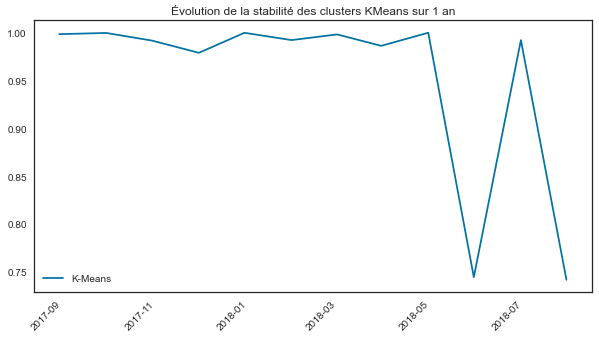

In [521]:
# Visualisation graphique
plt.figure(figsize=(10, 5))
x = df_resultats_km['Date']
plt.plot(df_resultats_km['Date'], df_resultats_km['ARI'], label='K-Means')
plt.legend()
plt.title('Évolution de la stabilité des clusters KMeans sur 1 an')
plt.xticks(rotation='45', horizontalalignment="right")

plt.show()

**Bilan** :
***
- KMeans est relativement stable sur les 6 premiers mois et moins stable sur les 6 derniers, avec une baisse de la stabilité tous les 3 derniers mois.    

<span style='background:PowderBlue; font-size:16px'>**11.2. Stabilité K-Prototype 6 clusters sur 1 an**</span>

In [533]:
# Dataframe de sauvegarde des métriques de stabilité du dataframe
df_resultats_kp = pd.DataFrame({})

In [534]:
# Score de stabilité ARI sur la période juillet-août 2018 - 1 mois
df_resultats_kp, df_hist_1mois_kp, df_ref_1mois_kp = \
    outils_segmentation.segmentation_kproto_periode(df_stab,
                                                    df_resultats_kp,
                                                    data_ref_1mois,
                                                    '1 mois_Juillet_août',
                                                    6)

In [535]:
# Score de stabilité ARI sur la période juin-août 2018 - 2 mois
df_resultats_kp, df_hist_2mois_kp, df_ref_2mois_kp = \
    outils_segmentation.segmentation_kproto_periode(df_stab,
                                                    df_resultats_kp,
                                                    data_ref_2mois,
                                                    '2 mois_Juin_août',
                                                    6)

In [536]:
# Score de stabilité ARI sur la période mai-août 2018 - 3 mois
df_resultats_kp, df_hist_3mois_kp, df_ref_3mois_kp = \
    outils_segmentation.segmentation_kproto_periode(df_stab,
                                                    df_resultats_kp,
                                                    data_ref_3mois,
                                                    '3 mois_Mai_août',
                                                    6)

In [537]:
# Score de stabilité ARI sur la période Avril-août 2018 - 4 mois
df_resultats_kp, df_hist_4mois_kp, df_ref_4mois_kp = \
    outils_segmentation.segmentation_kproto_periode(df_stab,
                                                    df_resultats_kp,
                                                    data_ref_4mois,
                                                    '4 mois_Avril_août',
                                                    6)

In [538]:
# Score de stabilité ARI sur la période mars-août 2018 - 5 mois
df_resultats_kp, df_hist_5mois_kp, df_ref_5mois_kp = \
    outils_segmentation.segmentation_kproto_periode(df_stab,
                                                    df_resultats_kp,
                                                    data_ref_5mois,
                                                    '5 mois_Mars_août',
                                                    6)

In [539]:
# Score de stabilité ARI sur la période février-août 2018 - 6 mois
df_resultats_kp, df_hist_6mois_kp, df_ref_6mois_kp = \
    outils_segmentation.segmentation_kproto_periode(df_stab,
                                                    df_resultats_kp,
                                                    data_ref_6mois,
                                                    '6 mois_Février_août',
                                                    6)

In [540]:
# Score de stabilité ARI sur la période janvier-août 2018 - 7 mois
df_resultats_kp, df_hist_7mois_kp, df_ref_7mois_kp = \
    outils_segmentation.segmentation_kproto_periode(df_stab,
                                                    df_resultats_kp,
                                                    data_ref_7mois,
                                                    '7 mois_Janvier_août',
                                                    6)

7:54: E127 52


In [541]:
# Score de stabilité ARI sur la période décembre-août 2018 - 8 mois
df_resultats_kp, df_hist_8mois_kp, df_ref_8mois_kp = \
    outils_segmentation.segmentation_kproto_periode(df_stab,
                                                    df_resultats_kp,
                                                    data_ref_8mois,
                                                    '8 mois_Décembre_août',
                                                    6)

In [542]:
# Score de stabilité ARI sur la période novembre-août 2018 - 9 mois
df_resultats_kp, df_hist_9mois_kp, df_ref_9mois_kp = \
    outils_segmentation.segmentation_kproto_periode(df_stab,
                                                    df_resultats_kp,
                                                    data_ref_9mois,
                                                    '9 mois_Novembre_août',
                                                    6)

In [543]:
# Score de stabilité ARI sur la période octobre-août 2018 - 10 mois
df_resultats_kp, df_hist_10mois_kp, df_ref_10mois_kp = \
    outils_segmentation.segmentation_kproto_periode(df_stab,
                                                    df_resultats_kp,
                                                    data_ref_10mois,
                                                    '10 mois_Octobre_août',
                                                    6)

In [544]:
# Score de stabilité ARI sur la période septembre-août 2018 - 11 mois
df_resultats_kp, df_hist_11mois_kp, df_ref_11mois_kp = \
    outils_segmentation.segmentation_kproto_periode(df_stab,
                                                    df_resultats_kp,
                                                    data_ref_11mois,
                                                    '11 mois_Septembre_août',
                                                    6)

In [545]:
# Score de stabilité ARI sur la période septembre 2017 -août 2018 - 1
df_resultats_kp, df_hist_1an_kp, df_ref_1an_kp = \
    outils_segmentation.segmentation_kproto_periode(df_stab,
                                                    df_resultats_kp,
                                                    data_ref_12mois,
                                                    '1an_aout17_août18',
                                                    6)

In [546]:
df_resultats_kp.style.hide_index()

Periode,Date,ARI
1 mois_Juillet_août,2018-07-29 15:00:37,0.99723
2 mois_Juin_août,2018-06-29 15:00:37,0.99889
3 mois_Mai_août,2018-05-29 15:00:37,0.74057
4 mois_Avril_août,2018-04-29 15:00:37,0.71898
5 mois_Mars_août,2018-03-29 15:00:37,0.88621
6 mois_Février_août,2018-02-28 15:00:37,0.99899
7 mois_Janvier_août,2018-01-29 15:00:37,0.99934
8 mois_Décembre_août,2017-12-29 15:00:37,0.99680
9 mois_Novembre_août,2017-11-29 15:00:37,0.56735
10 mois_Octobre_août,2017-10-29 15:00:37,0.98276


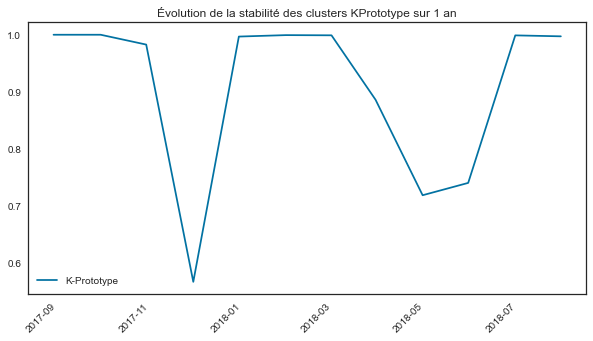

In [548]:
# Visualisation graphique
plt.figure(figsize=(10, 5))
x = df_resultats_km['Date']
plt.plot(df_resultats_kp['Date'], df_resultats_kp['ARI'],
         label='K-Prototype')
plt.legend()
plt.title('Évolution de la stabilité des clusters KPrototype sur 1 an')
plt.xticks(rotation='45', horizontalalignment="right")

plt.show()

**K-Prototype** est moins stable que K-Means surtout pour les 3 derniers mois.